# General imports for plots

In [1]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm #for better display of FITS images

%matplotlib notebook

plt.rc('figure', figsize=(9,3))
plt.rcParams["image.cmap"] = "inferno"

# Interpolation tests

## Imports

In [112]:
from scipy.interpolate import UnivariateSpline, lagrange
from scipy.interpolate import Akima1DInterpolator, BarycentricInterpolator,PchipInterpolator

In [2]:
import scipy as sp

In [3]:
import numpy as np

In [4]:
from custom_numpy import arange_R_cst, arange_2d, is_sorted
from simulation_utils import gauss_ker, gaussian, SegmentedLagrange

## Def interpolations method

In [60]:
def getNDDCoeffs(x, y):
    """ Creates NDD pyramid and extracts coeffs """
    n = np.shape(y)[0]
    pyramid = np.zeros([n, n]) # Create a square matrix to hold pyramid
    pyramid[::,0] = y # first column is y
    for j in range(1,n):
        for i in range(n-j):
            # create pyramid by updating other columns
            pyramid[i][j] = (pyramid[i+1][j-1] - pyramid[i][j-1]) / (x[i+j] - x[i])
    return pyramid[0] # return first row


class Newton():
    
    def __init__(self, grid, grid_f):
        
        coeff_vector = getNDDCoeffs(grid, grid_f)
        
        # create as many polynomials as size of coeff_vector
        final_pol = np.polynomial.Polynomial([0.]) # our target polynomial
        n = coeff_vector.shape[0] # get number of coeffs
        for i in range(n):
            p = np.polynomial.Polynomial([1.]) # create a dummy polynomial
            for j in range(i):
                # each vector has degree of i
                # their terms are dependant on 'x' values
                p_temp = np.polynomial.Polynomial([-grid[j], 1.]) # (x - x_j)
                p = np.polymul(p, p_temp) # multiply dummy with expression
            p *= coeff_vector[i] # apply coefficient
            final_pol = np.polyadd(final_pol, p) # add to target polynomial

        self.p = np.flip(final_pol[0].coef, axis=0)
        
    def __call__(self, x):

        return np.polyval(self.p, x)

## Tests

In [7]:
lam_range = [1.05,1.15]  # microns
R_2 = 1200
R_simu = 12000
oversample = 2

x = arange_R_cst(*lam_range, oversample*R_simu)
y = 1 - 0.5*gaussian(x, sig=np.array([1.1/R_simu])/(2 * np.sqrt(2 * np.log(2))), x0=np.array([1.1]))

c2 = gauss_ker(FWHM=np.array([R_simu/R_2]), oversample=oversample)

y = np.convolve(y, c2, mode='same')

x, y = x[500:-500],y[500:-500]
fy = UnivariateSpline(x,y, s=0)
x2 = arange_R_cst(x[0],x[-1], 2*R_2)
y2 = fy(x2)

In [86]:
i_newton = slice(57,63)
y_newton = Newton(x2[i_newton]-x2[i_newton].mean(),y2[i_newton])(x-x2[i_newton].mean())

In [109]:
y_spline = UnivariateSpline(x2,y2, s=0)(x)
y_lagrange = SegmentedLagrange(x2,y2,5, extrapolate=True)(x)

In [113]:
y_test = lagrange(x2[57:61]-x2[57:61].mean(),y2[57:61])(x-x2[57:61].mean())
y_pchip = PchipInterpolator(x2[56:62]-x2[56:62].mean(),y2[56:62])(x-x2[56:62].mean())

<IPython.core.display.Javascript object>


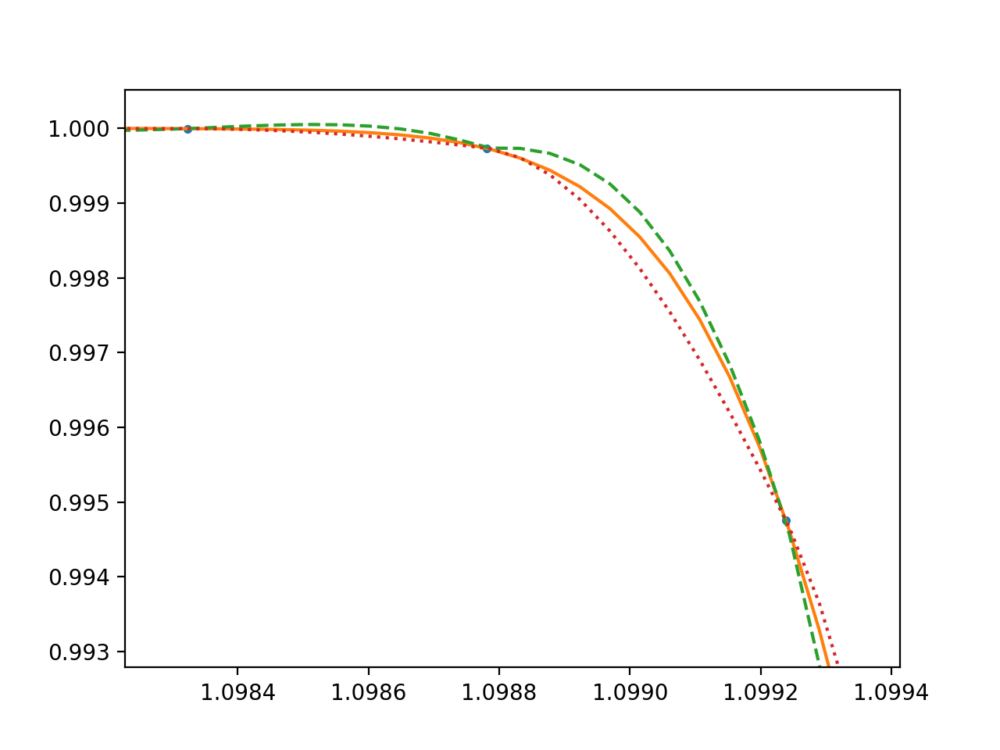

(0.965, 1.002)

In [115]:
plt.plot(x2,y2,".")
plt.plot(x,y)
# plt.plot(x2[55:65],y2[55:65],"x")
plt.plot(x,y_lagrange,"--")
plt.plot(x,y_pchip,":")

plt.ylim(0.965,1.002)

In [33]:

plt.plot(x,SegmentedLagrange(x2,y2,21, extrapolate=True)(x))

In [116]:
y_akima = Akima1DInterpolator(x2,y2)(x)
y_pchip = PchipInterpolator(x2,y2)(x)

<IPython.core.display.Javascript object>


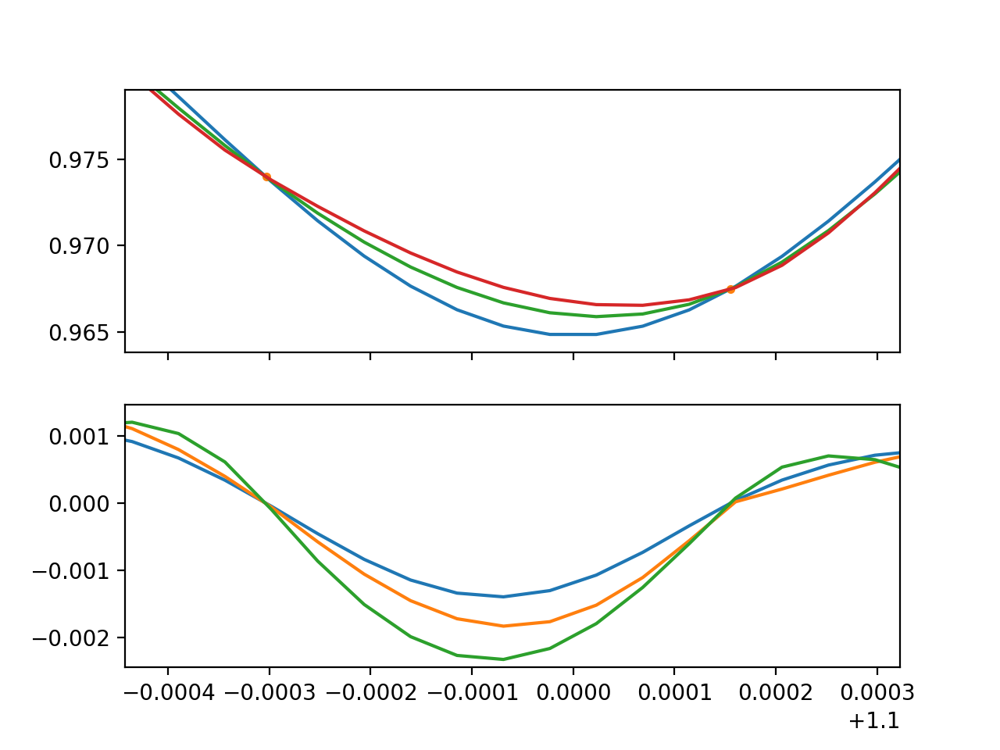

In [120]:
fig, ax = plt.subplots(2,1,sharex=True)

ax[0].plot(x,y)
ax[0].plot(x2,y2,".")
ax[0].plot(x,y_spline)
# ax[0].plot(x,y_lagrange)
ax[0].plot(x,y_akima)
# ax[0].plot(x,y_pchip)

ax[1].plot(x,(y-y_spline)/y)
ax[1].plot(x,(y-y_lagrange)/y)
ax[1].plot(x,(y-y_akima)/y)
# ax[1].plot(x,(y-y_pchip)/y)

# Extraction tests

## Imports from standard packages

In [2]:
import numpy as np
from scipy.interpolate import interp1d
from astropy.io import fits
# from astropy.convolution import convolve, Box1DKernel

## Local imports

In [3]:
from extract.overlap import TrpzOverlap
from extract.utils import get_soss_grid, grid_from_map, oversample_grid
from extract.throughput import ThroughputSOSS
from extract.convolution import WebbKer

# Read ref files

In [4]:
from extract.convolution import NyquistKer

In [5]:
from extract.convolution import fwhm2sigma, gaussians

class GaussKer:

    def __init__(self, grid, res, bounds_error=False,
                 fill_value="extrapolate", **kwargs):
        """
        Parameters
        ----------
        grid : 1d array
            Grid used to define the kernels
        fwhm: ...
            ...
        bounds_error, fill_value and kwargs:
            `interp1d` kwargs used to get FWHM as a function of the grid.
        """
        fwhm = grid / res
        
        # What we really want is sigma, not FWHM
        sig = fwhm2sigma(fwhm)

        # Now put sigma as a function of the grid
        sig = interp1d(grid, sig, bounds_error=bounds_error,
                       fill_value=fill_value, **kwargs)

        self.fct_sig = sig

    def __call__(self, x, x0):
        """
        Parameters
        ----------
        x: 1d array
            position where the kernel is evaluated
        x0: 1d array (same shape as x)
            position of the kernel center for each x.

        Returns
        -------
        Value of the gaussian kernel for each sets of (x, x0)
        """

        # Get the sigma of each gaussians
        sig = self.fct_sig(x0)

        return gaussians(x, x0, sig)


In [154]:
# WebbKer.file_frame = 'gauss_kernel_matrix_os_{}_width_{}pixels.fits'
# WebbKer.file_frame = "spectral_kernel_matrix_os_{}_width_{}pixels.fits"
WebbKer.file_frame = "spectral_kernel_matrix_os_{}_width_{}pixels_cut.fits"
WebbKer.path = ''
# WebbKer.path = "../jwst-mtl/SOSS/extract/Ref_files/spectral_kernel_matrix/"

<IPython.core.display.Javascript object>


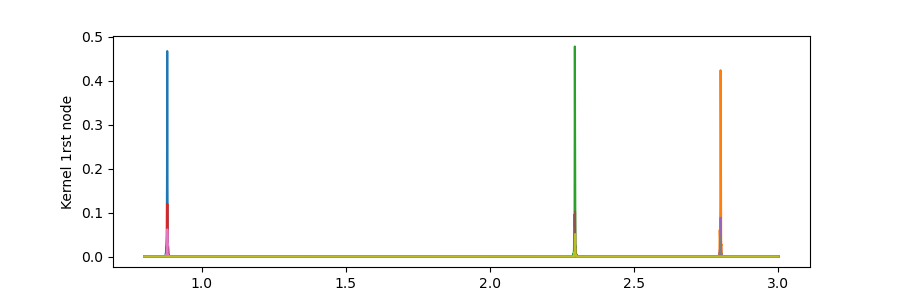

<IPython.core.display.Javascript object>


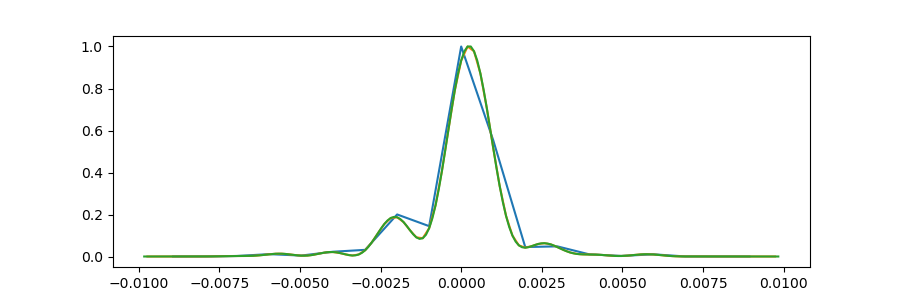

21


<IPython.core.display.Javascript object>


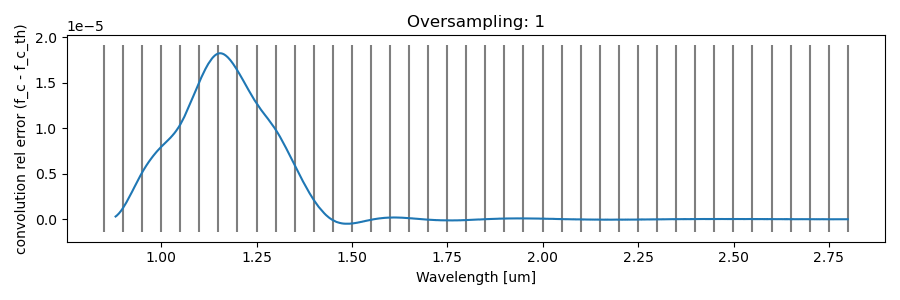

<IPython.core.display.Javascript object>


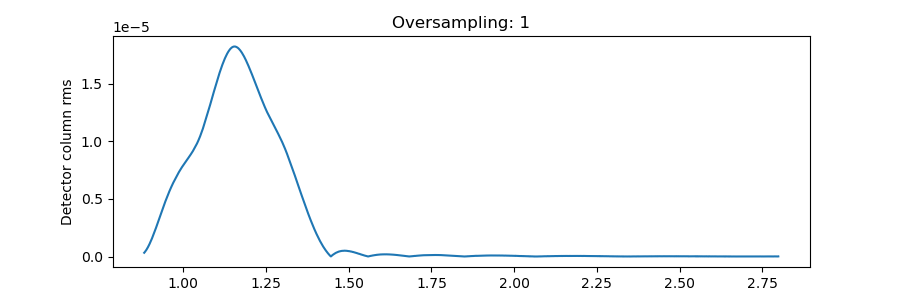

[1452, 1482] [1527, 1567] (1967, 2249)


/Users/antoinedb/anaconda3/envs/extraction/lib/python3.7/site-packages/ipykernel_launcher.py:126: RuntimeWarning: Mean of empty slice


<IPython.core.display.Javascript object>


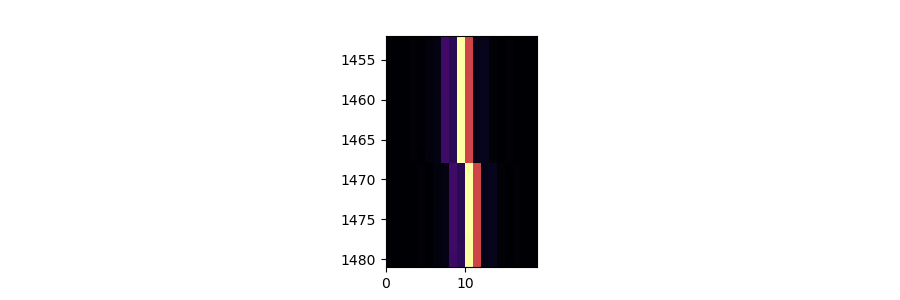

<IPython.core.display.Javascript object>


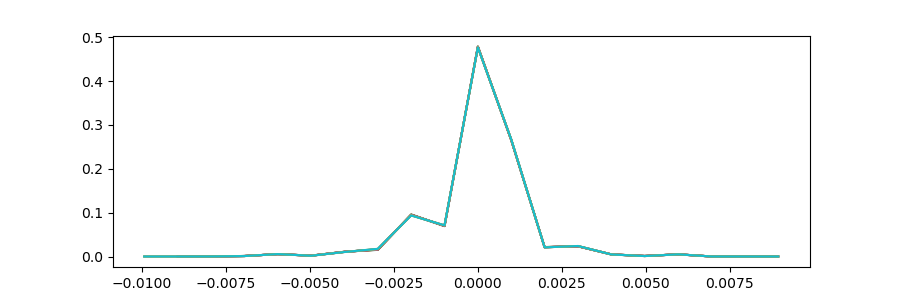

(1967, 20)
101


<IPython.core.display.Javascript object>


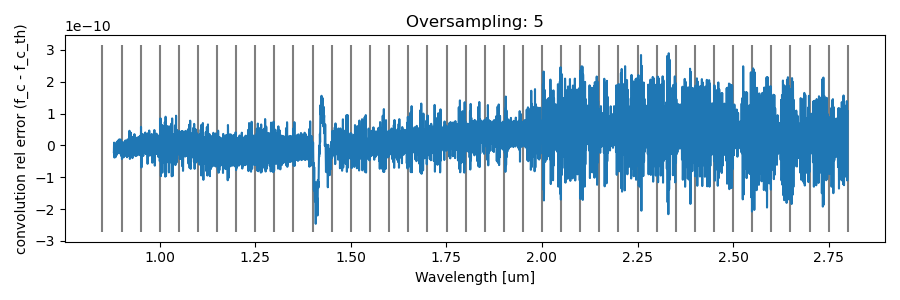

<IPython.core.display.Javascript object>


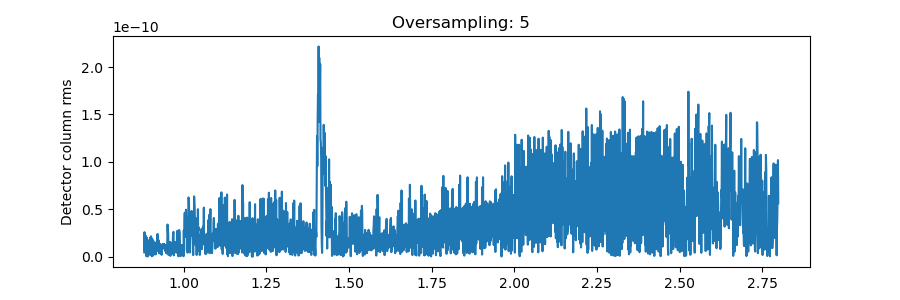

/Users/antoinedb/anaconda3/envs/extraction/lib/python3.7/site-packages/ipykernel_launcher.py:126: RuntimeWarning: Mean of empty slice


[7265, 7415] [7638, 7838] (9836, 11241)


<IPython.core.display.Javascript object>


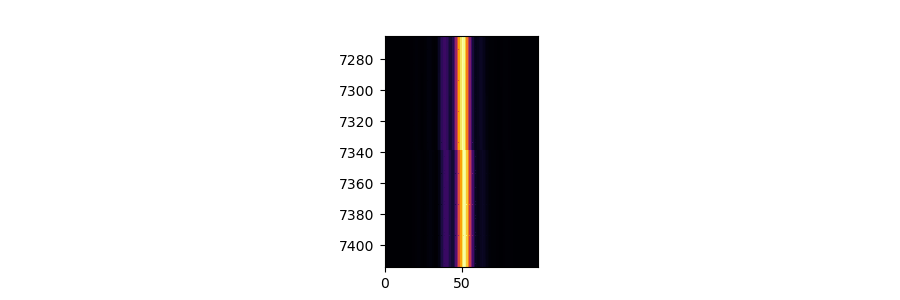

<IPython.core.display.Javascript object>


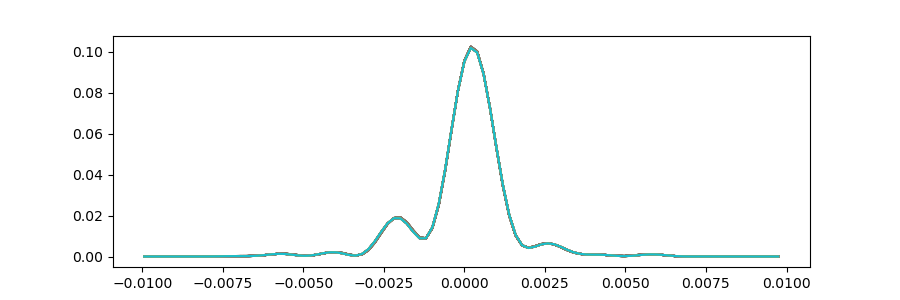

(9836, 100)
201


<IPython.core.display.Javascript object>


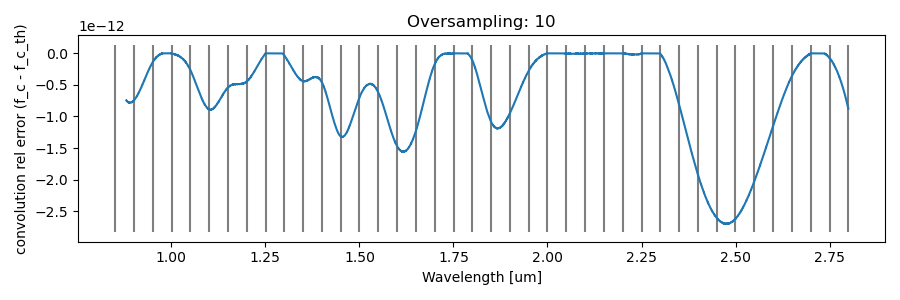

<IPython.core.display.Javascript object>


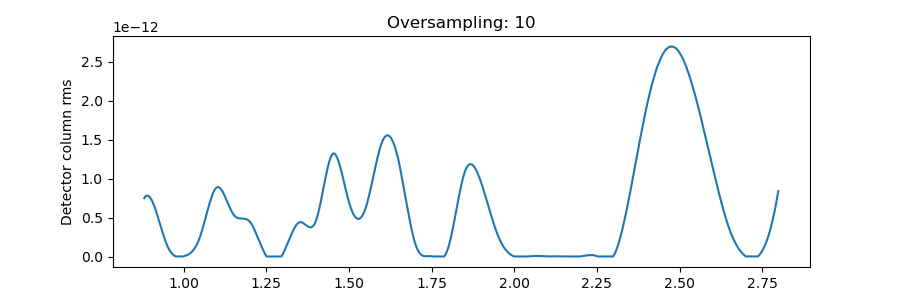

/Users/antoinedb/anaconda3/envs/extraction/lib/python3.7/site-packages/ipykernel_launcher.py:126: RuntimeWarning: Mean of empty slice


[14530, 14830] [15276, 15676] (19671, 22481)


<IPython.core.display.Javascript object>


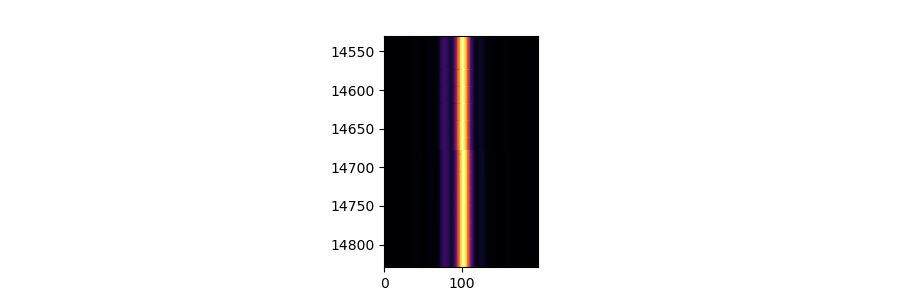

<IPython.core.display.Javascript object>


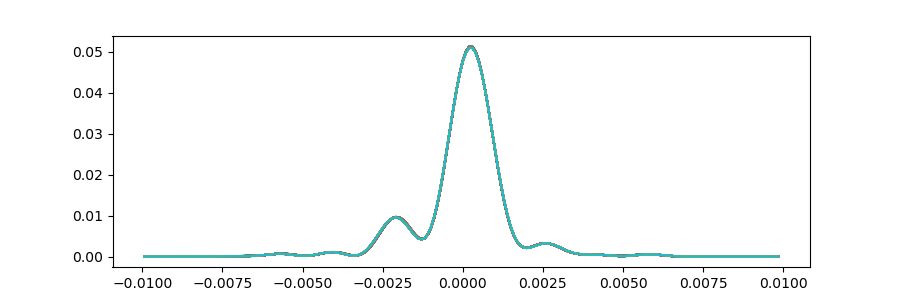

(19671, 200)


In [163]:
from extract.overlap import TrpzOverlap, unsparse
from extract.utils import grid_from_map, oversample_grid
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits


# List of orders to consider in the extraction
order_list = [1]

path = "../jwst-mtl/SOSS/extract/Ref_files/"

#### Wavelength solution ####
wave_maps = []
wave_maps.append(fits.getdata(path + "wavelengths_m1.fits"))

#### Spatial profiles ####
spat_pros = []
spat_pros.append(fits.getdata(path + "spat_profile_m1.fits").squeeze())

# Convert data from fits files to float (fits precision is 1e-8)
wave_maps = [wv.astype('float64') for wv in wave_maps]
spat_pros = [p_ord.astype('float64') for p_ord in spat_pros]

# no tilt
wave_maps = [np.tile(wv_map[50], (wv_map.shape[0], 1)) for wv_map in wave_maps]

#### Throughputs ####
def fct_ones(x): return 1/x
thrpt_list = [fct_ones for order in order_list]

#### Convolution kernels ####
wv_map_ker = wave_maps[0][50]#grid_from_map(wave_maps[0], spat_pros[0])
# ker_list = [WebbKer(wv_map_ker[None, :])]
ker_list = [WebbKer(wave_maps[0])]
# ker_list = [GaussKer(np.linspace(0.5, 3.0, 10000), res=800) for wv_map in wave_maps]

# Put all inputs from reference files in a list
ref_files_args = [spat_pros, wave_maps, thrpt_list, ker_list]

def flux_fct(wv): return 1e5 - 1e4 * wv

# Grid
lam_simu = grid_from_map(wave_maps[0][50:51], spat_pros[0][50:51], n_os=10, wv_range=[0.8, 3.0])
# lam_simu = grid_from_map(wave_maps[0], spat_pros[0], n_os=10, wv_range=[0.8, 3.0])

# Init simu
simu = TrpzOverlap(*ref_files_args, lam_grid=lam_simu, thresh=1e-8,
                   orders=[1], c_kwargs={'n_out':[5*10, 8*10], 'length':21*10+1})

f_c_th = simu.c_list[0].dot(flux_fct(simu.lam_grid))
wv_th = simu.lam_grid_c(0)
fct_f_c_th = interp1d(wv_th, f_c_th, bounds_error=False, fill_value=np.nan, kind='cubic')

scidata = simu.rebuild(flux_fct, orders=[0])

# fig, ax = plt.subplots(4, 2, figsize=(6, 10))

# n_os_list = [1, 2, 3, 5, 8, 11, 14, 15]
n_os_list = [1, 5, 10]
# n_os_list=np.arange(1, 16)

plt.figure()
ax_ker = plt.gca()
plt.ylabel("Kernel 1rst node")

plt.figure()
ax_center_ker = plt.gca()


# ax = ax.ravel()
std_list = []
i_first = True
for i_os, oversample in enumerate(n_os_list):
    #
    ### Simulation ###
    #

    # Grid
    lam_simu = grid_from_map(wave_maps[0][50:51], spat_pros[0][50:51], n_os=oversample, wv_range=[0.8, 3.0])
    
    # Init simu
    length_ker = 20*oversample + ((20*oversample)%2 == 0)
    print(length_ker)
    simu = TrpzOverlap(*ref_files_args, lam_grid=lam_simu, thresh=1e-8,
                       orders=[1], lam_bounds=[[0.88, 2.8]],
                       c_kwargs={'thresh_out': 1e-12, 'length':length_ker})
    
    if i_first:
        i_ker_list = [0, len(simu.lam_grid_c(0))-1]
        lam_ker_list = simu.lam_grid_c(0)[i_ker_list]
        i_first = False
#         lam_ker_list = np.append(lam_ker_list, 1.0913)
        lam_ker_list = np.append(lam_ker_list, 2.2945)
#         2.48205
    
    f_c = simu.c_list[0].dot(flux_fct(lam_simu))
    
    fig, ax = plt.subplots(1, 1, sharex=True)
    ax = [ax]
    ax[0].set_title(f"Oversampling: {oversample}")
#     plt.plot(wv_th, f_c_th)
#     plt.plot(simu.lam_grid_c(0), f_c, ".-") 
#     plt.plot(simu.lam_grid_c(0), fct_f_c_th(simu.lam_grid_c(0)))
    coeff = np.polyfit(simu.lam_grid_c(0)[:-1], np.diff(simu.lam_grid_c(0)), 7)
    fct_d_grid = np.poly1d(coeff)
#     ax[0].plot(simu.lam_grid_c(0)[:-1], np.diff(simu.lam_grid_c(0)) - fct_d_grid(simu.lam_grid_c(0)[:-1]))
    ax[-1].plot(simu.lam_grid_c(0), (f_c - fct_f_c_th(simu.lam_grid_c(0)))/f_c)
    ax[-1].vlines(ker_list[0].wv_center, *ax[-1].get_ylim(), alpha=0.5)
    ax[-1].set_ylabel("convolution rel error (f_c - f_c_th)")
    ax[-1].set_xlabel("Wavelength [um]")
    plt.tight_layout()
#     fig.savefig(f"Convolution_problem/conv_error_n_os_{oversample}_webb_ker_negative.png")
    plt.show()
    
#     plt.figure()
#     plt.plot(simu.lam_grid_c(0), f_c)
#     plt.show()
      
    rebuilt = simu.rebuild(flux_fct, orders=[0])
    
    err = ((rebuilt-scidata)/scidata)
    plt.figure()
#     plt.imshow(np.abs(err), interpolation=None, norm=LogNorm())
#     plt.colorbar()
    y_plot = np.sqrt(np.nanmean(err**2, axis=0))
    i_plot = np.isfinite(y_plot)
    x_plot = wave_maps[0][50][i_plot]
    y_plot = y_plot[i_plot]
    plt.title(f"Oversampling: {oversample}")
    plt.plot(x_plot, y_plot)
    plt.ylabel("Detector column rms")
#     plt.ylim(0, 1e-8)
    plt.show()
    
    for lam_ker in lam_ker_list:
        i_ker = np.argmin(np.abs(simu.lam_grid_c(0) - lam_ker))
        ax_ker.plot(simu.lam_grid, simu.c_list[0].toarray()[i_ker])
    
    ######## Conv matrix plots #############
#     plt.figure()
    i_ker1 = np.argmin(np.abs(simu.lam_grid_c(0) - lam_ker_list[0]))
    i_ker2 = np.argmax(simu.c_list[0].toarray()[i_ker1])
    range1 = [int(np.max([i_ker1-20*oversample, 0])), int(i_ker1+20*oversample)]
    range2 = [np.max([i_ker2-20*oversample, 0]), i_ker2+20*oversample]
#     plt.gca().set_aspect('equal')
#     plt.gca().invert_yaxis()
#     plt.pcolormesh(np.arange(*range2), np.arange(*range1),
#                    simu.c_list[0].toarray()[slice(*range1), slice(*range2)],
#                   norm=LogNorm())
#     plt.colorbar()
#     plt.show()
    
#     plt.figure()
    i_ker1 = np.argmin(np.abs(simu.lam_grid_c(0) - lam_ker_list[-1]))
    i_ker2 = np.argmax(simu.c_list[0].toarray()[i_ker1])
    range1 = [int(i_ker1-10*oversample),
              int(np.min([i_ker1+20*oversample, simu.c_list[0].shape[0]]))]
    range2 = [i_ker2-20*oversample, np.min([i_ker2+20*oversample, simu.c_list[0].shape[-1]])]
#     plt.imshow(simu.c_list[0].toarray()[slice(*range1), slice(*range2)],
#                interpolation=None, norm=LogNorm())
    print(range1, range2, simu.c_list[0].shape)
#     plt.gca().set_aspect('equal')
#     plt.gca().invert_yaxis()
#     plt.pcolormesh(np.arange(*range2), np.arange(*range1), #-len(simu.lam_grid_c(0)),
#                    simu.c_list[0].toarray()[slice(*range1), slice(*range2)],
#                   norm=LogNorm())
#     plt.axhline(i_ker1, zorder=0, alpha=0.3, color="k")
#     plt.colorbar()
#     plt.show()
    
    conv_unsparse, col_ind = unsparse(simu.c_list[0])
    plt.figure()
    plt.gca().set_aspect('equal')
    plt.gca().invert_yaxis()
    plt.pcolormesh(np.arange(conv_unsparse.shape[1]), np.arange(*range1), #-len(simu.lam_grid_c(0)),
                   conv_unsparse[slice(*range1), :])
    plt.show()
    
    
    plt.figure()
    print(conv_unsparse.shape)
    x_plot = simu.lam_grid[col_ind][slice(*range1, 3), :]
    x_plot = x_plot - simu.lam_grid_c(0)[slice(*range1, 3), None]
    y_plot = conv_unsparse[slice(*range1, 3), :]
    plt.plot(x_plot.T, y_plot.T)
    plt.show()
    
    
    ax_center_ker.plot(x_plot[0], y_plot[0]/np.nanmax(y_plot[0]))    
    
    err = err[np.isfinite(err)]
    std_list.append(np.mean(np.abs(err)))
    
    
#     ax[i_os].hist(err, bins=50)
#     ax[i_os].legend([f"Oversampling: {oversample}"])

# plt.tight_layout()
# plt.show()

# Debug convolution kernel center

In [31]:
from extract import convolution 
from importlib import reload

In [41]:
reload(convolution)
from extract.convolution import WebbKer

In [37]:
WebbKer.file_frame = 'gauss_kernel_matrix_os_{}_width_{}pixels.fits'
# WebbKer.file_frame = "spectral_kernel_matrix_os_{}_width_{}pixels.fits"
WebbKer.path = ''
# WebbKer.path = "../jwst-mtl/SOSS/extract/Ref_files/spectral_kernel_matrix/"

<IPython.core.display.Javascript object>


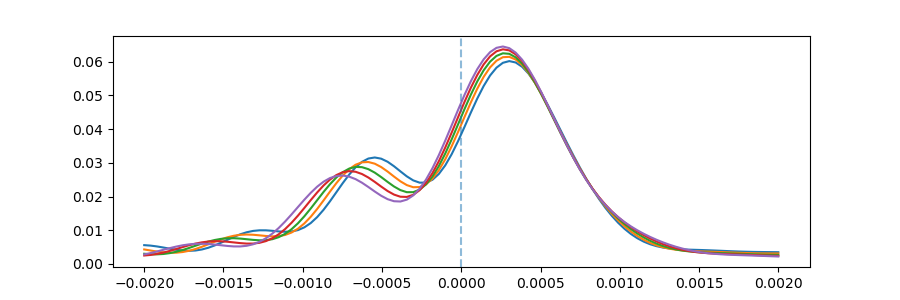

In [14]:

wv_around = np.linspace(-0.002,0.002,100)

for wv_c in [0.85, 0.9, 0.95, 1.0, 1.05]:
    x = wv_around + wv_c
    x0 = np.ones_like(x) * wv_c
    plt.plot(wv_around, ker_list[0](x, x0))

plt.axvline(0.0, linestyle="--", alpha=0.5)

In [24]:
ker_list[0].wv_center

array([0.85, 0.9 , 0.95, 1.  , 1.05, 1.1 , 1.15, 1.2 , 1.25, 1.3 , 1.35,
       1.4 , 1.45, 1.5 , 1.55, 1.6 , 1.65, 1.7 , 1.75, 1.8 , 1.85, 1.9 ,
       1.95, 2.  , 2.05, 2.1 , 2.15, 2.2 , 2.25, 2.3 , 2.35, 2.4 , 2.45,
       2.5 , 2.55, 2.6 , 2.65, 2.7 , 2.75, 2.8 ])

<IPython.core.display.Javascript object>


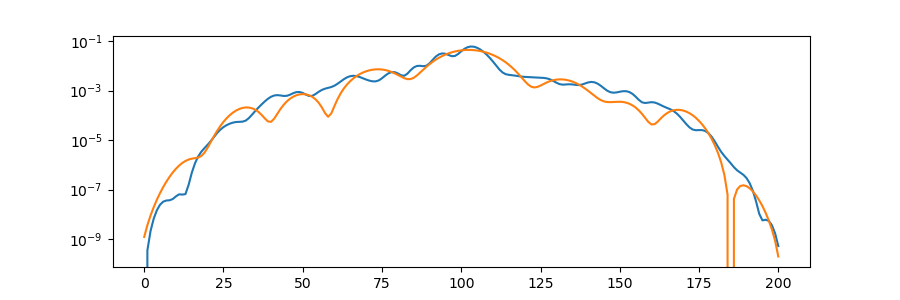

In [127]:
import numpy as np

def cut_ker_box(kernels, width=10, n_os=10, fwhm=5):
    """
    Cut kernel with a gaussian smoothed box.
    width and fhwm in pixels
    """
    kernels = kernels.copy()
    ker_width, n_ker = kernels.shape
    
    # Define box around kernel center
    width = width * n_os
    ker_hwidth = ker_width // 2
    pixel_os = np.arange(-ker_hwidth, ker_hwidth + 1)
    box = np.abs(pixel_os) <= (width / 2)
    
    # Define gaussian kernel to smooth the box
    x0 = 0.0
    sigma = fwhm2sigma(fwhm * n_os)
    g_ker = gaussians(pixel_os, x0, sigma)
    g_ker = g_ker / np.sum(g_ker)
    
    # Convolve
    box = np.convolve(box, g_ker, mode='same')
    box = box / box.max()
    
    # Apply to kernels
    kernels *= box[:, None]
    # Re-norm
    kernels /= kernels.sum(axis=0)
       
    return kernels


def gaussians(x, x0, sig, amp=None):
    """
    Gaussian function
    """

    # Amplitude term
    if amp is None:
        amp = 1/np.sqrt(2 * np.pi * sig**2)

    return amp * np.exp(-0.5*((x - x0) / sig)**2)


def fwhm2sigma(fwhm):
    """
    Convert a full width half max to a standard deviation, assuming a gaussian
    """
    return fwhm / np.sqrt(8 * np.log(2))
    

def cut_ker_mins(kernels, n_mins):
    """
    Cut the kernels at the nth minimum around the center.
    """
    kernels = kernels.copy()
    d_ker = np.diff(kernels, axis=0)
    i_switch = np.diff((d_ker >= 0), axis=0)
    i_switch = [np.where(x)[0] for x in i_switch.T]

    d2_ker = np.diff(d_ker, axis=0)

    i_min_list, i_max = [], []

    for i_sw, d2 in zip(i_switch, d2_ker.T):
        bool_index = (d2[i_sw] < 0)
        i_max.append(i_sw[bool_index])

        bool_index = (d2[i_sw] > 0)
        i_min_list.append(i_sw[bool_index])

    central_peaks = np.argmax(kernels, axis=0)

    for i_ker, i_min in enumerate(i_min_list):
        # Cut left wing
        bool_index = (i_min - central_peaks[i_ker]) < 0
        left_mins = i_min[bool_index]
        i_cut = left_mins[-n_mins[0]] + 1
        kernels[:i_cut, i_ker] = 0.0
        # Cut right wing
        bool_index = (i_min - central_peaks[i_ker]) > 0
        right_mins = i_min[bool_index]
        i_cut = right_mins[n_mins[1]] + 1
        kernels[i_cut:, i_ker] = 0

    return kernels

# kernels = cut_ker_mins(ker_list[0].ker, [4, 3])
kernels = cut_ker_box(ker_list[0].ker, width=11, n_os=10, fwhm=3)

plt.figure()
plt.semilogy(kernels[:,[0,-1]])

In [160]:
kernels.shape

(201, 95)

In [164]:
# WebbKer.file_frame = 'gauss_kernel_matrix_os_{}_width_{}pixels.fits'
# # WebbKer.file_frame = "spectral_kernel_matrix_os_{}_width_{}pixels.fits"
# WebbKer.path = ''
# # WebbKer.path = "../jwst-mtl/SOSS/extract/Ref_files/spectral_kernel_matrix/"
webbker_file = "spectral_kernel_matrix_os_10_width_21pixels.fits"
webbker_file = "../jwst-mtl/SOSS/extract/Ref_files/spectral_kernel_matrix/" + webbker_file
webbker = fits.open(webbker_file)

In [165]:
webbker.info()

Filename: ../jwst-mtl/SOSS/extract/Ref_files/spectral_kernel_matrix/spectral_kernel_matrix_os_10_width_21pixels.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       9   (95, 201, 2)   float64   


<IPython.core.display.Javascript object>


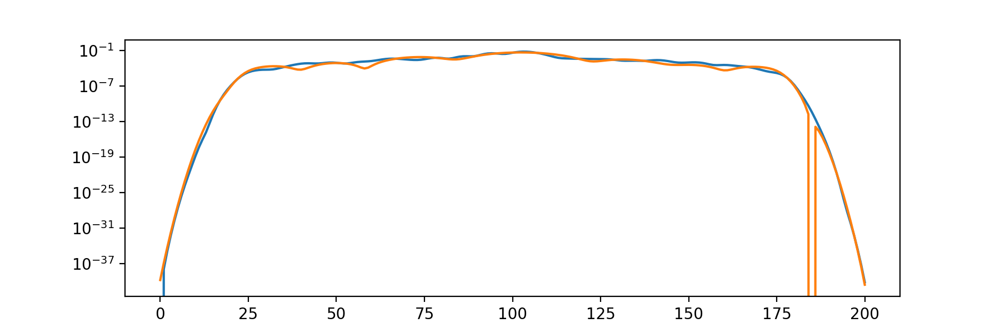

In [172]:
kernels = cut_ker_box(ker_list[0].ker, width=15, n_os=10, fwhm=0.5)

plt.figure()
plt.semilogy(kernels[:,[0,-1]])

In [168]:
kernels = cut_ker_box(webbker[0].data[0], width=15, n_os=10, fwhm=0.5)
hdu = fits.PrimaryHDU(np.array([kernels, webbker[0].data[1]]),
                      header=webbker[0].header)
hdu.writeto("spectral_kernel_matrix_os_10_width_21pixels_cut.fits", overwrite=True)

<IPython.core.display.Javascript object>


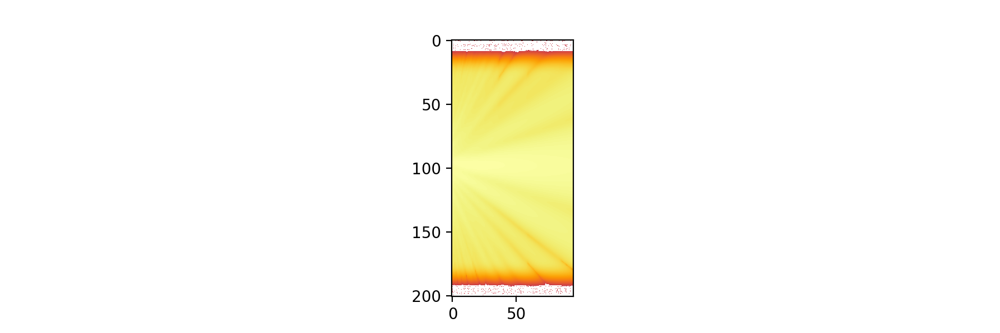

In [169]:
plt.figure()
plt.imshow(kernels, norm=LogNorm())

<IPython.core.display.Javascript object>


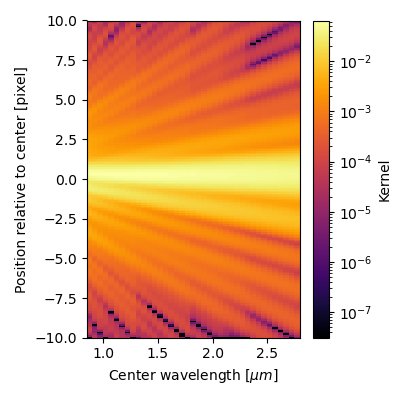

<IPython.core.display.Javascript object>


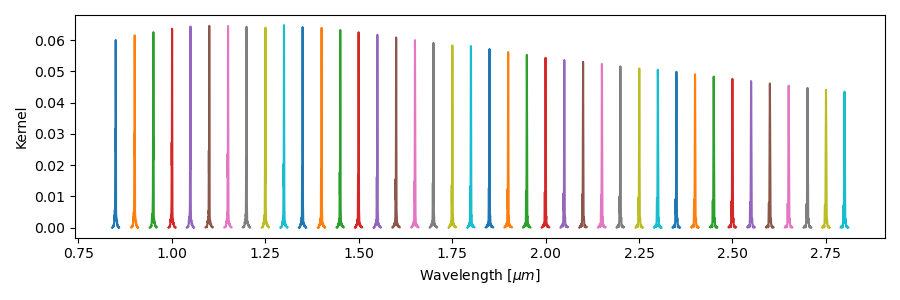

(<Figure size 400x400 with 2 Axes>, <Figure size 900x300 with 1 Axes>)

In [97]:
ker_list[0].show()

In [34]:
# Grid
lam_simu = grid_from_map(wave_maps[0], spat_pros[0], n_os=5)

# Init simu
simu = TrpzOverlap(*ref_files_args, lam_grid=lam_simu, thresh=1e-8, orders=[1], c_kwargs={'thresh':1e-8})

<IPython.core.display.Javascript object>


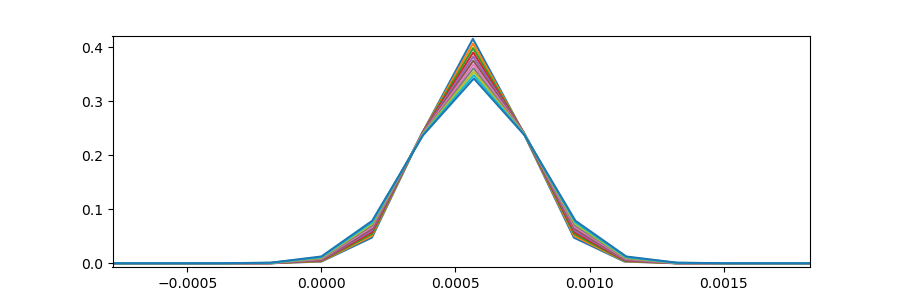

[0.85127283 1.04018111]


In [35]:

plt.figure()
i_wv_list = np.arange(50, 1051, 100)
for i_wv in i_wv_list:
    wv_c = simu.lam_grid[i_wv]
    plt.plot(simu.lam_grid-wv_c, simu.c_list[0].toarray()[i_wv])
print(simu.lam_grid[i_wv_list[[0, -1]]])

<IPython.core.display.Javascript object>


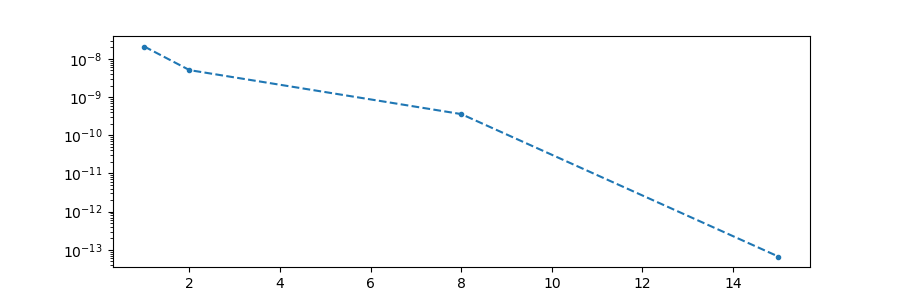

In [291]:
plt.semilogy(n_os_list, std_list, "--.")

In [105]:
# List of orders to consider in the extraction
order_list = [1, 2]

path = "../jwst-mtl/SOSS/extract/Ref_files/"

#### Wavelength solution ####
wave_maps = []
wave_maps.append(fits.getdata(path + "wavelengths_m1.fits"))
wave_maps.append(fits.getdata(path + "wavelengths_m2.fits"))

#### Spatial profiles ####
spat_pros = []
spat_pros.append(fits.getdata(path + "spat_profile_m1.fits").squeeze())
spat_pros.append(fits.getdata(path + "spat_profile_m2.fits").squeeze())

# Convert data from fits files to float (fits precision is 1e-8)
wave_maps = [wv.astype('float64') for wv in wave_maps]
spat_pros = [p_ord.astype('float64') for p_ord in spat_pros]

#### Throughputs ####
# thrpt_list = [ThroughputSOSS(order) for order in order_list]

# def fct_ones(x): return np.ones_like(x)
def fct_ones(x): return 1/x
thrpt_list = [fct_ones for order in order_list]

#### Convolution kernels ####
ker_list = [WebbKer(wv_map) for wv_map in wave_maps]

# Put all inputs from reference files in a list
ref_files_args = [spat_pros, wave_maps, thrpt_list, ker_list]

# Setup for simulation

## Wavelength grid

In [123]:
# lam_simu = get_soss_grid(spat_pros, wave_maps, n_os=15)
lam_simu = grid_from_map(wave_maps[0], spat_pros[0], n_os=15)

## Initiate simulation

In [135]:
# Choose a small threshold for the spatial profile cut
# (less than for a normal extraction)
# simu = TrpzOverlap(*ref_files_args, lam_grid=lam_simu, thresh=1e-8, c_kwargs={'thresh':1e-8})
ref_ord1 = [[ref[0]] for ref in ref_files_args]
simu = TrpzOverlap(*ref_ord1, lam_grid=lam_simu, thresh=1e-8, c_kwargs={'thresh':1e-8})

# ***** WARNING *******
# Since it's oversampled, may take some time to initiate
# (mostly because of the convolution matrix)

In [186]:
simu = simu_basic()

# Test on linear function
(Error should be very small)

In [187]:
def flux_fct(wv): return 1e5 * wv
# def flux_fct(wv): return 1e5*(5/wv - 1)

<IPython.core.display.Javascript object>


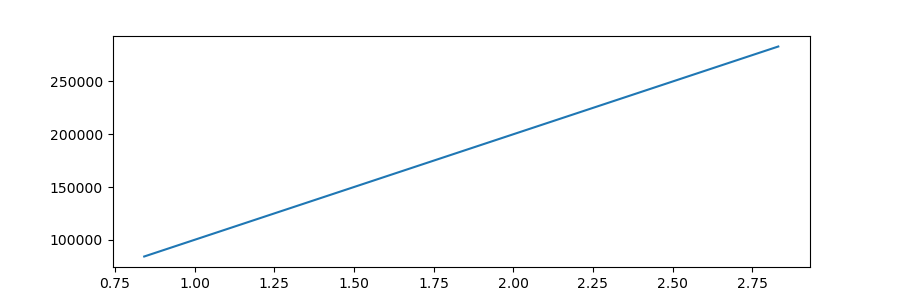

In [188]:
plt.plot(lam_simu, flux_fct(lam_simu))

### No contamination

In [229]:
# Inject
scidata = simu.rebuild(flux_fct, orders=[0])

<IPython.core.display.Javascript object>


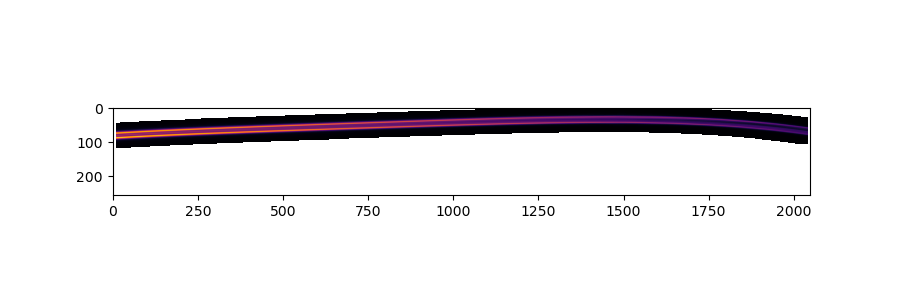

In [230]:
plt.imshow(scidata)

In [245]:
# Extraction
lam_grid = grid_from_map(wave_maps[0], spat_pros[0], n_os=8)
# lam_grid = np.unique(wave_maps[0][50,:])
args_ord1 = [[spat_pros[0]], [wave_maps[0]], [thrpt_list[0]], [np.array([0,0,1,0,0])]]
extract = TrpzOverlap(*args_ord1, lam_grid=lam_grid, thresh=1e-4)

In [246]:
f_k = extract(data=scidata)

<IPython.core.display.Javascript object>


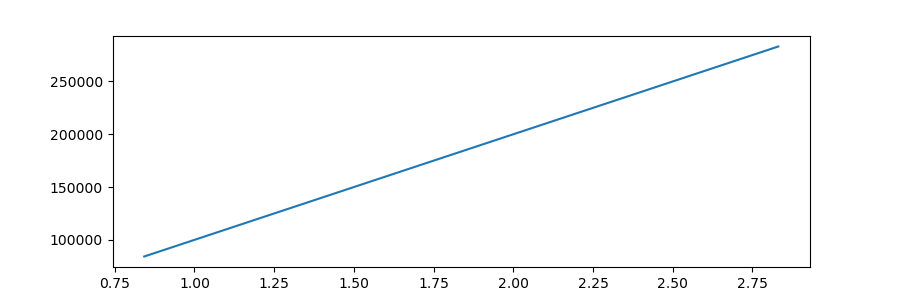

In [247]:
plt.plot(extract.lam_grid_c(0), extract.c_list[0].dot(f_k))

In [248]:
rebuilt = extract.rebuild(f_k)

<IPython.core.display.Javascript object>


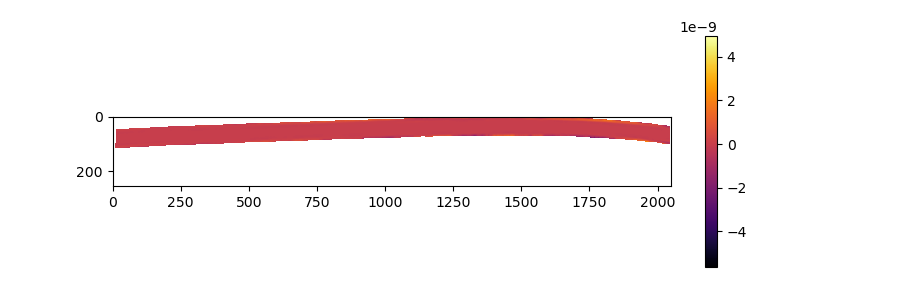

In [249]:
plt.imshow((rebuilt-scidata)/scidata, interpolation=None)#, vmin=-5e-15, vmax=5e-15)
plt.colorbar()

<IPython.core.display.Javascript object>


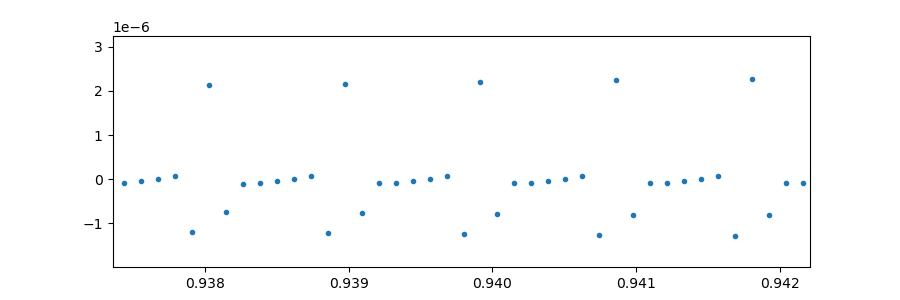

In [250]:
plt.plot(extract.lam_grid_c(0), (extract.c_list[0].dot(f_k)-extract.c_list[0].dot(flux_fct(lam_grid)))
         /extract.c_list[0].dot(flux_fct(lam_grid)),".")

<IPython.core.display.Javascript object>


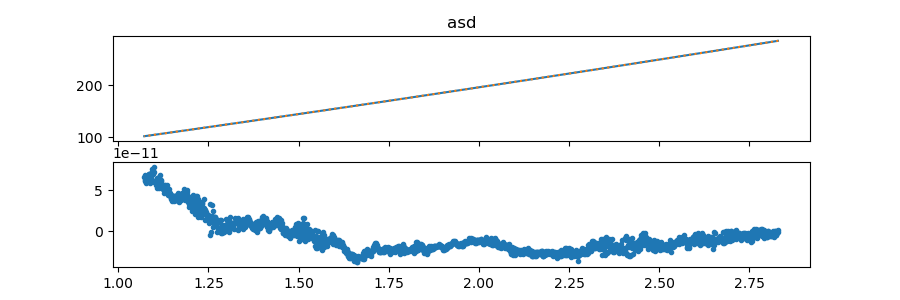

In [244]:
fig, ax = plt.subplots(2, 1, sharex=True)
ax[0].set_title('asd')

grid_bin, f_bin = extract.bin_to_pixel(f_k=f_k,
                                       grid_pix=wave_maps[0][100,:1800], i_ord=0)
_, f_bin_th = simu.bin_to_pixel(f_k=flux_fct(lam_simu), grid_pix=grid_bin, i_ord=0)

ax[0].plot(grid_bin, f_bin)
ax[0].plot(grid_bin, f_bin_th, ":")

# f_th_interp = interp1d(simu['grid_c2'], simu['f_c2'], kind='cubic', bounds_error=False, fill_value=np.nan)
ax[1].plot(grid_bin, (f_bin-f_bin_th)/f_bin_th, ".")

### Contamination

In [9]:
# Inject
scidata = simu.rebuild(flux_fct)

In [74]:
# Extraction
extract = TrpzOverlap(*ref_files_args, n_os=1, thresh=1e-4)

In [75]:
f_k = extract(data=scidata)

In [76]:
rebuilt = extract.rebuild(f_k)

<IPython.core.display.Javascript object>


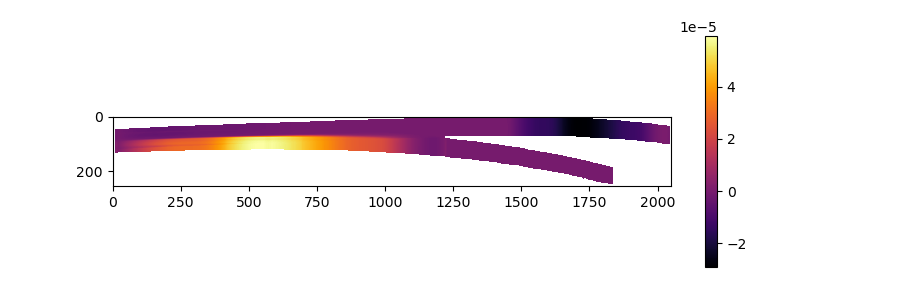

In [77]:
plt.imshow((rebuilt-scidata)/scidata)
plt.colorbar()

<IPython.core.display.Javascript object>


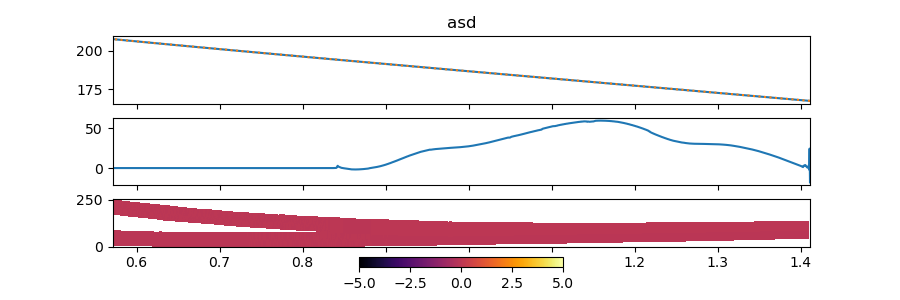

In [78]:
fig, ax = plt.subplots(3, 1, sharex=True)
ax[0].set_title('asd')

grid_bin, f_bin = extract.bin_to_pixel(f_k_c=extract.c_list[1].dot(f_k),
                                       grid_pix=wave_maps[1][100,:1800],
                                       grid_f_k=extract.lam_grid_c(1), i_ord=1)
_, f_bin_th = simu.bin_to_pixel(f_k=flux_fct(lam_simu), grid_pix=grid_bin, i_ord=1)

ax[0].plot(grid_bin, f_bin)
ax[0].plot(grid_bin, f_bin_th, ":")

# f_th_interp = interp1d(simu['grid_c2'], simu['f_c2'], kind='cubic', bounds_error=False, fill_value=np.nan)
ax[1].plot(grid_bin, (f_bin-f_bin_th)/f_bin_th*1e6)

im = ax[-1].pcolormesh(wave_maps[1][100,:1800], np.arange(256), ((rebuilt-scidata)/scidata)[:, :1800], vmin=-5, vmax=5)
# plt.imshow((rebuilt-data)/sig, vmin=-5, vmax=5., interpolation=None)
plt.colorbar(im, ax=ax[-1], orientation="horizontal")

# Tests on sinus function

## Inject sinus

In [11]:
# Generate flux to inject
flux = 1 + 0.5 * np.sin(lam_simu*500)
# Multiplication by a fudge factor to get
# a realistic number of counts on the detector
flux *= 1e9

# Inject
scidata = simu.rebuild(flux)
clean_data = simu_no_overlap.rebuild(flux)
clean_data_2 = simu_no_overlap_2.rebuild(flux)

<IPython.core.display.Javascript object>


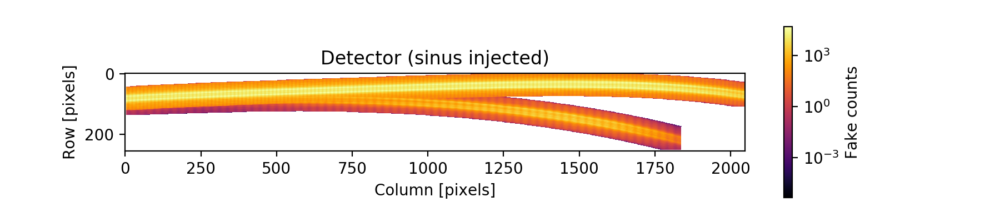

In [12]:
plt.figure(figsize=(9,2))
plt.imshow(scidata, norm=LogNorm())
cmap = plt.colorbar()
plt.title('Detector (sinus injected)')
plt.ylabel('Row [pixels]')
plt.xlabel('Column [pixels]')
cmap.set_label('Fake counts')

## Define noise

In [13]:
data_noise = scidata.copy()
clean_data_noise = clean_data.copy()

In [11]:
# Add Poisson noise
data_noise[np.isnan(data_noise)] = 0
data_noise = np.random.poisson(data_noise)
clean_data_noise[np.isnan(clean_data_noise)] = 0
clean_data_noise = np.random.poisson(clean_data_noise)

# Add background noise
data_noise = data_noise + np.random.normal(scale=20, size=data_noise.shape)
clean_data_noise = clean_data_noise + np.random.normal(scale=20, size=clean_data_noise.shape)

# Get the noise
noise = data_noise-scidata
noise_clean = clean_data_noise-clean_data

In [12]:
sig = np.sqrt(scidata + 20.**2)  # Map of expected noise

### Test oversampling for a non-uniform grid
Use a finer grid for the wavelengths covered by order 2

In [16]:
# Use grid given by the wavelength at the center of the pixels 
# with the maximum value of the spatial profile (so one wavelength per column)
# Do it for both orders
lam_grid_2 = grid_from_map(wv_2, P2)
lam_grid_1 = grid_from_map(wv_1, P1)

# Remove values from order 1 that are already covered by order 2
lam_grid_1 = lam_grid_1[lam_grid_1 > lam_grid_2.max()]

In [17]:
n_oversample = [1,2,3,4,5,6,7,8]
logl = {'Noisy':[], 'Noiseless':[]}
for n_os in n_oversample:

    # Oversample by subdividing both grid and finally combine it
    lam_grid = np.concatenate([oversample_grid(lam_grid_2, n_os=n_os),
                               oversample_grid(lam_grid_1, n_os=n_os)])

    # Make sure sorted and unique
    lam_grid = np.unique(lam_grid)

    # Noiseless
    extra = TrpzOverlap([P1,P2], [wv_1,wv_2], scidata=scidata, lam_grid=lam_grid, thresh=1e-5,
                        c_kwargs={'thresh':0.001})
    logl['Noiseless'].append(extra.get_logl())
    
    # Noisy
    extra = TrpzOverlap([P1,P2], [wv_1,wv_2], scidata=data_noise, lam_grid=lam_grid, thresh=1e-5,
                        sig=sig, c_kwargs={'thresh':0.001})
    logl['Noisy'].append(extra.get_logl())

<IPython.core.display.Javascript object>


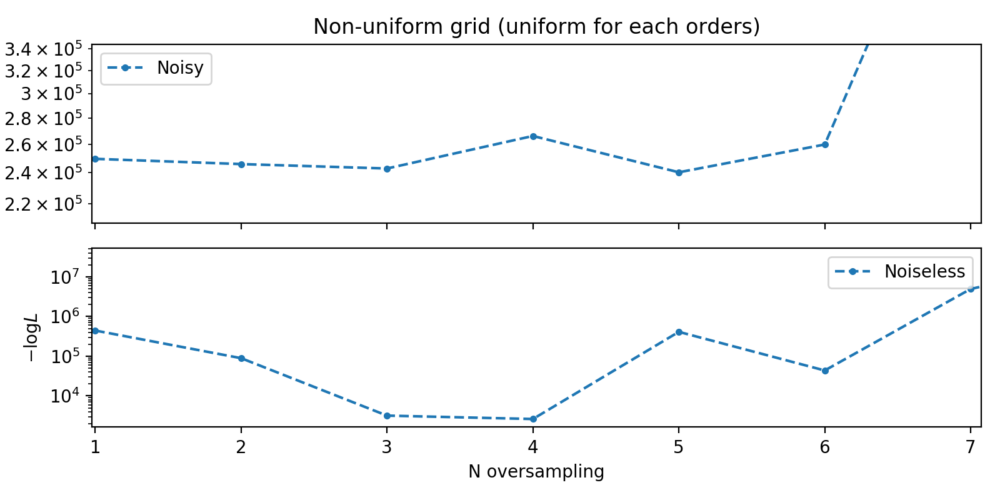

In [24]:
fig, ax = plt.subplots(2,1,sharex=True, figsize=(8,4))
for i, key in enumerate(logl.keys()):
    ax[i].semilogy(n_oversample, -1 * np.array(logl[key]), "--.", label=key)
    ax[i].legend()
    ax[i].set_ylabel('$-\log{L}$')
ax[0].set_title("Non-uniform grid (uniform for each orders)")
plt.xlabel('N oversampling')

plt.tight_layout()

### Test kernel cut
Threshold to cut the values in the convolution kernel

In [25]:
# Use grid given by the wavelength at the center of the pixels 
# with the maximum value of the spatial profile (so one wavelength per column)
# Do it for both orders
lam_grid_2 = grid_from_map(wv_2, P2)
lam_grid_1 = grid_from_map(wv_1, P1)

# Remove values from order 1 that are already covered by order 2
lam_grid_1 = lam_grid_1[lam_grid_1 > lam_grid_2.max()]

In [32]:
n_oversample = [1,2,3] # Try 2 different values
thresh_list = [0.0005, 0.001, 0.002, 0.003, 0.004, 0.005, 0.006]

logl = {'Noisy':[[] for n_os in n_oversample],
        'Noiseless':[[] for n_os in n_oversample]}

for i_os, n_os in enumerate(n_oversample):

    for thresh in thresh_list:
        # Oversample by subdividing both grid and finally combine it
        lam_grid = np.concatenate([oversample_grid(lam_grid_2, n_os=n_os),
                                   oversample_grid(lam_grid_1, n_os=n_os)])

        # Make sure sorted and unique
        lam_grid = np.unique(lam_grid)

        # Noiseless
        extra = TrpzOverlap([P1,P2], [wv_1,wv_2], scidata=scidata, lam_grid=lam_grid, thresh=1e-5,
                            c_kwargs={'thresh':thresh})
        logl['Noiseless'][i_os].append(extra.get_logl())

        # Noisy
        extra = TrpzOverlap([P1,P2], [wv_1,wv_2], scidata=data_noise, lam_grid=lam_grid, thresh=1e-5,
                            sig=sig, c_kwargs={'thresh':thresh})
        logl['Noisy'][i_os].append(extra.get_logl())

<IPython.core.display.Javascript object>


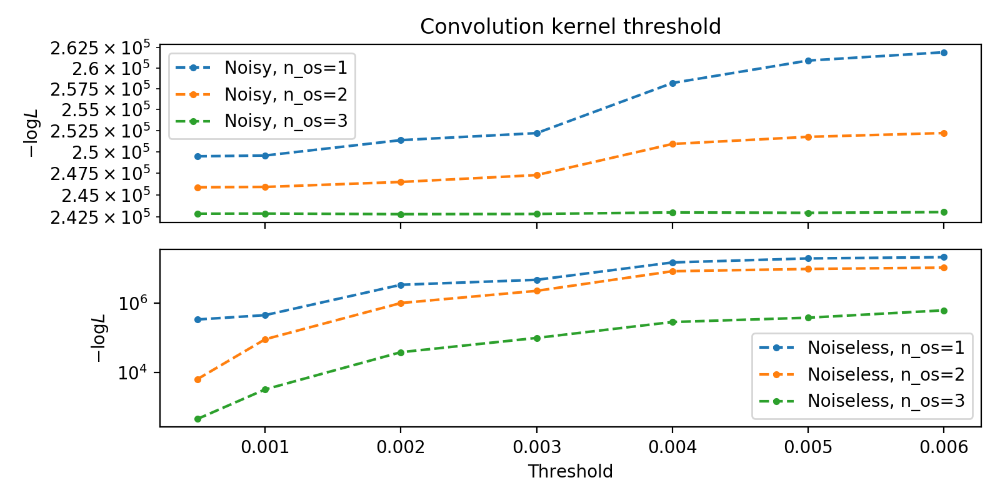

In [33]:
fig, ax = plt.subplots(2,1,sharex=True, figsize=(8,4))
for i, key in enumerate(logl.keys()):
    for i_os, n_os in enumerate(n_oversample):
        ax[i].semilogy(thresh_list, -1 * np.array(logl[key][i_os]),
                       "--.", label=key + ", n_os={}".format(n_os))
        ax[i].legend()
        ax[i].set_ylabel('$-\log{L}$')
ax[0].set_title("Convolution kernel threshold")
plt.xlabel('Threshold')

plt.tight_layout()

# Develop binning

In [10]:
wv_range = [0.6, 2.836]
n_oversample = 2

# Define grid for extraction
# To be improved, but for now, choose the grid from order 1
lam_grid = grid_from_map(wv_1, P1, wv_range=wv_range)
lam_grid = oversample_grid(lam_grid, n_os=n_oversample)
lam_grid = np.unique(lam_grid)

In [11]:
# Init extraction object
# Use more restrictive cut on the spatial and the kernel
extra = TrpzOverlap([P1,P2], [wv_1,wv_2], scidata=scidata, lam_grid=lam_grid, thresh=1e-5,
                    c_kwargs={'thresh':0.001})

In [13]:
f_k = extra.extract()
f_k_c = extra.c_list[0].dot(f_k)

<IPython.core.display.Javascript object>


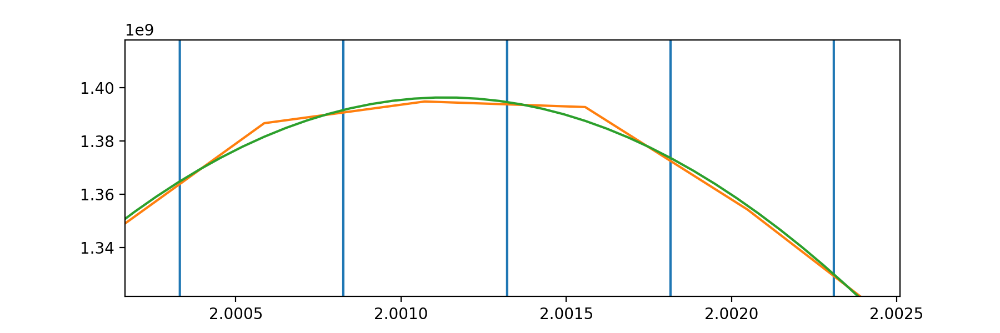

In [82]:
plt.plot(extra.lam_grid, f_k)
plt.plot(extra.lam_grid_c(0),f_k_c)
plt.plot(simu.lam_grid_c(0), simu.c_list[0].dot(flux))

<IPython.core.display.Javascript object>


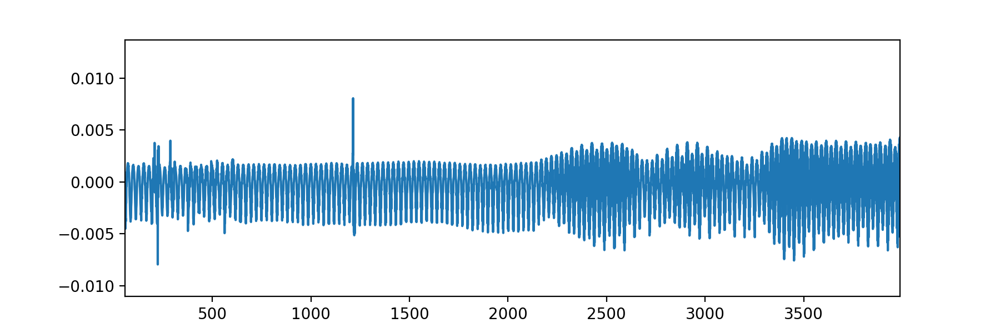

In [89]:
plt.plot((f_k_c-f_th_c(extra.lam_grid_c(0)))/f_th_c(extra.lam_grid_c(0)))

In [170]:
# convolve flux after resampling??

In [94]:
from astropy.convolution import convolve, Box1DKernel

f_bin_astropy = convolve(f_k_c, Box1DKernel(3*n_oversample),
                   preserve_nan=True, boundary='extend')



f_th_bin = convolve(simu.c_list[0].dot(flux), Box1DKernel(15*3),
                    preserve_nan=True, boundary='extend')
f_th_bin_astropy = interp1d(simu.lam_grid_c(0), f_th_bin, kind='cubic')

f_th_c = interp1d(simu.lam_grid_c(0), simu.c_list[0].dot(flux), kind='cubic')
# f_th_bin_astropy = convolve(f_th_c(extra.lam_grid_c(0)), Box1DKernel(2*n_oversample),
#                     preserve_nan=True, boundary='extend')

<IPython.core.display.Javascript object>


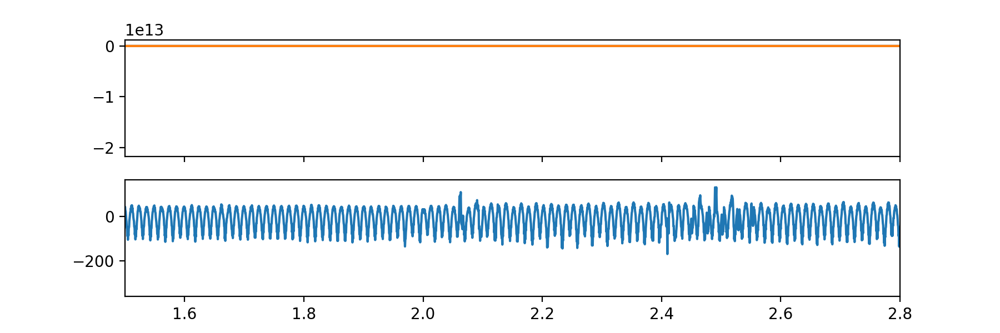

(1.5, 2.8)

In [95]:
fig, ax = plt.subplots(2,1, sharex=True)
ax[0].plot(extra.lam_grid_c(0), f_th_bin_astropy(extra.lam_grid_c(0)))
# ax[0].plot(extra.lam_grid_c(0), f_th_bin_astropy)
ax[0].plot(extra.lam_grid_c(0), f_bin_astropy)

ax[1].plot(extra.lam_grid_c(0), 
           (f_th_bin_astropy(extra.lam_grid_c(0))-f_bin_astropy)
           /f_th_bin_astropy(extra.lam_grid_c(0))*1e6)
# ax[1].plot(extra.lam_grid_c(0), 
#            (f_th_bin_astropy-f_bin_astropy)
#            /f_th_bin_astropy*1e6)

ax[1].set_ylim(-40, 40)
plt.xlim(1.50, 2.8)

In [63]:
from utils import _get_lam_p_or_m
    
def binary_bin(bins, grid, f_k, mode='center'):

    # Need to define bins borders if `grid` gives the center.
    if mode == 'center':
        # Compute extremities of the bins
        # (Assuming bin_grid is the center)
        bin_p, bin_m = _get_lam_p_or_m(bins)

        # Make sur it's sorted
        bin_p, bin_m = np.sort(bin_p), np.sort(bin_m)

        # Special treatment at the end of the bins
        # IDEA: put -inf or inf at the ends instead?
        bins = np.concatenate([bin_m, bin_p[-1:]])

    # Compute bins
    out = np.histogram(grid, bins, weights=f_k)[0]
    # Normalise (result is the mean in each bins)
    out /= np.histogram(grid, bins)[0]

    return out, np.histogram(grid, bins)[0]

In [64]:
from scipy.integrate.quadrature import AccuracyWarning, _romberg_diff
from warnings import warn

def trpz_grid(grid, fct, tol=1.48e-4, rtol=1.48e-4, divmax=10, out_res=False):
    """
    *** THIS FUNCTION IS _STRONGLY_ INSPIRED BY SCIPY ***
    See scipy.integrate.quadrature.romberg
    
    Refine parts of a grid to reach a specified integration precision 
    based on Romberg integration of a callable function or method.
    Returns the number of nodes needed in each intervals of
    the input grid to reach the specified tolerance over the integral
    of `fct` (a function of one variable).
    
    Note: The difference between th scipy version is that it is vectorised
    to deal with multiple intervals separately. It also returns the
    number of nodes needed to reached the required precision instead
    of returning the value of the integral.
    Parameters
    ----------
    grid: 1D array-like
        Grid for integration. Each sections of this grid are treated
        as separate integrals. So if grid has length N; N-1 integrals
        are optimized. 
    function : callable
        Function to be integrated.

    Returns
    -------
    n_grid  : 1D array, length = len(grid) - 1
        Number of nodes needed on each distinct intervals in the grid
        to reach the specified tolerance.
    residual : 1D array, optional
        Estimate of the error in each intervals. Same length as n_grid.
    Other Parameters
    ----------------
    tol, rtol : float, optional
        The desired absolute and relative tolerances. Defaults are 1.48e-4.
    divmax : int, optional
        Maximum order of extrapolation. Default is 10.
    out_res: bool, optional
        Return or not the residuals in each intervals. Default is False.
    See Also
    --------
    scipy.integrate.quadrature.romberg
    References
    ----------
    .. [1] 'Romberg's method' https://en.wikipedia.org/wiki/Romberg%27s_method
    """
    n_intervals = len(grid)-1
    
    intervals = np.array([grid[:-1], grid[1:]])
    intrange = np.diff(grid)
    
    # Compute integral on bin grid
    n = 1
    ordsum = difftrap(fct, intervals, n)
    return intrange * ordsum

def difftrap(fct, interval, numtraps):
    """
    ** Quasi entirely taken from scipy.integrate.quadrature **
    Adapted to work with multiple intervals.
    
    Desciption taken from scipy:
    Perform part of the trapezoidal rule to integrate a fct.
    Assume that we had called difftrap with all lower powers-of-2
    starting with 1.  Calling difftrap only returns the summation
    of the new ordinates.  It does _not_ multiply by the width
    of the trapezoids.  This must be performed by the caller.
        'fct' is the fct to evaluate (must accept vector arguments).
        'interval' is a sequence with lower and upper limits
                   of integration.
        'numtraps' is the number of trapezoids to use (must be a
                   power-of-2).
    """
    # Convert input intervals to numpy array
    interval = np.array(interval)
    # If 1-d, add dimension so it's 2-d
    # (the algorithm is made for multiple intervals, so 2-d)
    if interval.ndim == 1:
        interval = interval[:,None]
    
    # Quasi-copy of scipy.integrate.quadrature._difftrap code
    if numtraps <= 0:
        raise ValueError("numtraps must be > 0 in difftrap().")
    elif numtraps == 1:
        return 0.5*(fct(interval[0])+fct(interval[1]))
    else:
        numtosum = numtraps/2
        h = (interval[1]-interval[0]).astype(float)/numtosum
        lox = interval[0] + 0.5 * h
        
        points = lox[None,:] + h * np.arange(numtosum)[:,None]
        s = np.sum(fct(points), axis=0)
        return s

In [65]:
def box_bin(bins, grid, f_k, mode='center'):
    
    # Need to define bins borders if `grid` gives the center.
    if mode == 'center':
        # Compute extremities of the bins
        # (Assuming bin_grid is the center)
        bin_p, bin_m = _get_lam_p_or_m(bins)

        # Make sur it's sorted
        bin_p, bin_m = np.sort(bin_p), np.sort(bin_m)

        # Special treatment at the end of the bins
        # IDEA: put -inf or inf at the ends instead?
        bins = np.concatenate([bin_m, bin_p[-1:]])
    
    # Linear Interpolate f_k
    fct = interp1d(grid, f_k, kind="linear")
    
    # Integrate using trapezoidal
    return trpz_grid(bins, fct)

In [66]:
bins = grid_from_map(wv_1, P1)
bins = bins[::2]

In [67]:
box_bin(bins, extra.lam_grid_c(0), f_th_c(extra.lam_grid_c(0))).shape, bins.shape

((1020,), (1020,))

<IPython.core.display.Javascript object>


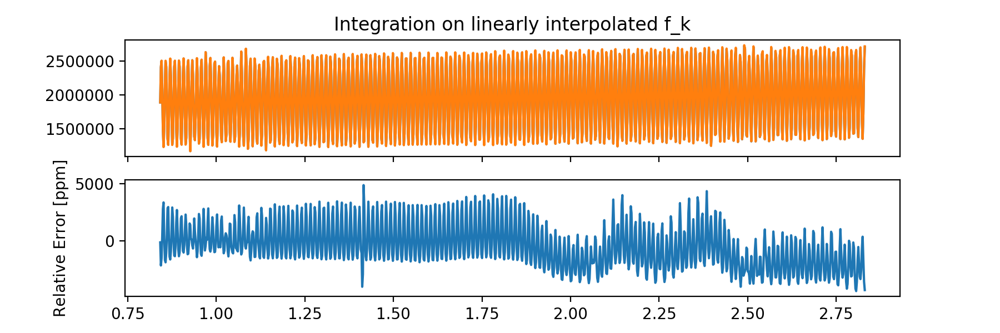

Text(0, 0.5, 'Relative Error [ppm]')

In [79]:
f_bin = box_bin(bins, extra.lam_grid_c(0), extra.c_list[0].dot(f_k))
# f_bin_th = box_bin(bins, extra.lam_grid_c(0), f_th_c(extra.lam_grid_c(0)))
f_bin_th = box_bin(bins, simu.lam_grid_c(0), simu.c_list[0].dot(flux))


fig, ax = plt.subplots(2,1,sharex=True)
ax[0].plot(bins, f_bin_th)
ax[0].plot(bins, f_bin)


ax[1].plot(bins, (f_bin_th-f_bin)/f_bin_th*1e6)

# ax[0].plot(box_bin(bins, extra.lam_grid_c(0), extra.c_list[0].dot(f_k)))
# ax[0].plot(box_bin(bins, extra.lam_grid_c(0), f_th_c(extra.lam_grid_c(0))))

# ax[1].plot()
ax[0].set_title("Integration on linearly interpolated f_k")
ax[1].set_ylabel("Relative Error [ppm]")

<IPython.core.display.Javascript object>


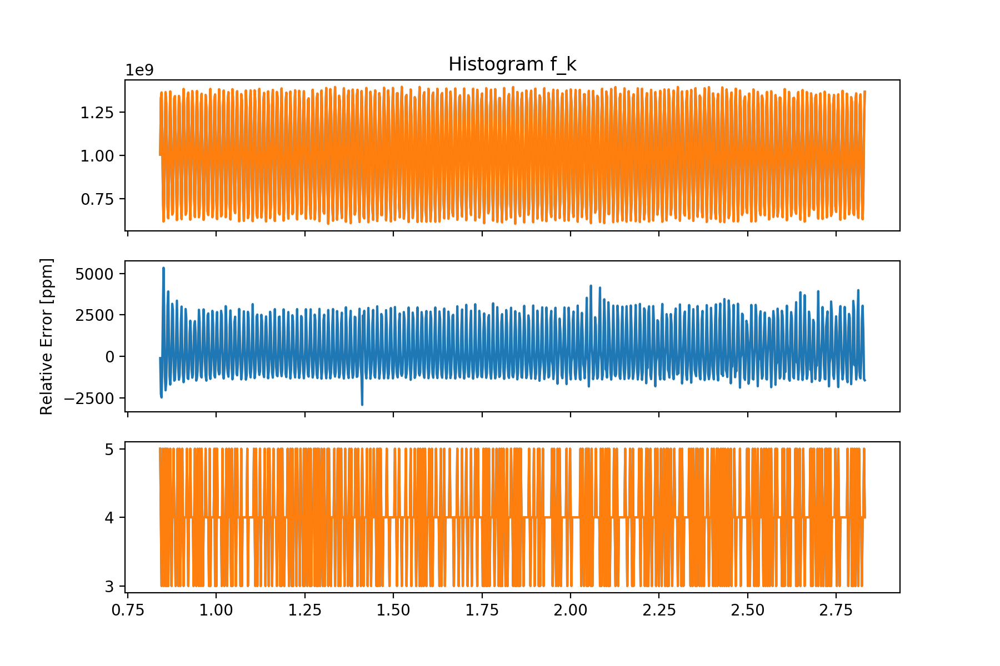

Text(0, 0.5, 'Relative Error [ppm]')

In [74]:


f_bin, n_bin = binary_bin(bins, extra.lam_grid_c(0), extra.c_list[0].dot(f_k))
f_bin_th, n_bin_th = binary_bin(bins, extra.lam_grid_c(0), f_th_c(extra.lam_grid_c(0)))
# f_bin_th, n_bin_th = binary_bin(bins, simu.lam_grid_c(0), simu.c_list[0].dot(flux))


fig, ax = plt.subplots(3,1,sharex=True, figsize=(9,6))
ax[0].plot(bins, f_bin_th)
ax[0].plot(bins, f_bin)


ax[1].plot(bins, (f_bin_th-f_bin)/f_bin_th*1e6)

ax[2].plot(bins, n_bin_th)
ax[2].plot(bins, n_bin)


ax[0].set_title("Histogram f_k")
ax[1].set_ylabel("Relative Error [ppm]")

In [75]:
def flat_throughput(x): return 1/x #return np.ones_like(x)

<IPython.core.display.Javascript object>


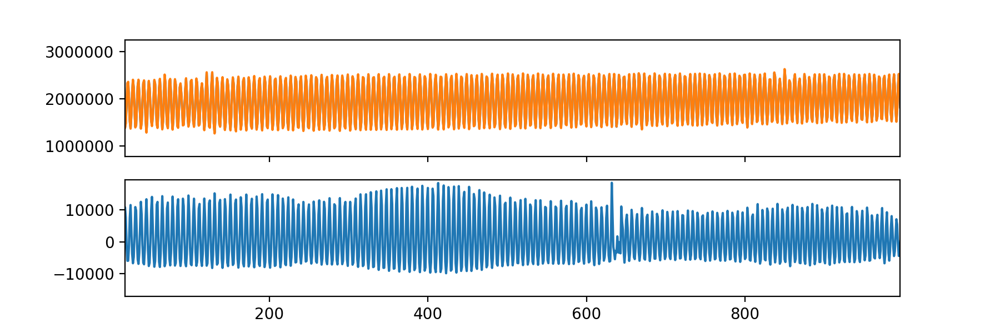

In [77]:
f_trpz = TrpzOverlap([np.ones_like(bins)[None,:]], [bins[None,:]],
                     scidata=np.ones_like(bins)[None,:], lam_grid=extra.lam_grid,
                     T_list=[flat_throughput], c_kwargs={'thresh':0.001})

f_trpz_th = TrpzOverlap([np.ones_like(bins)[None,:]], [bins[None,:]],
                     scidata=np.ones_like(bins)[None,:], lam_grid=simu.lam_grid,
                     T_list=[flat_throughput], c_kwargs={'thresh':0.00001})

fig, ax = plt.subplots(2,1,sharex=True)

ax[0].plot(f_trpz.rebuild(f_k)[0])
ax[0].plot(f_trpz_th.rebuild(flux)[0])

ax[1].plot((f_trpz.rebuild(f_k)[0]-f_trpz_th.rebuild(flux)[0])/f_trpz_th.rebuild(flux)[0]*1e6)

# Tikhonov Regularization

In [323]:
import regularisation
from importlib import reload

In [324]:
reload(regularisation)
from regularisation import Tikhonov

In [325]:
import overlap

In [326]:
reload(overlap)
from overlap import TrpzOverlap

In [333]:
# Generate flux to inject
flux = 0.0001 + 6*np.random.random(lam_simu.shape)
# Multiplication by a fudge factor to get
# a realistic number of counts on the detector
flux *= 1e9

# # Generate flux to inject
# flux = 1 + 0.5 * np.sin(lam_simu*500)
# # Multiplication by a fudge factor to get
# # a realistic number of counts on the detector
# flux *= 1e9

# Inject
scidata = simu.rebuild(flux)
clean_data = simu_no_overlap.rebuild(flux)
# clean_data_2 = simu_no_overlap_2.rebuild(flux)

In [284]:
interp1d?

In [334]:
f_th_c = interp1d(simu.lam_grid_c(0), simu.c_list[0].dot(flux), kind='cubic', fill_value="extrapolate")
f_th_c2 = interp1d(simu.lam_grid_c(1), simu.c_list[1].dot(flux), kind='cubic', fill_value="extrapolate")

In [205]:
lam_grid_sub = get_soss_grid([P1,P2], [wv_1,wv_2], n_os=4, lam_min=0.9, lam_max=1.)

# Init extraction object on a small lam_grid to do tests
extra_sub = TrpzOverlap([P1,P2], [wv_1,wv_2], scidata=scidata, lam_grid=lam_grid_sub, thresh=1e-5,
                    c_kwargs={'thresh':0.001})

In [335]:
lam_grid = get_soss_grid([P1,P2], [wv_1,wv_2], n_os=8)

# Init extraction object
extra = TrpzOverlap([P1,P2], [wv_1,wv_2], scidata=scidata, lam_grid=lam_grid, thresh=1e-5,
                    c_kwargs={'thresh':0.0001})

f_k = extra.extract()
f_k_c = extra.c_list[0].dot(f_k)

## Matrix of order 2 resolution

In [181]:
from convolution import WebbKer, get_c_matrix
from scipy.sparse import identity

In [372]:
# Generate a fake wv_map to cover all wv_range with a resulution twice of order 2
wv_map = grid_from_map(wv_2, P2, wv_range=[extra.lam_grid.min(), extra.lam_grid.max()])
wv_map = oversample_grid(wv_map, n_os=2)
conv_ord2 = get_c_matrix(WebbKer(wv_map[None, :]), extra.lam_grid, thresh=1e-5)
t_mat = conv_ord2 - identity(conv_ord2.shape[0])

In [386]:
extra.tikho.test

{'factors': array([1.00000000e-10, 5.01187234e-11, 2.51188643e-11, 1.25892541e-11,
        6.30957344e-12, 3.16227766e-12, 1.58489319e-12, 7.94328235e-13,
        3.98107171e-13, 1.99526231e-13, 1.00000000e-13, 5.01187234e-14,
        2.51188643e-14, 1.25892541e-14, 6.30957344e-15, 3.16227766e-15,
        1.58489319e-15, 7.94328235e-16, 3.98107171e-16, 1.99526231e-16,
        1.00000000e-16, 5.01187234e-17, 2.51188643e-17, 1.25892541e-17,
        6.30957344e-18, 3.16227766e-18, 1.58489319e-18, 7.94328235e-19,
        3.98107171e-19, 1.99526231e-19, 1.00000000e-19, 5.01187234e-20,
        2.51188643e-20, 1.25892541e-20, 6.30957344e-21, 3.16227766e-21,
        1.58489319e-21, 7.94328235e-22, 3.98107171e-22, 1.99526231e-22,
        1.00000000e-22, 5.01187234e-23, 2.51188643e-23, 1.25892541e-23,
        6.30957344e-24, 3.16227766e-24, 1.58489319e-24, 7.94328235e-25,
        3.98107171e-25, 1.99526231e-25]),
 'solution': array([[ 2.90510858e+09,  2.90510858e+09,  2.90510858e+09, ...,
      

In [364]:
factors = 10.**(-1*np.arange(10, 25, 0.3))
test_conv = extra.get_tikho_tests(factors, t_mat=t_mat)

KeyboardInterrupt: 

<IPython.core.display.Javascript object>


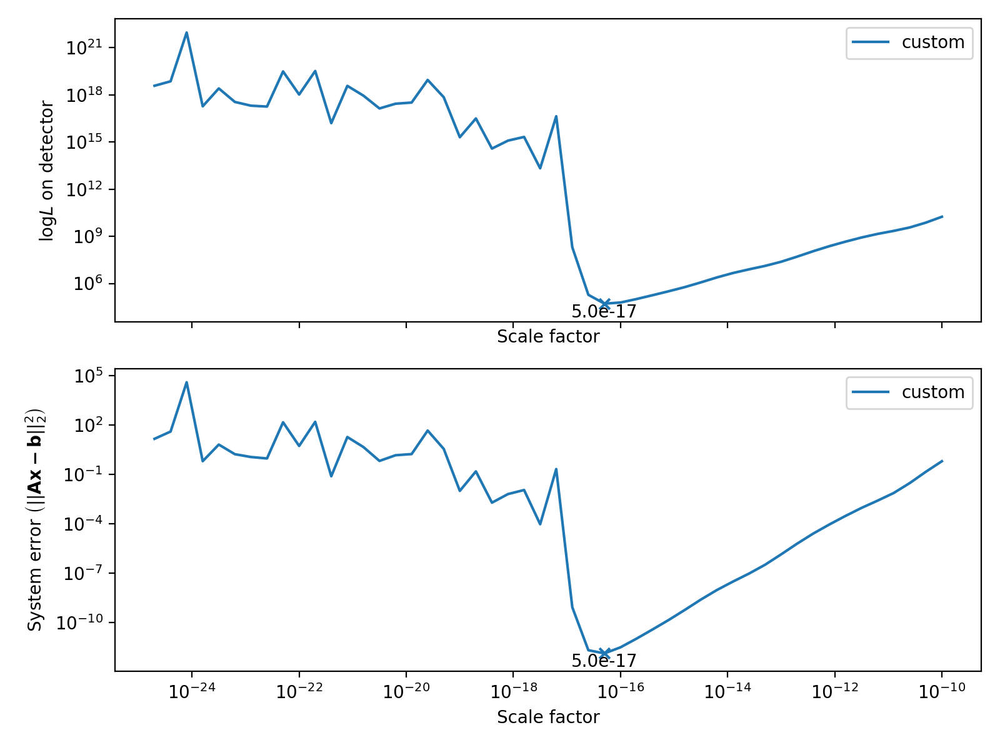

(<Figure size 800x600 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x1915a61e50>,
       dtype=object))

In [344]:
extra.plot_tikho_factors()

In [373]:
f_tik = extra.extract(tikhonov=True, tikho_kwargs={'t_mat':t_mat, 'factor':1e-16})

<IPython.core.display.Javascript object>


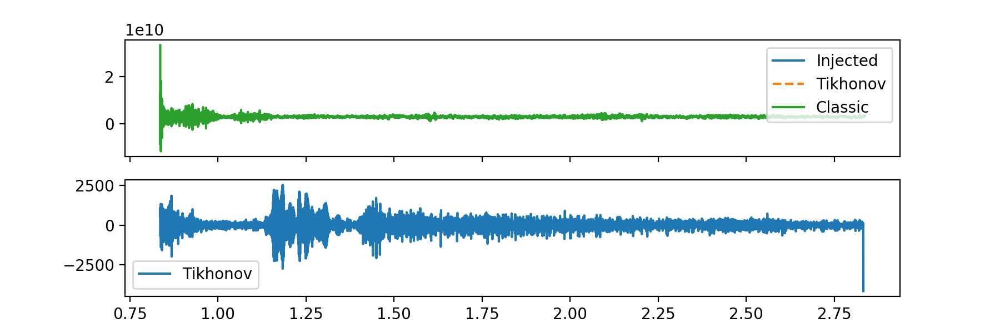

In [346]:
fig, ax = plt.subplots(2,1,sharex=True)
ax[0].plot(extra.lam_grid_c(0), f_th_c(extra.lam_grid_c(0)), label="Injected")
ax[0].plot(extra.lam_grid_c(0), extra.c_list[0].dot(f_tik), "--", label="Tikhonov")
ax[0].plot(extra.lam_grid_c(0), f_k_c, label="Classic")

ax[0].legend()

# ax[1].plot(extra.lam_grid_c(0), (f_k_c-f_th_c(extra.lam_grid_c(0)))/f_th_c(extra.lam_grid_c(0)), label="Classic")
ax[1].plot(extra.lam_grid_c(0), 1e6*(extra.c_list[0].dot(f_tik)-f_th_c(extra.lam_grid_c(0)))/f_th_c(extra.lam_grid_c(0)), label="Tikhonov")
ax[1].legend()



<IPython.core.display.Javascript object>


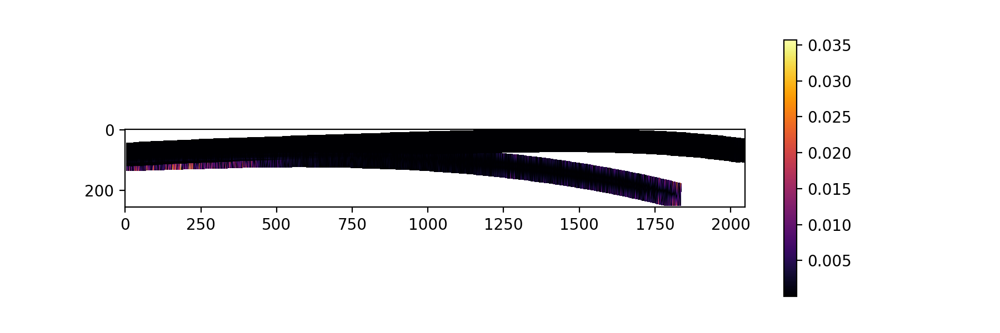

In [374]:
plt.imshow(np.abs(extra.rebuild(f_tik)-scidata)/scidata)
plt.colorbar()

<IPython.core.display.Javascript object>


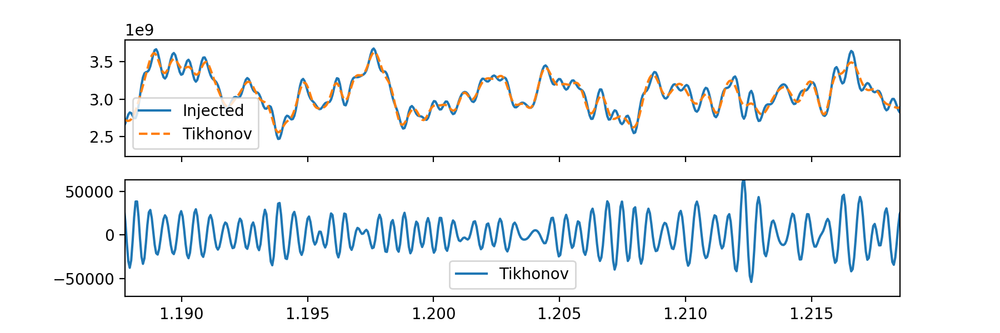

In [375]:
fig, ax = plt.subplots(2,1,sharex=True)
ax[0].plot(extra.lam_grid_c(1), f_th_c2(extra.lam_grid_c(1)), label="Injected")
ax[0].plot(extra.lam_grid_c(1), extra.c_list[1].dot(f_tik), "--", label="Tikhonov")
# ax[0].plot(extra.lam_grid_c(1), extra.c_list[1].dot(f_k), label="Classic")

ax[0].legend()

# ax[1].plot(extra.lam_grid_c(0), (f_k_c-f_th_c(extra.lam_grid_c(0)))/f_th_c(extra.lam_grid_c(0)), label="Classic")
ax[1].plot(extra.lam_grid_c(1), 1e6*(extra.c_list[1].dot(f_tik)-f_th_c2(extra.lam_grid_c(1)))/f_th_c2(extra.lam_grid_c(1)), label="Tikhonov")
ax[1].legend()

In [332]:
extra.get_tikho_tests(factors, t_mat='zeroth', estimate=f_tik)

TypeError: 'dia_matrix' object is not subscriptable

<IPython.core.display.Javascript object>


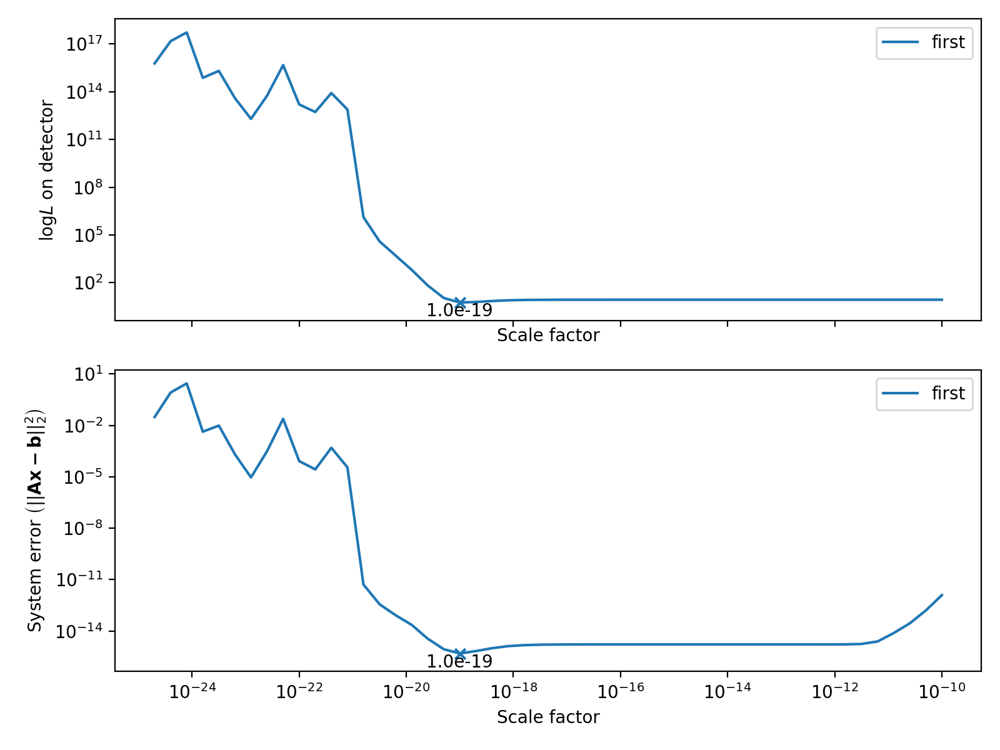

(<Figure size 800x600 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x18f2221b50>,
       dtype=object))

In [329]:
extra.plot_tikho_factors()

In [330]:
f_test = extra.extract(tikhonov=True, tikho_kwargs={'t_mat': 'first', 'factor':1e-19, 'estimate': f_tik})

<IPython.core.display.Javascript object>


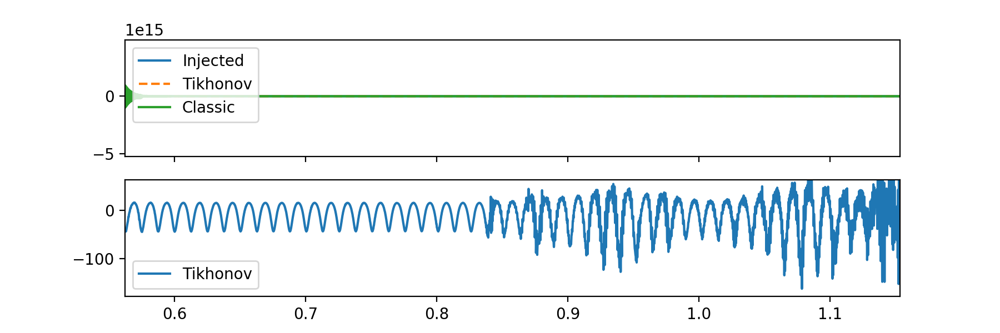

In [331]:
fig, ax = plt.subplots(2,1,sharex=True)
ax[0].plot(extra.lam_grid_c(1), f_th_c2(extra.lam_grid_c(1)), label="Injected")
ax[0].plot(extra.lam_grid_c(1), extra.c_list[1].dot(f_test), "--", label="Tikhonov")
ax[0].plot(extra.lam_grid_c(1), extra.c_list[1].dot(f_k), label="Classic")

ax[0].legend()

# ax[1].plot(extra.lam_grid_c(0), (f_k_c-f_th_c(extra.lam_grid_c(0)))/f_th_c(extra.lam_grid_c(0)), label="Classic")
ax[1].plot(extra.lam_grid_c(1), 1e6*(extra.c_list[1].dot(f_test)-f_th_c2(extra.lam_grid_c(1)))/f_th_c2(extra.lam_grid_c(1)), label="Tikhonov")
ax[1].legend()

<IPython.core.display.Javascript object>


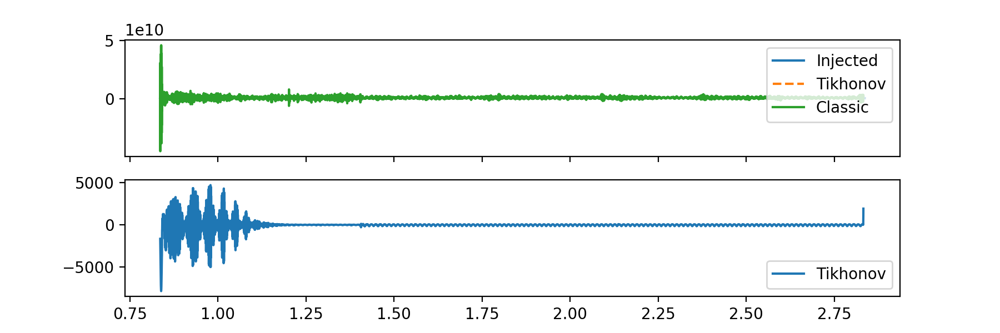

In [301]:
fig, ax = plt.subplots(2,1,sharex=True)
ax[0].plot(extra.lam_grid_c(0), f_th_c(extra.lam_grid_c(0)), label="Injected")
ax[0].plot(extra.lam_grid_c(0), extra.c_list[0].dot(f_test), "--", label="Tikhonov")
ax[0].plot(extra.lam_grid_c(0), f_k_c, label="Classic")

ax[0].legend()

# ax[1].plot(extra.lam_grid_c(0), (f_k_c-f_th_c(extra.lam_grid_c(0)))/f_th_c(extra.lam_grid_c(0)), label="Classic")
ax[1].plot(extra.lam_grid_c(0), 1e6*(extra.c_list[0].dot(f_test)-f_th_c(extra.lam_grid_c(0)))/f_th_c(extra.lam_grid_c(0)), label="Tikhonov")
ax[1].legend()

Testing factors...
34/34


<IPython.core.display.Javascript object>


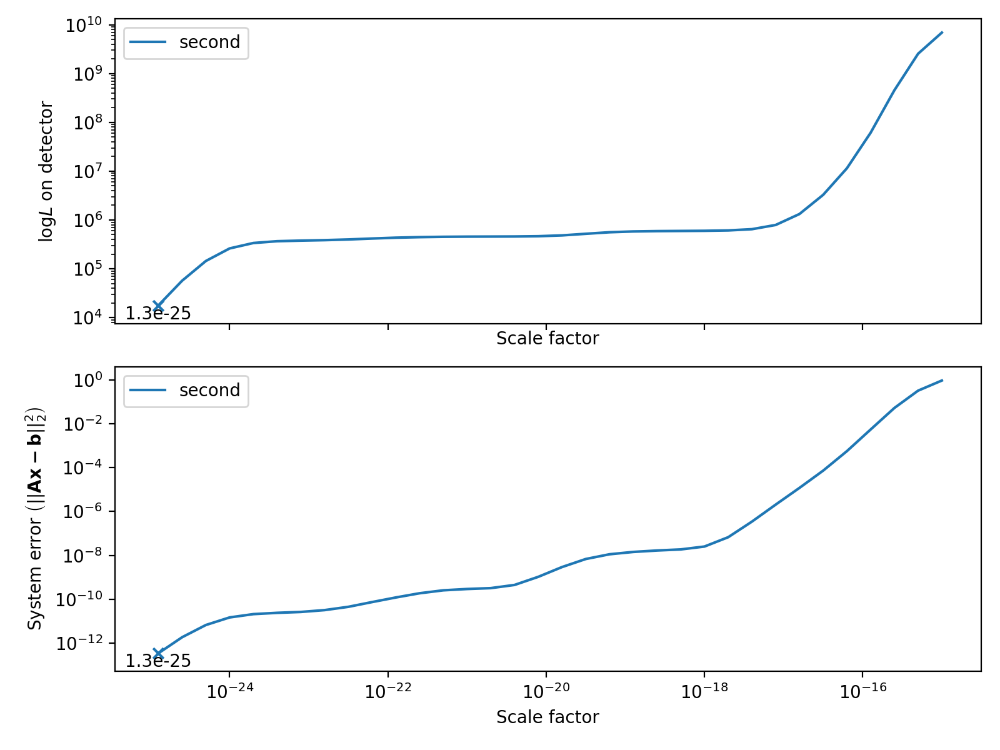

(<Figure size 800x600 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x18326c1910>,
       dtype=object))

In [151]:
factors = 10.**(-1*np.arange(15, 25, 0.3))
get_tikho_tests(extra_sub, factors, t_mat='second')
plot_tikho_factors(extra_sub)

In [155]:
if False:
    print('asd')

In [148]:
def get_tikho_tests(self, factors, tikho=None, t_mat=None):
    
    if tikho is None:
        if t_mat is None:
            tikho = self.tikho
        else:
            kwargs = {'t_mat': t_mat, 'grid': self.lam_grid}
            tikho = Tikhonov(*self.build_sys(), **kwargs)
            self.tikho = tikho

    # Test all factors
    tests = tikho.test_factors(factors)
    # Generate logl using solutions for each factors
    logl_list = []
    for sln in tests['solution']:
        logl_list.append(self.get_logl(sln))
    # Save in tikho's tests
    tikho.test['-logl'] = -1 * np.array(logl_list)
    
    return tikho.test

def plot_tikho_factors(self):
    
    tikho = self.tikho

    # Init figure
    fig, ax = plt.subplots(2, 1, sharex=True, figsize=(8,6))
    # logl plot
    tikho.error_plot(ax=ax[0], test_key='-logl')
    # Error plot
    tikho.error_plot(ax=ax[1])
    # Labels
    ax[0].set_ylabel(r'$\log{L}$ on detector')
    # Other details
    fig.tight_layout()
    
    return fig, ax

In [129]:
# Inputs
factors = 10.**(-1*np.arange(15, 25, 0.3))
t_mat = 'second'
a_mat, b_vec = extra_sub.build_sys()

# Generate regularised solutions with different scale factors
solve_tik_sub = Tikhonov(a_mat, b_vec, t_mat=t_mat, grid=extra_sub.lam_grid)
tests = solve_tik_sub.test_factors(factors)
# Generate logl using solutions for each factors
logl_list = []
for sln in tests['solution']:
    logl_list.append(extra_sub.get_logl(sln))
    
extra_sub.test_tikho = tests
extra_sub.test_tikho['logl'] = np.array(logl_list)

Testing factors...
34/34


<IPython.core.display.Javascript object>


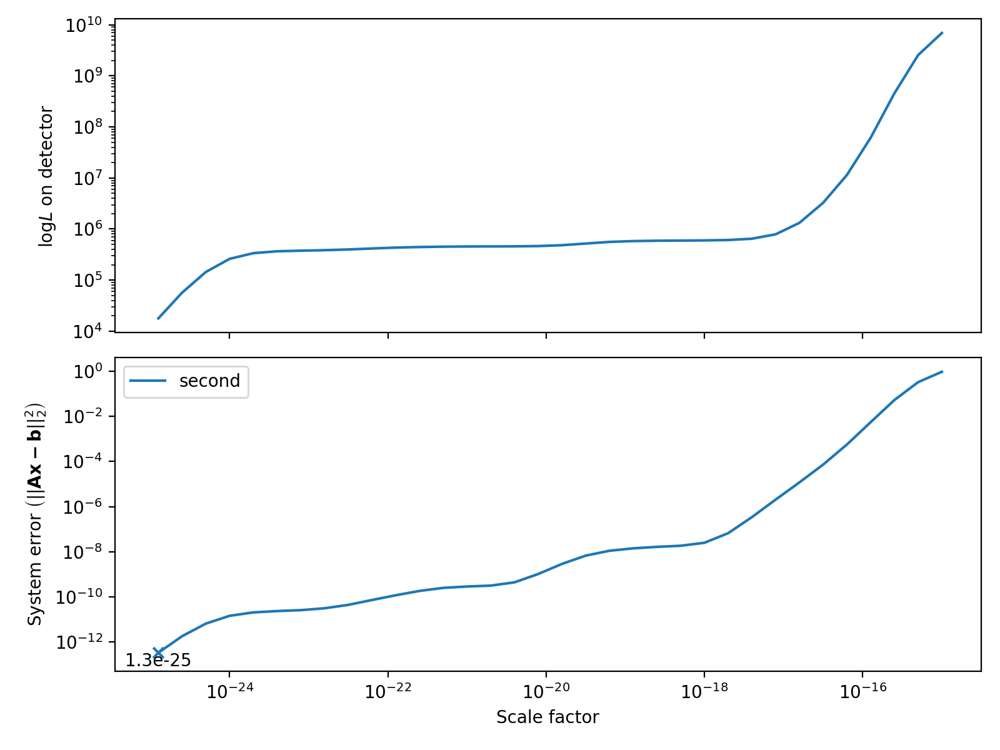

(<Figure size 800x600 with 2 Axes>,
 array([<matplotlib.axes._subplots.AxesSubplot object at 0x18326ad250>,
       dtype=object))

In [136]:
plot_tikho_factors(extra_sub, solve_tik_sub)

In [137]:
plot_tikho_factors(extra, solve_tik)

AttributeError: 'TrpzOverlap' object has no attribute 'test_tikho'

<IPython.core.display.Javascript object>


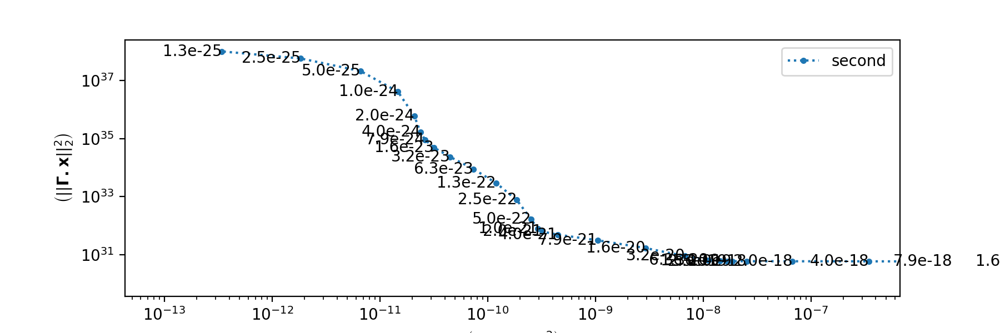

(<Figure size 900x300 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x183c886bd0>)

In [131]:
solve_tik_sub.l_plot()

In [89]:
# Inputs
factors = 10.**(-1*np.arange(15, 25, 0.3))
t_mat = 'second'
a_mat, b_vec = extra.build_sys()

# Generate regularised solutions with different scale factors
solve_tik = Tikhonov(a_mat, b_vec, t_mat=t_mat, grid=extra.lam_grid)
tests = solve_tik.test_factors(factors)
# Generate logl using solutions for each factors
logl_list = []
for sln in tests['solution']:
    logl_list.append(extra.get_logl(sln))
    
extra.test_tikho = tests
extra.test_tikho['logl'] = np.array(logl_list)

Testing factors...
34/34


<IPython.core.display.Javascript object>


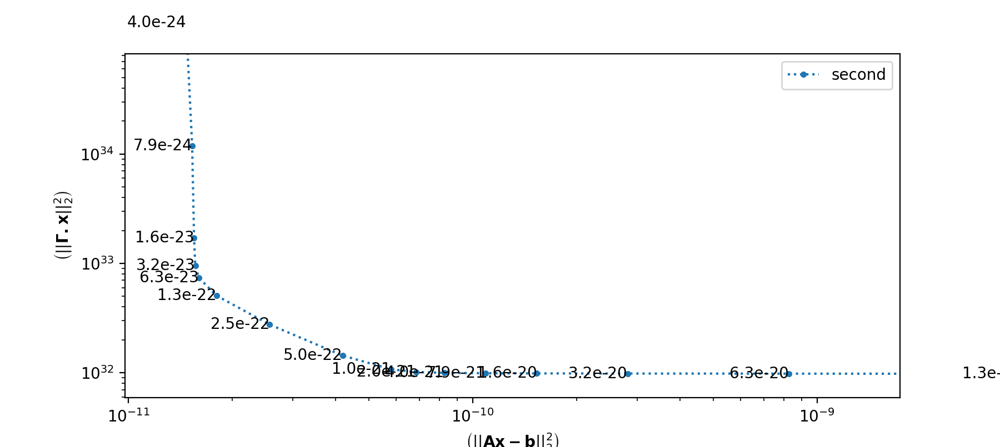

(<Figure size 900x300 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1831070c90>)

In [90]:
solve_tik.l_plot()

<IPython.core.display.Javascript object>


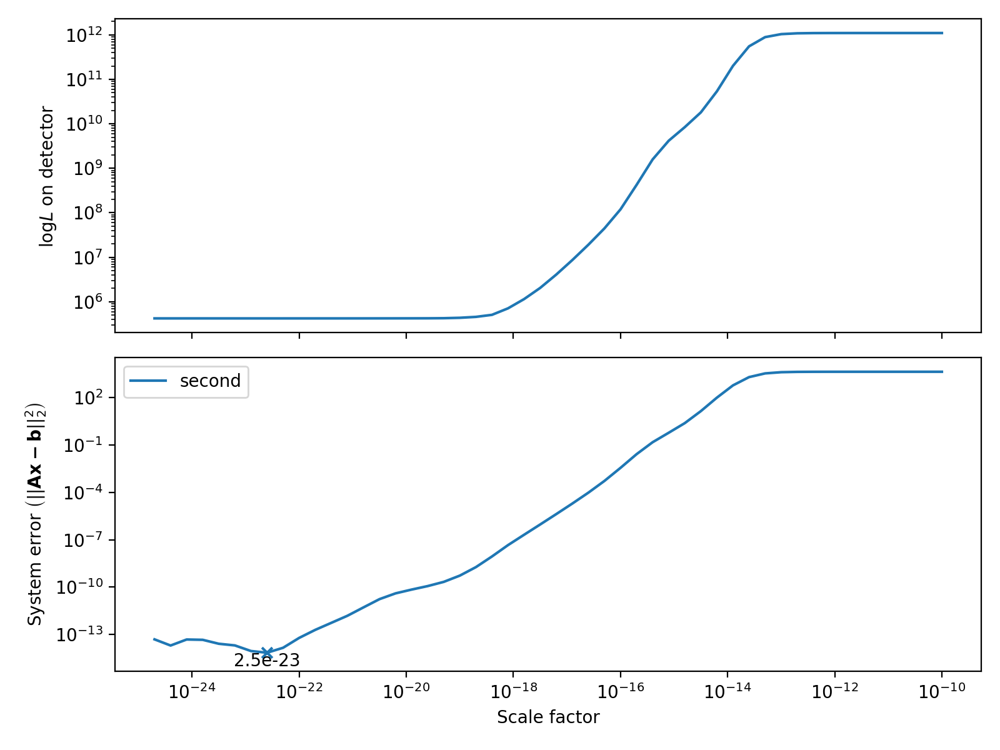

In [64]:
plot_tik_factors()

In [74]:
i_min = np.argmin(np.abs(tests['factors'] - 2.5e-23))

<IPython.core.display.Javascript object>


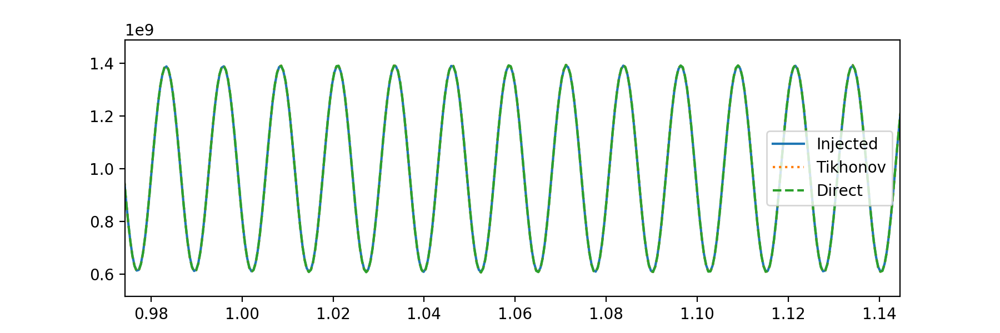

In [80]:
plt.plot(extra.lam_grid_c(0), f_th_c(extra.lam_grid_c(0)), label='Injected')
plt.plot(extra.lam_grid_c(0), extra.c_list[0].dot(tests['solution'][i_min]), ':', label='Tikhonov')
plt.plot(extra.lam_grid_c(0), f_k_c,"--", label='Direct')

plt.legend()

<IPython.core.display.Javascript object>


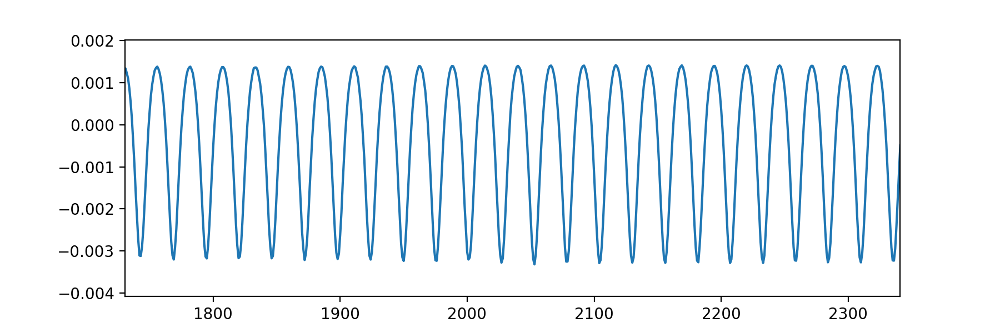

In [201]:
plt.plot((extra.c_list[0].dot(test)-f_th_c(extra.lam_grid_c(0)))/f_th_c(extra.lam_grid_c(0)))

In [366]:
factors = 10.**(-1*np.arange(10, 25, 0.3))
logl_list = {'first':[], 'second':[], 'zeroth':[]}
error = {'first':[], 'second':[], 'zeroth':[]}
results = {'first':[], 'second':[], 'zeroth':[]}
d_matrix = {'first':get_first_d(extra), 'second':get_second_d(extra), 'zeroth':identity(extra.n_k)}
# first_d = get_first_d(extra)
# second_d = get_second_d(extra)

for f in factors:
    for key in logl_list.keys():
        gamma = f * d_matrix[key]
        results[key].append(spsolve((matrix.T).dot(matrix)
                              +(gamma.T).dot(gamma),
                              (matrix.T).dot(y.T)))
        logl_list[key].append(extra.get_logl(results[key][-1]))
        error[key].append(matrix.dot(results[key][-1])-y)
        
for key in logl_list.keys():
    logl_list[key] = np.array(logl_list[key])

In [370]:
error = {'first':[], 'second':[], 'zeroth':[]}
for i_f in range(len(factors)):
    for key in logl_list.keys():
        error[key].append(matrix.dot(results[key][i_f])-y)

In [378]:
np.sum(np.array(error['first']).squeeze()**2, axis=-1)

array([2.73279333e+03, 2.68882444e+03, 2.52450335e+03, 2.00498318e+03,
       9.96079035e+02, 2.26984038e+02, 2.86668870e+01, 3.56393163e+00,
       6.80522050e-01, 1.57964994e-01, 2.72659264e-02, 3.70140175e-03,
       5.37001549e-04, 8.79645201e-05, 1.34290288e-05, 1.55739644e-06,
       1.69613364e-07, 2.90656835e-08, 7.95280018e-09, 2.60509317e-09,
       9.07482946e-10, 3.40120377e-10, 1.34358254e-10, 4.62009880e-11,
       1.30648382e-11, 3.49610902e-12, 1.12581569e-12, 4.12783552e-13,
       1.69419274e-13, 7.70650943e-14, 6.16061781e-14, 1.07653800e-13,
       4.36047392e-13, 2.10650485e-12, 5.93655974e-04, 4.16334725e-07,
       1.38543608e-05, 4.77656584e-08, 9.39401998e-08, 6.52050693e-09,
       2.84802887e-06, 4.36240970e-05, 1.15891014e-05, 1.41500618e-07,
       9.89406285e-07, 1.51299926e-07, 2.27453038e-06, 8.01561106e-04,
       2.27523015e-06, 2.27523015e-06])

<IPython.core.display.Javascript object>


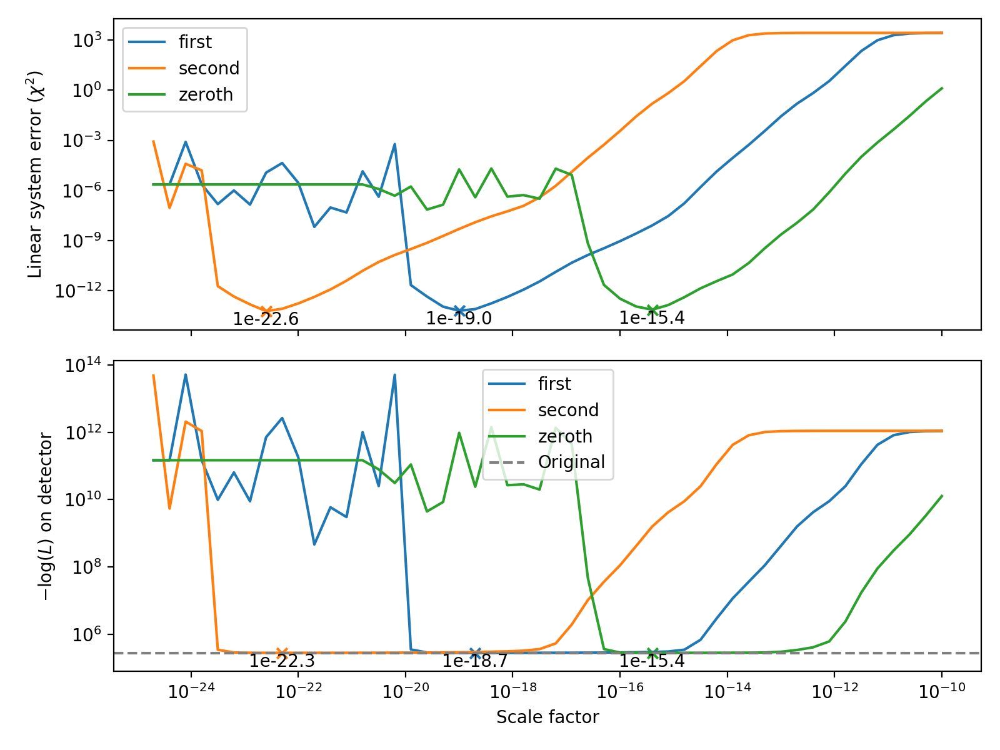

In [414]:
fig, ax = plt.subplots(2,1,sharex=True, figsize=(8,6))

for key in error:
    chi2 = np.sum(np.array(error[key]).squeeze()**2, axis=-1)
    ax[0].loglog(factors, chi2, label=key)
    i_min = np.argmin(chi2)
    ax[0].scatter(factors[i_min], chi2[i_min], marker="x")
    ax[0].text(factors[i_min], chi2[i_min],
               "1e{:2.1f}".format(np.log10(factors[i_min])), va="top", ha="center")
# ax[0].axhline(np.sum(np.array(matrix.dot(f_k)-y).squeeze()**2),
#               color="gray", linestyle="--",  label="Original")
ax[0].legend()

for key in logl_list:
    ax[1].loglog(factors, -1*logl_list[key], label=key)
    i_min = np.argmin(-1*logl_list[key])
    ax[1].scatter(factors[i_min], -1*logl_list[key][i_min], marker="x")
    ax[1].text(factors[i_min], -1*logl_list[key][i_min],
               "1e{:2.1f}".format(np.log10(factors[i_min])), va="top", ha="center")
ax[1].axhline(-1*extra.get_logl(f_k), color="gray", linestyle="--", label="Original")

ax[1].legend()

ax[1].set_xlabel("Scale factor")
ax[1].set_ylabel(r"$-\log(L)$ on detector")
ax[0].set_ylabel(r"Linear system error ($\chi^2$)")
plt.tight_layout()

### L-plot

<IPython.core.display.Javascript object>


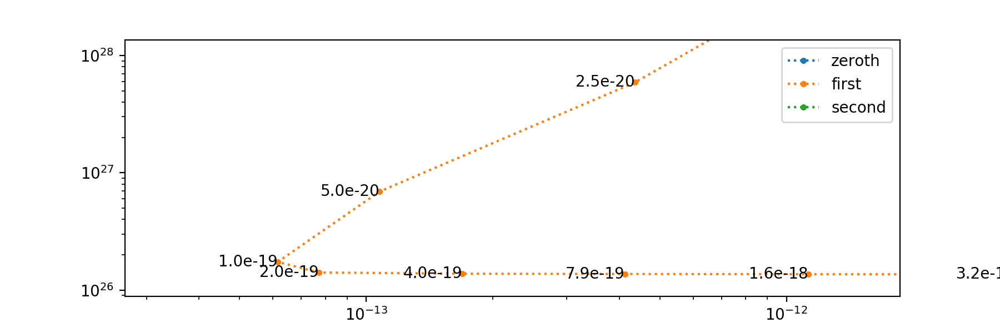

In [475]:
for key in ['zeroth','first','second']:
    chi2 = np.sum(np.array(error[key]).squeeze()**2, axis=-1)
    x_norm = [d_matrix[key].dot(x) for x in results[key]]
    x_norm = np.sum(np.array(x_norm).squeeze()**2, axis=-1)
    plt.loglog(chi2, x_norm, '.:', label=key)
    for f, x, y in zip(factors, chi2, x_norm):
        plt.text(x, y, "{:2.1e}".format(f), va="center", ha="right")
        
plt.legend()

### Second derivative of the logl plot

In [493]:
from scipy import interpolate

<IPython.core.display.Javascript object>


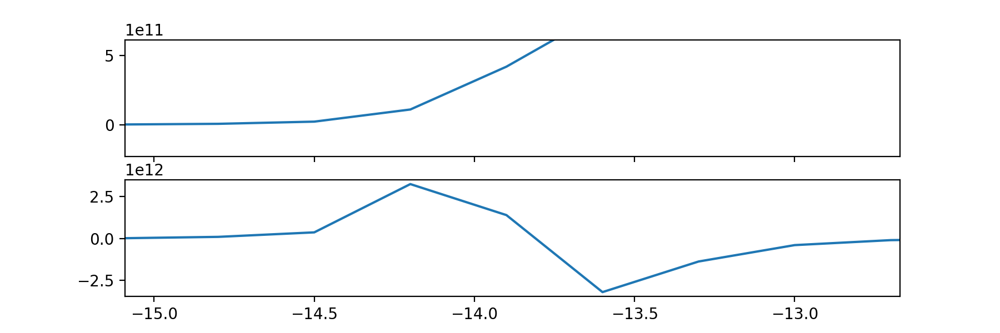

In [519]:
fig, ax = plt.subplots(2,1,sharex=True)

for key in ['second']:
    x, y = np.log10(factors), -1*logl_list[key]
    i_sort = np.argsort(x)
    tck = interpolate.splrep(x[i_sort], y[i_sort], s=0)
    x_new = -1*np.arange(10, 20, 0.01)
    y2ndder = interpolate.splev(x_new, tck, der=2)
    ax[0].plot(x, -1*logl_list[key])
    ax[1].plot(x_new, y2ndder, label=key)
# plt.ylim(-1e45, 1e45)

In [418]:
np.log10(factors[42])

-22.60000000000003

<IPython.core.display.Javascript object>


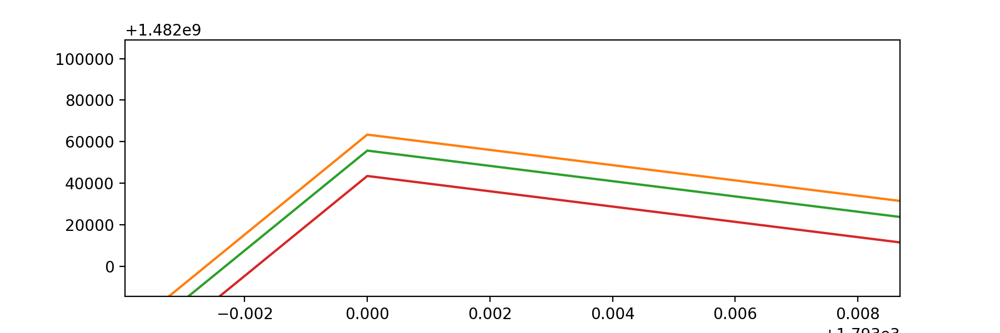

In [458]:
plt.plot(f_k)
plt.plot(results["second"][30])
plt.plot(results["second"][25])
plt.plot(results["second"][20])

<IPython.core.display.Javascript object>


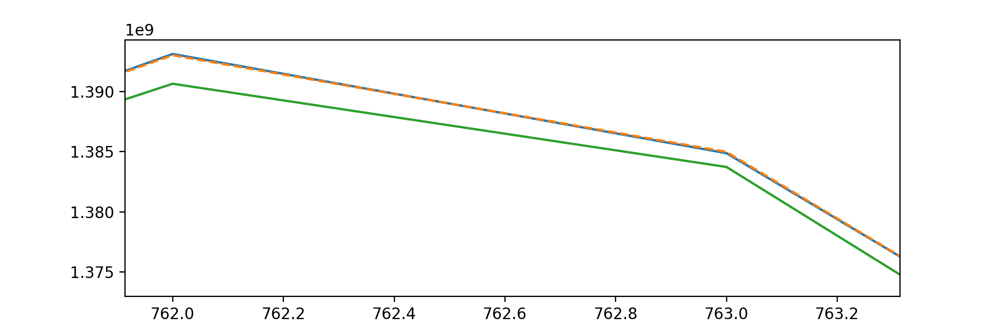

In [422]:
plt.plot(extra.c_list[0].dot(results['second'][42]))
plt.plot(f_k_c,"--")
plt.plot(f_th_c(extra.lam_grid_c(0)))

In [358]:
len(logl_list)

50

3.1622776601683017e-15


<IPython.core.display.Javascript object>


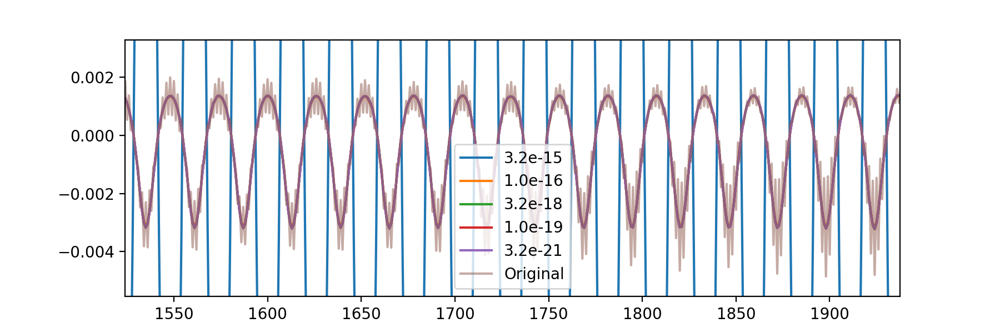

9.999999999999673e-17
3.16227766016825e-18
9.999999999999509e-20
3.1622776601681983e-21


In [522]:
key = "second"
for i in [15,20, 25,30, 35]:
    print(factors[i])
    plt.plot((extra.c_list[0].dot(results[key][i])-f_th_c(extra.lam_grid_c(0)))/f_th_c(extra.lam_grid_c(0)),
            label="{:2.1e}".format(factors[i]))
plt.plot((f_k_c-f_th_c(extra.lam_grid_c(0)))/f_th_c(extra.lam_grid_c(0)),label="Original", alpha=0.5)
plt.ylim(-0.01, 0.01)
plt.legend()

5.011872336272715e-11


<IPython.core.display.Javascript object>


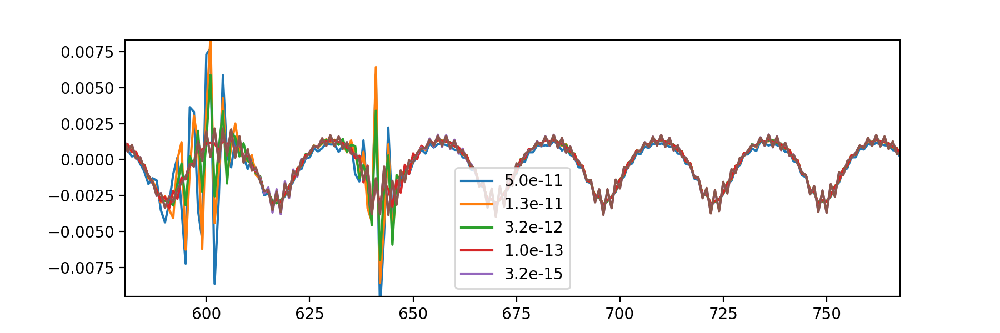

1.258925411794161e-11
3.1622776601683535e-12
9.999999999999836e-14
3.1622776601683017e-15


In [487]:
key = "zeroth"
for i in [1, 3, 5,10, 15]:
    print(factors[i])
    plt.plot((extra.c_list[0].dot(results[key][i])-f_th_c(extra.lam_grid_c(0)))/f_th_c(extra.lam_grid_c(0)),
             label="{:2.1e}".format(factors[i]))
plt.plot((f_k_c-f_th_c(extra.lam_grid_c(0)))/f_th_c(extra.lam_grid_c(0)))
plt.ylim(-0.01, 0.01)
plt.legend()

### Tikhonov iterative

# Test for different wavelenght grids and masks

In [164]:
from warnings import warn

In [169]:
import utils

In [176]:
reload(utils)
from utils import _grid_from_map

In [177]:
def grid_from_map(wv, psf, wv_range=None, poly_ord=1, out_col=False, n_os=1):
    """
    Define wavelength grid by taking the center wavelength
    at each columns given by the center of mass of
    the spatial profile (so one wavelength per column). 
    If `wv_range` is out of the wv map,
    extrapolate with a polynomial of order `poly_ord`.
    
    Parameters
    ----------
    wv : (N, M) array
        Array of the central wavelength position
        for a given order on the (N, M) detector.
    psf : (N, M) array
        Array of the spatial profile for
        the a given order on the (N, M) detector.
    wv_range : 2-element list, optional
        Minimum and maximum boundary of the grid to generate. In microns.
        `wv_range` must include some wavelenghts of `wv`.
    poly_ord : int, optional
        Order of the polynomial use to extrapolate the grid. Default is 1.
    out_col : bool, optional
        Return or not. It will be forced to False if extrapolation is needed.
    n_os : 2 element list or int, optional
        Oversampling of the grid compare to the pixel sampling.
        Can be specified for each orders if a list is given. 
        If `int` is given, take same value for both orders.
        Default is 2.
    """
    # Different treatement if `wv_range` is given
    if wv_range is None:
        out = _grid_from_map(wv, psf, out_col=out_col)
    else:
        # Get grid
        grid, col = _grid_from_map(wv, psf, out_col=True)
        
        # Check if extrapolation needed. 
        # If so, `out_col` must be False
        extrapolate = (wv_range[0] < grid.min())
        extrapolate |= (wv_range[1] > grid.max())
        if extrapolate and out_col:
            out_col = False
            warn("Cannot extrapolate and return columns."
                 + " Setting `out_col` to False.")

        # Make sure grid is between the range
        cond = (wv_range[0] <= grid) & (grid <= wv_range[-1])
        grid, col = grid[cond], col[cond]
        # Check if grid and wv_range are compatible
        if not cond.any():
            raise ValueError("Invalid `wv` or `wv_range`."
                             +" `wv_range`: {}".format(wv_range))
        
        # Extrapolate values out of the wv_map if needed
        if extrapolate:
            grid = _extrapolate_grid(grid, poly_ord, wv_range)
        
        # Different output depending on `out_col`
        if out_col:
            out = grid, col
        else:
            out = grid
        
    # Apply oversampling
    if out_col:
        # Return grid and columns
        return [oversample_grid(out_i, n_os=n_os) for out_i in out]
    else:
        # Only the grid
        return oversample_grid(out, n_os=n_os)
    
def _extrapolate_grid(grid, poly_ord, wv_range):
    """ 
    Extrapolate `grid` using d_grid as a function of
    `grid` to compute iteratively the next extrapolated nodes.
    The extapolation is done with a polynomial of order `poly_ord`.
    The extrapolation range is given by `wv_range`.
    Returns the extrapolated grid.
    """
    # Define delta_grid as a function of grid
    # by fitting a polynomial
    d_grid = np.diff(grid)
    f_dgrid = np.polyfit(grid[:-1], d_grid, poly_ord)
    f_dgrid = np.poly1d(f_dgrid)

    # Extrapolate values out of the wv_map if needed
    grid_left, grid_right = [], []
    if wv_range[0] < grid.min():
        # Need the grid value to get delta_grid ...
        grid_left = [grid.min() - f_dgrid(grid.min())]
        # ... and iterate to get the next one until
        # the range is reached
        while grid_left[-1] > wv_range[0]:
            grid_left.append(grid_left[-1] - f_dgrid(grid_left[-1]))
        # Need to sort (and unique)
        grid_left = np.unique(grid_left)
    if wv_range[-1] > grid.max():
        # Need the grid value to get delta_grid ...
        grid_right = [grid.max() + f_dgrid(grid.max())]
        # ... and iterate to get the next one until
        # the range is reached
        while grid_right[-1] < wv_range[-1]:
            grid_right.append(grid_right[-1] + f_dgrid(grid_right[-1]))        
    
    # Combine to get output        
    return np.concatenate([grid_left, grid, grid_right])

def get_soss_grid(p_list, lam_list, lam_min=0.55, lam_max=3.0, n_os=None):
    """
    Return a wavelength grid specific for NIRISS SOSS mode.
    Assume 2 orders are given.
    See `grid_from_map` function if only one order is needed.
    
    Parameters
    ----------
    p_list : (N_ord=2, N, M) list or array of 2-D arrays
        A list or array of the spatial profile for
        the 2 orders on the (N, M) detector.
    lam_list : (N_ord=2, N, M) list or array of 2-D arrays
        A list or array of the central wavelength position
        for the 2 orders on the (N, M) detector.
    lam_min : float, optional
        Minimum boundary of the grid to generate. In microns.
    lam_max : float, optional
        Maximum boundary of the grid to generate. In microns.
    n_os : 2 element list or int, optional
        Oversampling of the grid compare to the pixel sampling.
        Can be specified for each orders if a list is given. 
        If `int` is given, take same value for both orders.
        Default is 2.
    """
    # Check n_os input.
    # Default value is 2 for each orders
    if n_os is None:
        n_os = [2, 2]
    else:
        # Check if input has length = 2
        try:
            length = len(n_os)
        # If scalar, same value for each orders
        except TypeError:
            n_os = [n_os, n_os]
        else:
            if length != 2:
                err = ValueError(
                    "len(n_os) == {},".format(length)
                    + " but it must have length = 2"
                    + " or be a scalar."
                )
                raise err
    
    # Generate wavelength range for each orders
    # Order 1 covers the reddest part of the spectrum,
    # so apply `lam_max`on order 1. Opposite for order 2.
    range_list = [[wv_1.min(), lam_max],
                  [lam_min, wv_2.max()]]
    
    # Use grid given by the wavelength at the center of the pixels 
    # at the center of mass of the spatial profile
    # (so one wavelength per column)
    # Do it for both orders and apply oversampling
    lam_grid = [grid_from_map(wv_i, p_i, wv_range=rng_i, n_os=i_os)
                for wv_i, p_i, rng_i, i_os
                in zip(lam_list, p_list, range_list, n_os)]

    # Remove values from order 1 that are already covered by order 2
    lam_grid[0] = lam_grid[0][lam_grid[0] > lam_grid[1].max()]

    # Combine both grid
    out_grid = np.concatenate(lam_grid)

    # Make sure sorted and unique
    return np.unique(out_grid)

In [181]:
grid_from_map(wv_1, P1, n_os=5, wv_range=[0.5, 3.0], out_col=True)

/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:42: UserWarning: Cannot extrapolate and return columns. Setting `out_col` to False.


[array([0.49917079, 0.4993563 , 0.49954181, ..., 2.99971625, 2.99991999,
        3.00012372]),
 array([   4. ,    4.2,    4.4, ..., 2042.6, 2042.8, 2043. ])]

In [178]:
get_soss_grid([P1, P2], [wv_1, wv_2], lam_min=1.3, lam_max=3.0, n_os=[10, 4]).shape

(17015,)

In [6]:
# Use grid given by the wavelength at the center of the pixels 
# with the maximum value of the spatial profile (so one wavelength per column)
# Do it for both orders
lam_grid_2 = grid_from_map(wv_2, P2, wv_range=[0.55, wv_2.max()])
lam_grid_1 = grid_from_map(wv_1, P1, wv_range=[wv_1.min(), 3.0])

# Remove values from order 1 that are already covered by order 2
lam_grid_1 = lam_grid_1[lam_grid_1 > lam_grid_2.max()]

# Oversample by subdividing both grid and finally combine it
lam_simu = np.concatenate([oversample_grid(lam_grid_2, n_os=10), oversample_grid(lam_grid_1, n_os=15)])

# Make sure sorted and unique
lam_simu = np.unique(lam_simu)

In [65]:
from importlib import reload
import overlap

In [88]:
reload(overlap)
from overlap import TrpzOverlap

In [89]:
wv_range = [0.3, 2.9]
n_oversample = 2

# Define grid for extraction
# To be improved, but for now, choose the grid from order 1
lam_grid = grid_from_map(wv_1, P1, wv_range=wv_range)
lam_grid = oversample_grid(lam_grid, n_os=n_oversample)
lam_grid = np.unique(lam_grid)

In [90]:
mask = np.indices((256,2048))[1] > 1000

In [91]:
# Init extraction object
# Use more restrictive cut on the spatial and the kernel
extra = TrpzOverlap([P1,P2], [wv_1,wv_2], scidata=scidata, lam_grid=lam_grid, thresh=1e-5,
                    c_kwargs={'thresh':0.001}, mask=mask)

In [92]:
extra.extract()

array([nan, nan, nan, ..., nan, nan, nan])

<IPython.core.display.Javascript object>


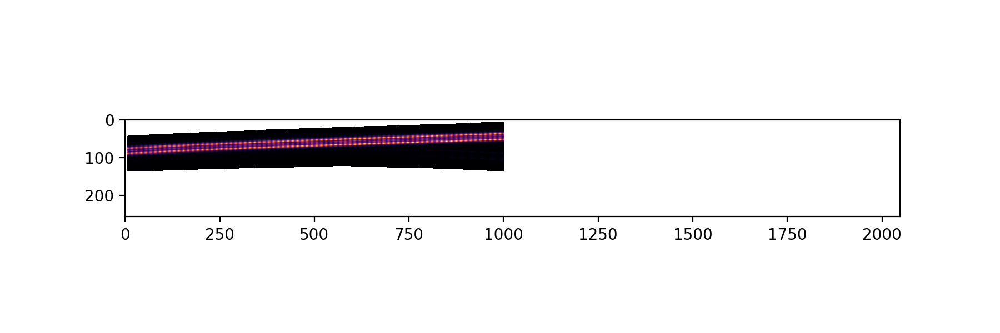

In [94]:
plt.imshow(extra.rebuild(extra.extract()))

<IPython.core.display.Javascript object>


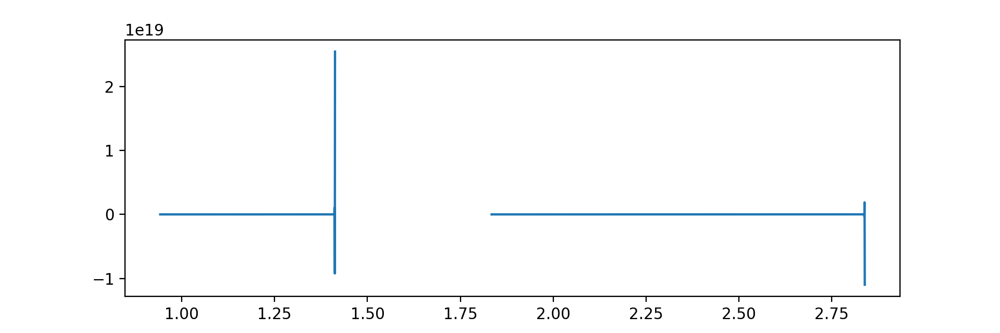

In [95]:
plt.plot(extra.lam_grid, extra.extract())

# Tests for adaptive wavelength grid

## Based on Richardson extrapolation applied to the trapezoidal rule. <br>This is known as the Romberg integration method
The idea is to start with an initial grid based on order 1 pixel sampling (and extrapolated to order 2 wavelengths). Then, for each of these sub-intervals, we apply the Romberg method to find to the grid required to reach the user's specified precision at each pixel.

We need to know the function that needs to be integrated, so we have to run a first extraction. Then, for the wavelength range covered by order 2, the function used in the integral is the flux at order 2 resolution and the flux at order 1 resolution is used for the rest. We can separate this problem in 2 functions in 2 non-overlaping ranges. Note that we have to spline interpolate the functions to be able to evaluate them.

### Run first extraction to estimate f_k

In [259]:
wv_range = [0.6, 2.836]
n_oversample = 1

# Define grid for extraction
# To be improved, but for now, choose the grid from order 1
lam_grid = grid_from_map(wv_1, P1, wv_range=wv_range)
lam_grid = oversample_grid(lam_grid, n_os=n_oversample)
lam_grid = np.unique(lam_grid)

In [260]:
# Init extraction object
# Use more restrictive cut on the spatial and the kernel
extra = TrpzOverlap([P1,P2], [wv_1,wv_2], scidata=scidata, lam_grid=lam_grid, thresh=1e-5,
                    c_kwargs={'thresh':0.001})

In [261]:
f_k = extra.extract()

In [185]:
os_grid = extra.get_adapt_grid(f_k=f_k, rtol=0.01, n_max=3)

<IPython.core.display.Javascript object>


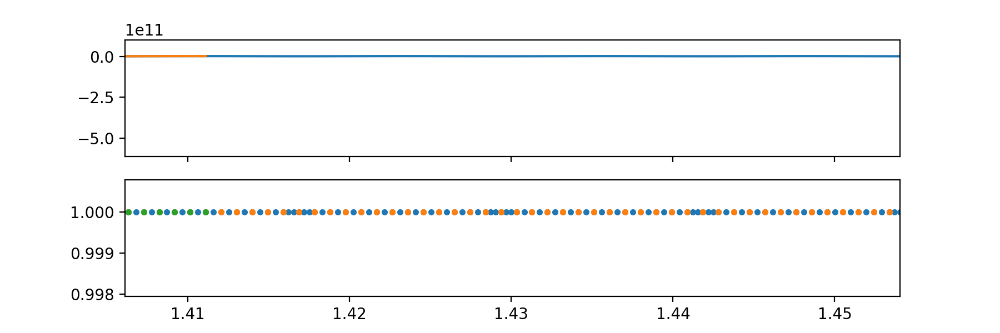

In [186]:
fig, ax = plt.subplots(2,1,sharex=True)

ax[0].plot(extra.lam_grid_c(0), extra.c_list[0].dot(f_k))
ax[0].plot(extra.lam_grid_c(1), extra.c_list[1].dot(f_k))

ax[1].plot(os_grid, np.ones_like(os_grid),".")
ax[1].plot(extra.lam_grid_c(0), np.ones_like(extra.lam_grid_c(0)),".")
ax[1].plot(extra.lam_grid_c(1), np.ones_like(extra.lam_grid_c(1)),".")

In [187]:
# Init extraction object
# Use more restrictive cut on the spatial and the kernel
extra = TrpzOverlap([P1,P2], [wv_1,wv_2], scidata=scidata, lam_grid=os_grid, thresh=1e-5,
                    c_kwargs={'thresh':0.001})

In [188]:
f_k = extra.extract()
rebuilt = extra.rebuild(f_k)

In [189]:
i_bad = np.abs((rebuilt-scidata)/scidata * 100) > 20
rebuilt[i_bad] = np.nan

/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


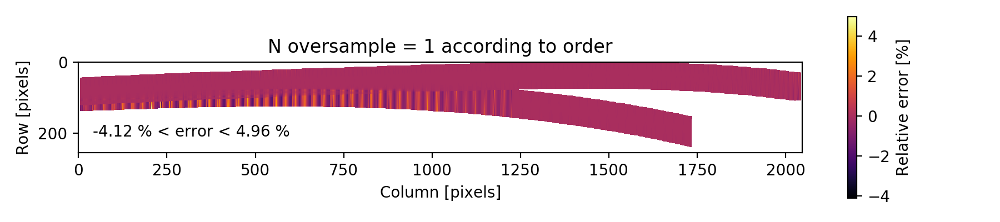

<IPython.core.display.Javascript object>


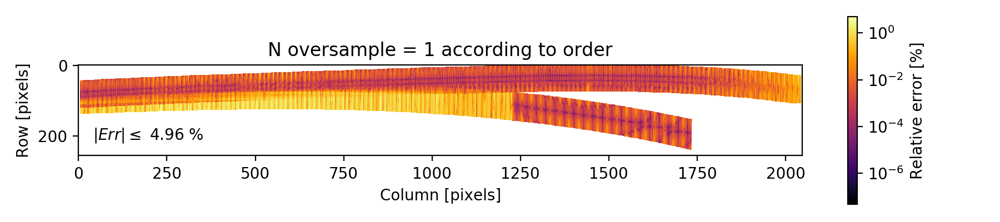

<IPython.core.display.Javascript object>


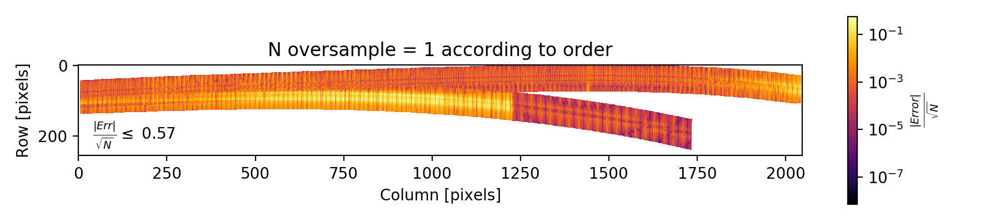

In [190]:
plt.figure(figsize=(9,2))
plt.title("N oversample = {} according to order".format(n_oversample))
plt.imshow((rebuilt-scidata)/scidata * 100)
cmap = plt.colorbar(label="Relative error [%]")
plt.text(40,210, "{:.2f} % < error < {:.2f} %".format(cmap.vmin, cmap.vmax))
plt.ylabel('Row [pixels]')
plt.xlabel('Column [pixels]')
plt.tight_layout()

plt.figure(figsize=(9,2))
plt.title("N oversample = {} according to order".format(n_oversample))
plt.imshow(np.abs(rebuilt-scidata)/scidata * 100, norm=LogNorm())
cmap = plt.colorbar(label="Relative error [%]")
plt.text(40,210, r"$| Err | \leq$" + " {:.2f} %".format(cmap.vmax))
plt.ylabel('Row [pixels]')
plt.xlabel('Column [pixels]')
plt.tight_layout()

plt.figure(figsize=(9,2))
plt.title("N oversample = {} according to order".format(n_oversample))
plt.imshow(np.abs(rebuilt-scidata)/np.sqrt(scidata),norm=LogNorm())
cmap = plt.colorbar(label=r"$\frac{| Error |}{\sqrt{N}}$")
plt.text(40,210, r"$\frac{|Err|}{\sqrt{N}} \leq$" + " {:.2f}".format(cmap.vmax))
plt.ylabel('Row [pixels]')
plt.xlabel('Column [pixels]')
plt.tight_layout()

<IPython.core.display.Javascript object>


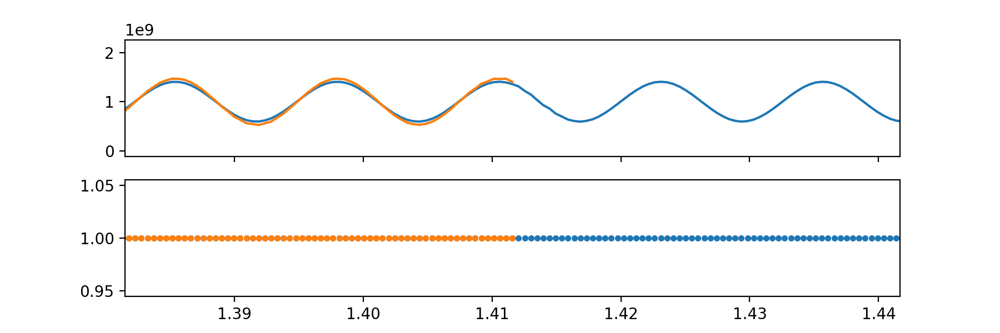

In [397]:
fig, ax = plt.subplots(2,1,sharex=True)

ax[0].plot(extra.lam_grid_c(0), extra.c_list[0].dot(f_k))
ax[0].plot(extra.lam_grid_c(1), extra.c_list[1].dot(f_k))

# ax[1].plot(os_grid, np.ones_like(os_grid),".")
ax[1].plot(extra.lam_grid_c(0), np.ones_like(extra.lam_grid_c(0)),".")
ax[1].plot(extra.lam_grid_c(1), np.ones_like(extra.lam_grid_c(1)),".")

## For presentation

- [x] Reference files
- [x] Figure avec box sum (ajout ordre 2)
- [x] Sub-array
- [ ] Jason's

In [21]:
class BoxExtract:
    
    def __init__(self, scidata, wv_map, profile=None, weights=False, thresh=1.0e-8):
        
        if profile is None:
            # Normalised profile profile
            profile = scidata / np.nansum(scidata, axis=0)
            profile[np.isnan(profile)] = 0.
        
        if weights:
            weights = profile.copy()
            weights[weights <= thresh] = 0.
            weights /= np.sum(weights**2, axis=0)
        else:
            weights = (profile > thresh).astype(float)


        output = grid_from_map(wv_map, weights, out_col=True)
        self.lam_grid, self.good_cols = output
        
        self.data = scidata.copy()
        self.weights = weights
        
    def extract(self):
        
        w = self.weights
        data = self.data
        i_good = self.good_cols
        
        return np.nansum((data * w)[:, i_good], axis=0)
    
    

<IPython.core.display.Javascript object>


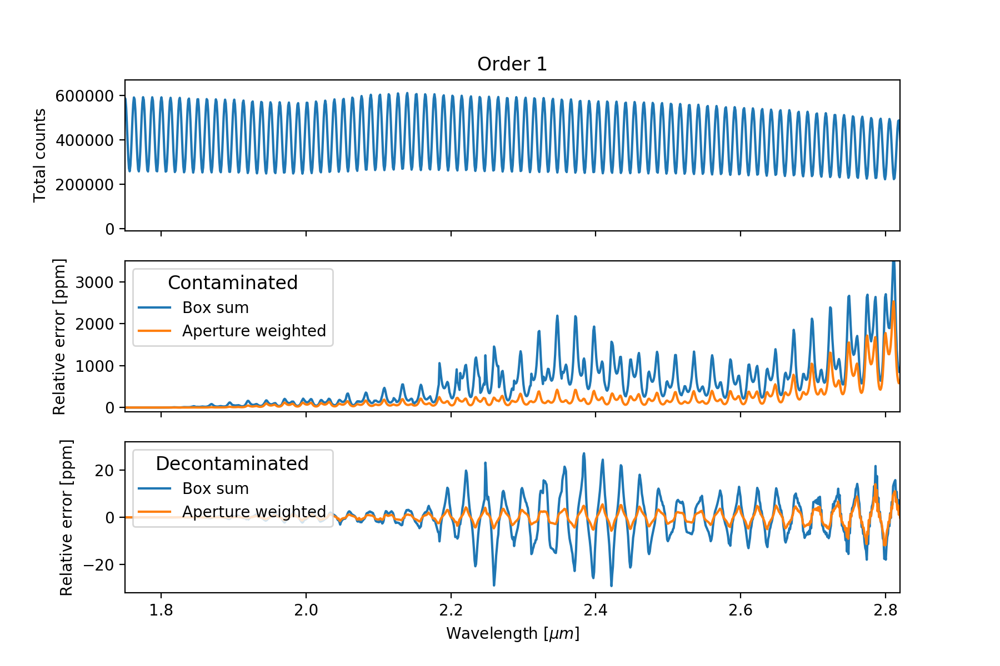

/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]
/Users/antoinedb/Documents/Doctorat/SOSS/jwst-mtl/SOSS/extract/utils.py:90: RuntimeWarning: invalid value encountered in greater
  i_good = (psf > 0).any(axis=0)


<IPython.core.display.Javascript object>


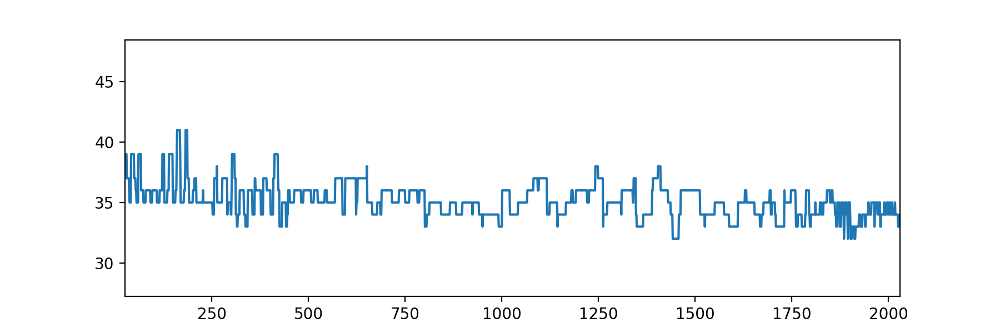

/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in less_equal


In [179]:
decontaminated = scidata - extra.rebuild(f_k, orders=[1])

contaminated = scidata.copy()

#############

box_clean = BoxExtract(clean_data, wv_1, profile=P1, thresh=2e-3)
box_cont = BoxExtract(contaminated, wv_1, profile=P1, thresh=2e-3)
box_decon = BoxExtract(decontaminated, wv_1, profile=P1, thresh=2e-3)

fig, ax = plt.subplots(3,1, sharex=True, figsize=(9,6))
ax[0].plot(np.flipud(box_clean.lam_grid), box_clean.extract())
ax[0].set_ylabel("Total counts")

ax[1].plot(np.flipud(box_clean.lam_grid),
           (box_cont.extract()- box_clean.extract())/box_clean.extract()*1e6, 
           label="Box sum")

ax[2].plot(np.flipud(box_clean.lam_grid),
           (box_clean.extract()-box_decon.extract())/box_clean.extract()*1e6, 
           label="Box sum")

###############

box_clean = BoxExtract(clean_data, wv_1, profile=P1, weights=True, thresh=2e-3)
box_cont = BoxExtract(contaminated, wv_1, profile=P1, weights=True, thresh=2e-3)
box_decon = BoxExtract(decontaminated, wv_1, profile=P1, weights=True, thresh=2e-3)

# ax[0].plot(np.flipud(box_clean.lam_grid), box_clean.extract())

ax[1].plot(np.flipud(box_clean.lam_grid),
           (box_cont.extract()- box_clean.extract())/box_clean.extract()*1e6,
           label="Aperture weighted")

ax[2].plot(np.flipud(box_clean.lam_grid),
           (box_clean.extract()-box_decon.extract())/box_clean.extract()*1e6,
           label="Aperture weighted")


##################

ax[1].set_ylabel("Relative error [ppm]")
ax[1].set_ylim(-100,3500)
# ax[1].text(0.02, 0.8, "Contaminated", transform = ax[1].transAxes)
ax[1].legend(title_fontsize=12,loc=2,title="Contaminated")

ax[2].set_ylabel("Relative error [ppm]")
ax[2].set_ylim(-32,32)
# ax[2].text(0.02, 0.8, "Decontaminated", transform = ax[2].transAxes)
ax[2].legend(title_fontsize=12,loc=2,title="Decontaminated")

plt.xlim(1.75, 2.82)
plt.xlabel("Wavelength [$\mu m$]")
ax[0].set_title("Order 1")

plt.figure()

index = np.indices(box_clean.weights.shape)[0]
index = np.ma.array(index, mask=(box_clean.weights <= 0))

plt.plot(index.max(axis=0) - index.min(axis=0))

<IPython.core.display.Javascript object>


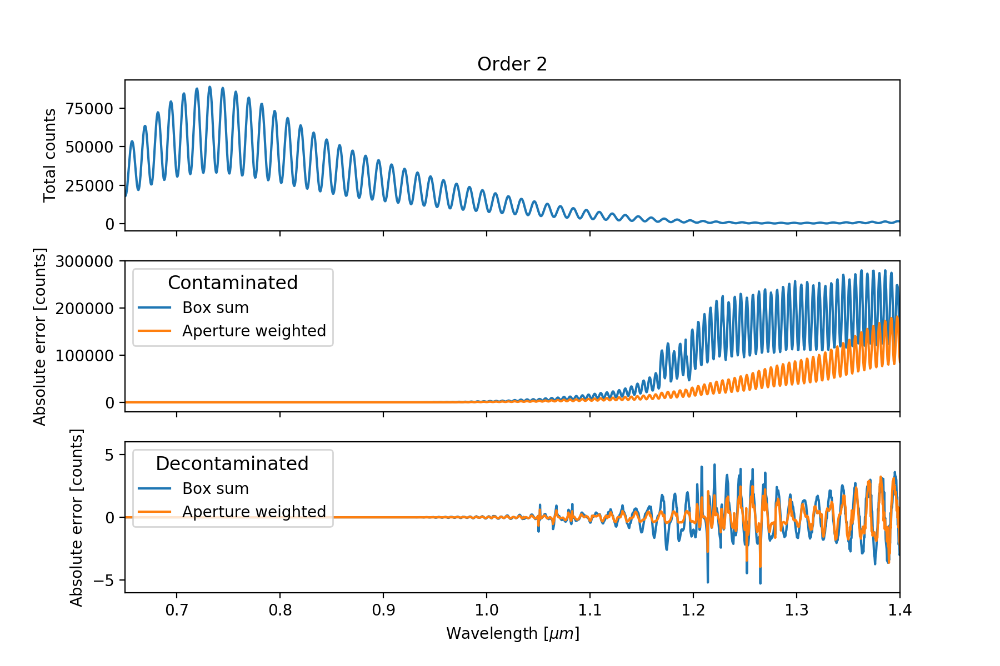

/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]
/Users/antoinedb/Documents/Doctorat/SOSS/jwst-mtl/SOSS/extract/utils.py:90: RuntimeWarning: invalid value encountered in greater
  i_good = (psf > 0).any(axis=0)


Text(0.5, 1.0, 'Order 2')

In [233]:
decontaminated = scidata - extra.rebuild(f_k, orders=[0])

contaminated = scidata.copy()

#############

box_clean = BoxExtract(clean_data_2, wv_2, profile=P2, thresh=2e-3)
box_cont = BoxExtract(contaminated, wv_2, profile=P2, thresh=2e-3)
box_decon = BoxExtract(decontaminated, wv_2, profile=P2, thresh=2e-3)

fig, ax = plt.subplots(3,1, sharex=True, figsize=(9,6))
ax[0].plot(np.flipud(box_clean.lam_grid), box_clean.extract())

ax[0].set_ylabel("Total counts")

ax[1].plot(np.flipud(box_clean.lam_grid),
           (box_cont.extract()- box_clean.extract()), 
           label="Box sum")

ax[2].plot(np.flipud(box_clean.lam_grid),
           (box_clean.extract()-box_decon.extract()), 
           label="Box sum")

###############

box_clean = BoxExtract(clean_data_2, wv_2, profile=P2, weights=True, thresh=2e-3)
box_cont = BoxExtract(contaminated, wv_2, profile=P2, weights=True, thresh=2e-3)
box_decon = BoxExtract(decontaminated, wv_2, profile=P2, weights=True, thresh=2e-3)

# ax[0].plot(np.flipud(box_clean.lam_grid), box_clean.extract())

ax[1].plot(np.flipud(box_clean.lam_grid),
           (box_cont.extract()- box_clean.extract()),
           label="Aperture weighted")

ax[2].plot(np.flipud(box_clean.lam_grid),
           (box_clean.extract()-box_decon.extract()),
           label="Aperture weighted")


##################

ax[1].set_ylabel("Absolute error [counts]")
ax[1].set_ylim(-20000,300000)
# ax[1].text(0.02, 0.8, "Contaminated", transform = ax[1].transAxes)
ax[1].legend(title_fontsize=12,loc=2,title="Contaminated")

ax[2].set_ylabel("Absolute error [counts]")
ax[2].set_ylim(-6,6)
# ax[2].text(0.02, 0.8, "Decontaminated", transform = ax[2].transAxes)
ax[2].legend(title_fontsize=12,loc=2,title="Decontaminated")

plt.xlim(0.65, 1.4)
plt.xlabel("Wavelength [$\mu m$]")
ax[0].set_title("Order 2")
        
    
        

<IPython.core.display.Javascript object>


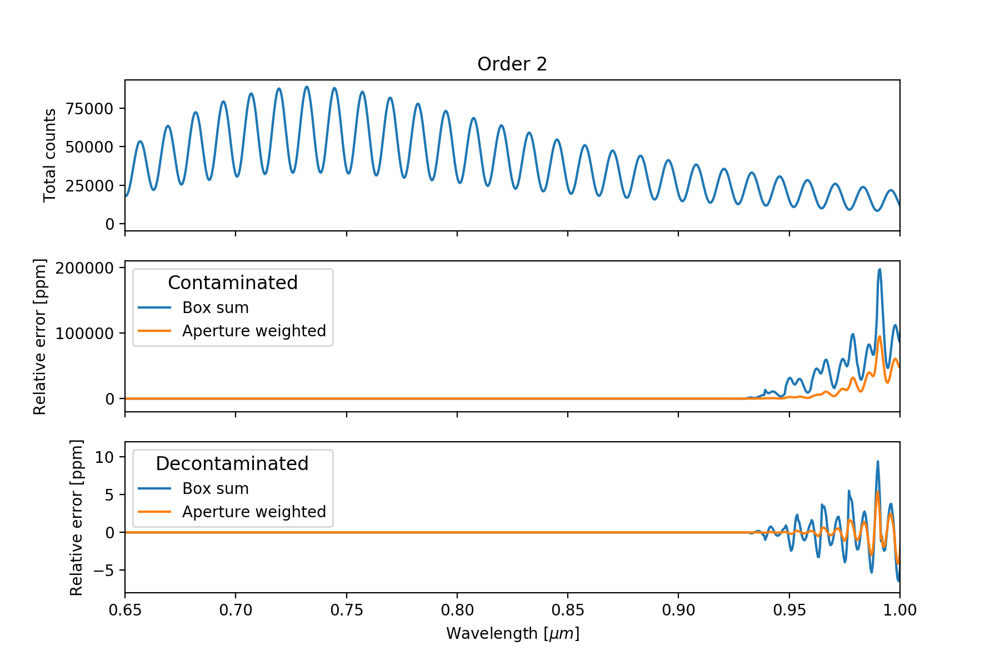

/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: divide by zero encountered in true_divide
/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide
/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]
/Users/antoinedb/Documents/Doctorat/SOSS/jwst-mtl/SOSS/extract/utils.py:90: RuntimeWarning: invalid value encountered in greater
  i_good = (psf > 0).any(axis=0)
/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: divide by zero encountered in true_divide
/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in tr

Text(0.5, 1.0, 'Order 2')

In [242]:
decontaminated = scidata - extra.rebuild(f_k, orders=[0])

contaminated = scidata.copy()

#############

box_clean = BoxExtract(clean_data_2, wv_2, profile=P2, thresh=2e-3)
box_cont = BoxExtract(contaminated, wv_2, profile=P2, thresh=2e-3)
box_decon = BoxExtract(decontaminated, wv_2, profile=P2, thresh=2e-3)

fig, ax = plt.subplots(3,1, sharex=True, figsize=(9,6))
ax[0].plot(np.flipud(box_clean.lam_grid), box_clean.extract())

ax[0].set_ylabel("Total counts")

ax[1].plot(np.flipud(box_clean.lam_grid),
           (box_cont.extract()- box_clean.extract())/box_clean.extract()*1e6, 
           label="Box sum")

ax[2].plot(np.flipud(box_clean.lam_grid),
           (box_clean.extract()-box_decon.extract())/box_clean.extract()*1e6, 
           label="Box sum")

###############

box_clean = BoxExtract(clean_data_2, wv_2, profile=P2, weights=True, thresh=2e-3)
box_cont = BoxExtract(contaminated, wv_2, profile=P2, weights=True, thresh=2e-3)
box_decon = BoxExtract(decontaminated, wv_2, profile=P2, weights=True, thresh=2e-3)

# ax[0].plot(np.flipud(box_clean.lam_grid), box_clean.extract())

ax[1].plot(np.flipud(box_clean.lam_grid),
           (box_cont.extract()- box_clean.extract())/box_clean.extract()*1e6,
           label="Aperture weighted")

ax[2].plot(np.flipud(box_clean.lam_grid),
           (box_clean.extract()-box_decon.extract())/box_clean.extract()*1e6,
           label="Aperture weighted")


##################

ax[1].set_ylabel("Relative error [ppm]")
ax[1].set_ylim(-20000,210000)
# ax[1].text(0.02, 0.8, "Contaminated", transform = ax[1].transAxes)
ax[1].legend(title_fontsize=12,loc=2,title="Contaminated")

ax[2].set_ylabel("Relative error [ppm]")
ax[2].set_ylim(-8,12)
# ax[2].text(0.02, 0.8, "Decontaminated", transform = ax[2].transAxes)
ax[2].legend(title_fontsize=12,loc=2,title="Decontaminated")

plt.xlim(0.65, 1.)
plt.xlabel("Wavelength [$\mu m$]")
ax[0].set_title("Order 2")
        
    
        

### Substrip 96

In [243]:
n_oversample = 1

# Define grid for extraction
# To be improved, but for now, choose the grid from order 1
lam_grid = grid_from_map(wv_1, P1)
lam_grid = oversample_grid(lam_grid, n_os=n_oversample)
lam_grid = np.unique(lam_grid)

In [245]:
# Init extraction object
# Use more restrictive cut on the spatial and the kernel
extra = TrpzOverlap([P1[:96],P2[:96]], [wv_1[:96],wv_2[:96]], scidata=scidata[:96],
                    lam_grid=lam_grid, thresh=1e-5, c_kwargs={'thresh':0.001})

In [246]:
f_k = extra.extract()

In [247]:
os_grid = extra.get_adapt_grid(f_k=f_k, rtol=0.5)

<IPython.core.display.Javascript object>


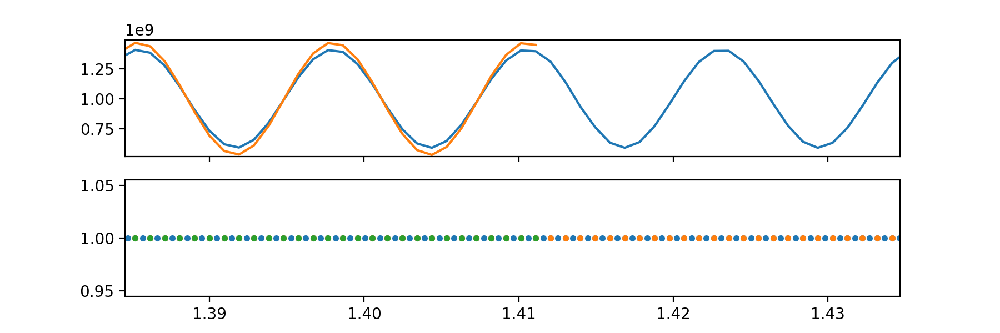

In [248]:
fig, ax = plt.subplots(2,1,sharex=True)

ax[0].plot(extra.lam_grid_c(0), extra.c_list[0].dot(f_k))
ax[0].plot(extra.lam_grid_c(1), extra.c_list[1].dot(f_k))

ax[1].plot(os_grid, np.ones_like(os_grid),".")
ax[1].plot(extra.lam_grid_c(0), np.ones_like(extra.lam_grid_c(0)),".")
ax[1].plot(extra.lam_grid_c(1), np.ones_like(extra.lam_grid_c(1)),".")

In [249]:
# Init extraction object
# Use more restrictive cut on the spatial and the kernel
extra = TrpzOverlap([P1[:96],P2[:96]], [wv_1[:96],wv_2[:96]], scidata=scidata[:96],
                    lam_grid=os_grid, thresh=1e-5, c_kwargs={'thresh':0.001})

In [250]:
f_k = extra.extract()
rebuilt = extra.rebuild(f_k)

In [251]:
i_bad = np.abs((rebuilt-scidata)/scidata * 100) > 20
rebuilt[i_bad] = np.nan

ValueError: operands could not be broadcast together with shapes (96,2048) (256,2048) 

<IPython.core.display.Javascript object>


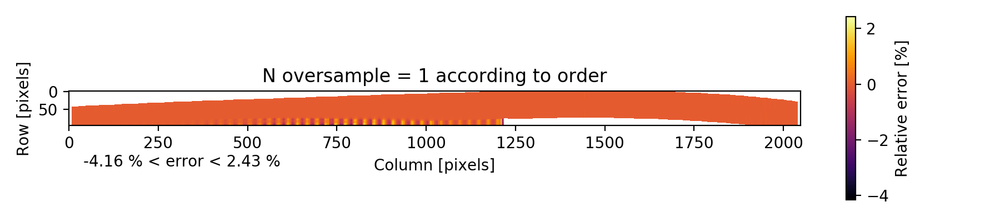

<IPython.core.display.Javascript object>


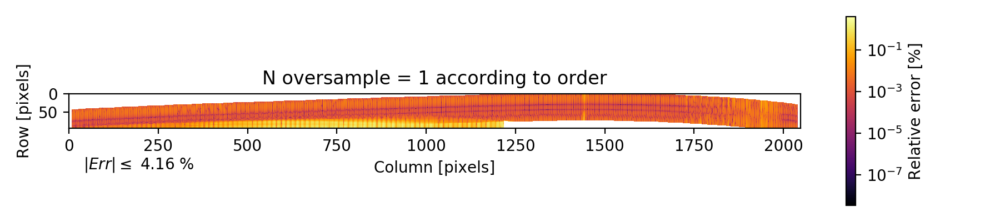

<IPython.core.display.Javascript object>


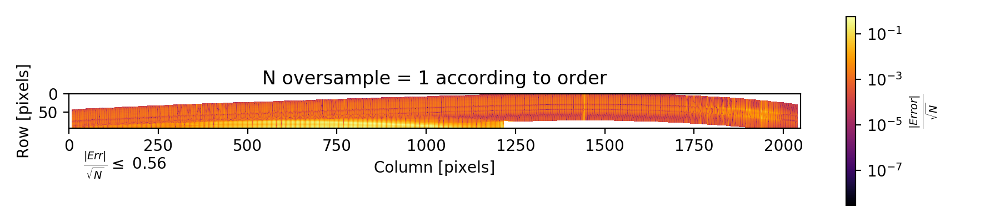

In [253]:
plt.figure(figsize=(9,2))
plt.title("N oversample = {} according to order".format(n_oversample))
plt.imshow((rebuilt-scidata[:96])/scidata[:96] * 100)
cmap = plt.colorbar(label="Relative error [%]")
plt.text(40,210, "{:.2f} % < error < {:.2f} %".format(cmap.vmin, cmap.vmax))
plt.ylabel('Row [pixels]')
plt.xlabel('Column [pixels]')
plt.tight_layout()

plt.figure(figsize=(9,2))
plt.title("N oversample = {} according to order".format(n_oversample))
plt.imshow(np.abs(rebuilt-scidata[:96])/scidata[:96] * 100, norm=LogNorm())
cmap = plt.colorbar(label="Relative error [%]")
plt.text(40,210, r"$| Err | \leq$" + " {:.2f} %".format(cmap.vmax))
plt.ylabel('Row [pixels]')
plt.xlabel('Column [pixels]')
plt.tight_layout()

plt.figure(figsize=(9,2))
plt.title("N oversample = {} according to order".format(n_oversample))
plt.imshow(np.abs(rebuilt-scidata[:96])/np.sqrt(scidata[:96]),norm=LogNorm())
cmap = plt.colorbar(label=r"$\frac{| Error |}{\sqrt{N}}$")
plt.text(40,210, r"$\frac{|Err|}{\sqrt{N}} \leq$" + " {:.2f}".format(cmap.vmax))
plt.ylabel('Row [pixels]')
plt.xlabel('Column [pixels]')
plt.tight_layout()

In [258]:
BoxExtract(clean_data[:96], wv_1[:96], profile=P1[:96], thresh=2e-3).extract()

array([ 41798.26430412, 478996.89220742, 464286.56889644, ...,
       117389.85388656, 103958.91578315,  21831.2374025 ])

In [271]:
print(wv_1[:96].shape)

(96, 2048)


<IPython.core.display.Javascript object>


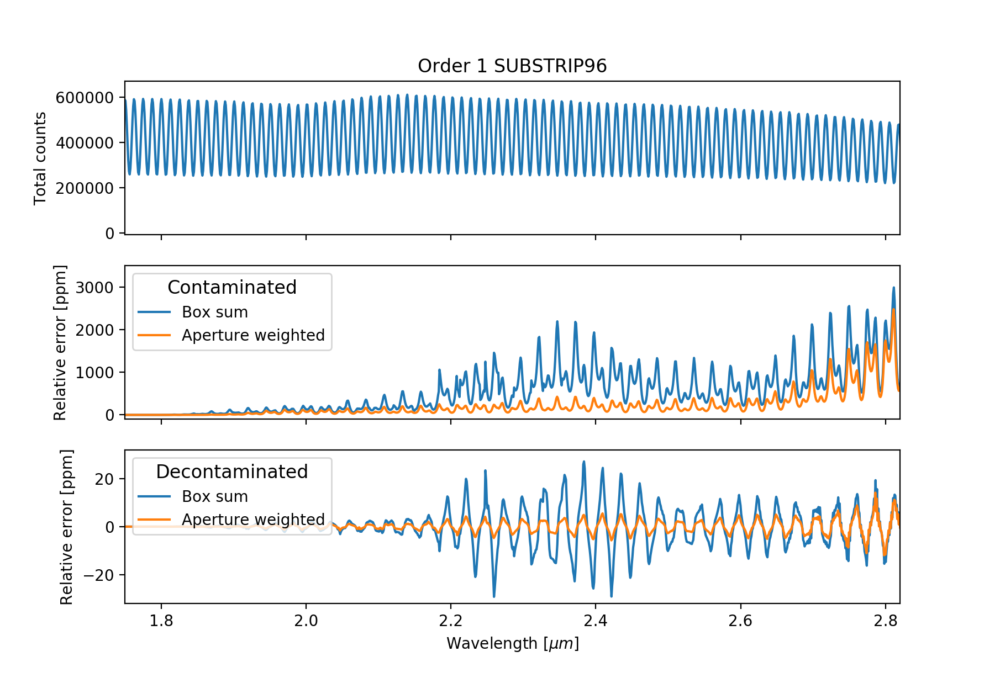

/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]
/Users/antoinedb/Documents/Doctorat/SOSS/jwst-mtl/SOSS/extract/utils.py:90: RuntimeWarning: invalid value encountered in greater
  i_good = (psf > 0).any(axis=0)


<IPython.core.display.Javascript object>


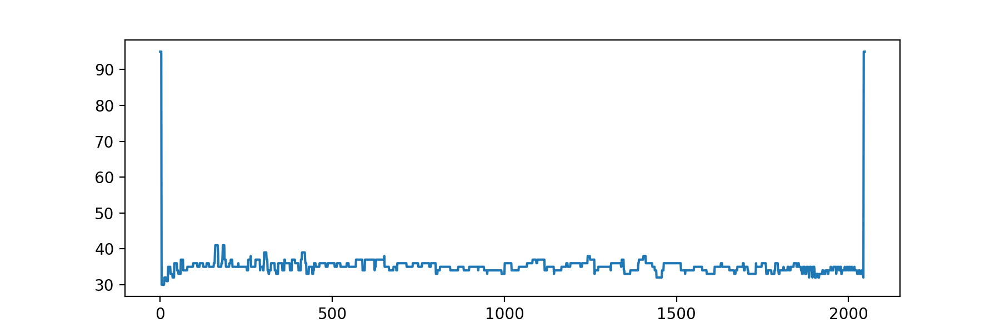

/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:61: RuntimeWarning: invalid value encountered in less_equal


In [275]:
decontaminated = scidata[:96] - extra.rebuild(f_k, orders=[1])

contaminated = scidata[:96].copy()

#############

box_clean = BoxExtract(clean_data[:96], wv_1[:96], profile=P1[:96], thresh=2e-3)
box_cont = BoxExtract(contaminated, wv_1[:96], profile=P1[:96], thresh=2e-3)
box_decon = BoxExtract(decontaminated, wv_1[:96], profile=P1[:96], thresh=2e-3)

fig, ax = plt.subplots(3,1, sharex=True, figsize=(9,6))
ax[0].plot(np.flipud(box_clean.lam_grid), box_clean.extract())
ax[0].set_ylabel("Total counts")

ax[1].plot(np.flipud(box_clean.lam_grid),
           (box_cont.extract()- box_clean.extract())/box_clean.extract()*1e6, 
           label="Box sum")

ax[2].plot(np.flipud(box_clean.lam_grid),
           (box_clean.extract()-box_decon.extract())/box_clean.extract()*1e6, 
           label="Box sum")

###############

box_clean = BoxExtract(clean_data[:96], wv_1[:96], profile=P1[:96], weights=True, thresh=2e-3)
box_cont = BoxExtract(contaminated, wv_1[:96], profile=P1[:96], weights=True, thresh=2e-3)
box_decon = BoxExtract(decontaminated, wv_1[:96], profile=P1[:96], weights=True, thresh=2e-3)

box_cont.extract()

# ax[0].plot(np.flipud(box_clean.lam_grid), box_clean.extract())

ax[1].plot(np.flipud(box_clean.lam_grid),
           (box_cont.extract()- box_clean.extract())/box_clean.extract()*1e6,
           label="Aperture weighted")

ax[2].plot(np.flipud(box_clean.lam_grid),
           (box_clean.extract()-box_decon.extract())/box_clean.extract()*1e6,
           label="Aperture weighted")


##################

ax[1].set_ylabel("Relative error [ppm]")
ax[1].set_ylim(-100,3500)
# ax[1].text(0.02, 0.8, "Contaminated", transform = ax[1].transAxes)
ax[1].legend(title_fontsize=12,loc=2,title="Contaminated")

ax[2].set_ylabel("Relative error [ppm]")
ax[2].set_ylim(-32,32)
# ax[2].text(0.02, 0.8, "Decontaminated", transform = ax[2].transAxes)
ax[2].legend(title_fontsize=12,loc=2,title="Decontaminated")

plt.xlim(1.75, 2.82)
plt.xlabel("Wavelength [$\mu m$]")
ax[0].set_title("Order 1 SUBSTRIP96")

plt.figure()

index = np.indices(box_clean.weights.shape)[0]
index = np.ma.array(index, mask=(box_clean.weights <= 0))

plt.plot(index.max(axis=0) - index.min(axis=0))

## Inject random spectrum (worst case possible)

In [52]:
# Generate flux to inject
flux = 0.0001 + 6*np.random.random(lam_simu.shape)
# Multiplication by a fudge factor to get
# a realistic number of counts on the detector
flux *= 1e9

# Inject
scidata = simu.rebuild(flux)
clean_data = simu_no_overlap.rebuild(flux)
clean_data_2 = simu_no_overlap_2.rebuild(flux)

<IPython.core.display.Javascript object>


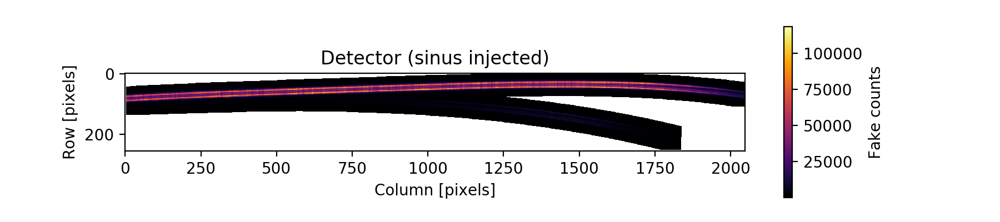

In [53]:
plt.figure(figsize=(9,2))
plt.imshow(scidata)#, norm=LogNorm())
cmap = plt.colorbar()
plt.title('Detector (sinus injected)')
plt.ylabel('Row [pixels]')
plt.xlabel('Column [pixels]')
cmap.set_label('Fake counts')

### Run first extraction to estimate f_k

In [153]:
wv_range = [0.6, 2.836]
n_oversample = 1

# Define grid for extraction
# To be improved, but for now, choose the grid from order 1
lam_grid = grid_from_map(wv_1, P1, wv_range=wv_range)
lam_grid = oversample_grid(lam_grid, n_os=n_oversample)
lam_grid = np.unique(lam_grid)

In [154]:
# Init extraction object
# Use more restrictive cut on the spatial and the kernel
extra = TrpzOverlap([P1,P2], [wv_1,wv_2], scidata=scidata, lam_grid=lam_grid, thresh=1e-5,
                    c_kwargs={'thresh':0.001})

In [155]:
f_k = extra.extract()

In [156]:
os_grid = extra.get_adapt_grid(f_k=f_k, rtol=0.001, n_max=3)

<IPython.core.display.Javascript object>


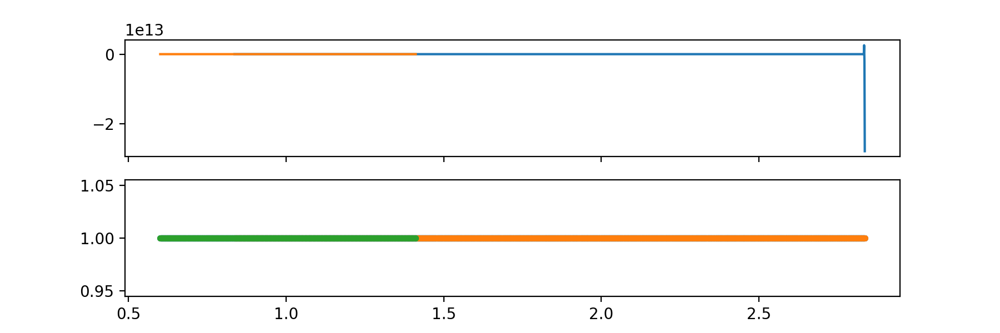

In [157]:
fig, ax = plt.subplots(2,1,sharex=True)

ax[0].plot(extra.lam_grid_c(0), extra.c_list[0].dot(f_k))
ax[0].plot(extra.lam_grid_c(1), extra.c_list[1].dot(f_k))

ax[1].plot(os_grid, np.ones_like(os_grid),".")
ax[1].plot(extra.lam_grid_c(0), np.ones_like(extra.lam_grid_c(0)),".")
ax[1].plot(extra.lam_grid_c(1), np.ones_like(extra.lam_grid_c(1)),".")

In [158]:
# Init extraction object
# Use more restrictive cut on the spatial and the kernel
extra = TrpzOverlap([P1,P2], [wv_1,wv_2], scidata=scidata, lam_grid=os_grid, thresh=1e-5,
                    c_kwargs={'thresh':0.001})

In [159]:
f_k = extra.extract()
rebuilt = extra.rebuild(f_k)

In [160]:
i_bad = np.abs((rebuilt-scidata)/scidata * 100) > 20
rebuilt[i_bad] = np.nan

/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


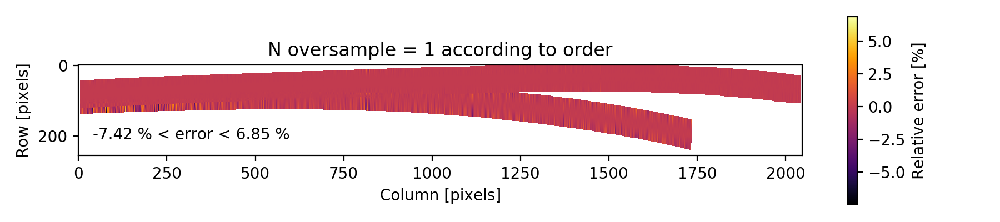

<IPython.core.display.Javascript object>


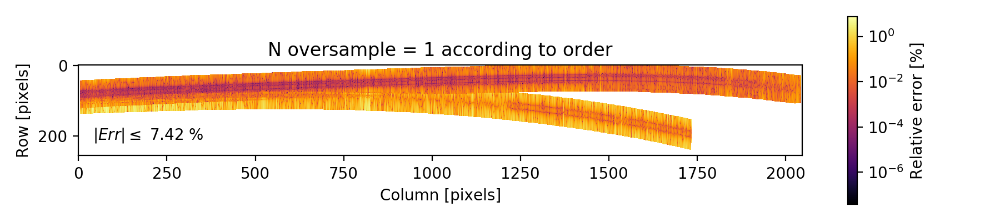

<IPython.core.display.Javascript object>


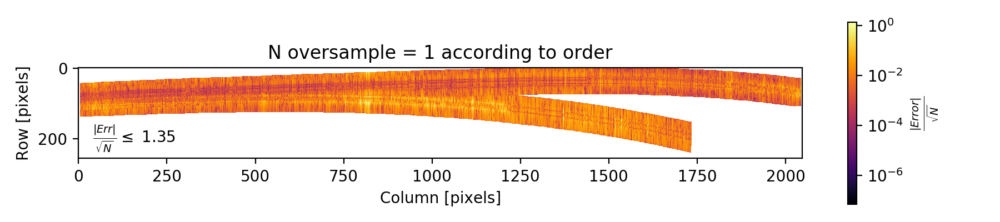

In [151]:
plt.figure(figsize=(9,2))
plt.title("N oversample = {} according to order".format(n_oversample))
plt.imshow((rebuilt-scidata)/scidata * 100)
cmap = plt.colorbar(label="Relative error [%]")
plt.text(40,210, "{:.2f} % < error < {:.2f} %".format(cmap.vmin, cmap.vmax))
plt.ylabel('Row [pixels]')
plt.xlabel('Column [pixels]')
plt.tight_layout()

plt.figure(figsize=(9,2))
plt.title("N oversample = {} according to order".format(n_oversample))
plt.imshow(np.abs(rebuilt-scidata)/scidata * 100, norm=LogNorm())
cmap = plt.colorbar(label="Relative error [%]")
plt.text(40,210, r"$| Err | \leq$" + " {:.2f} %".format(cmap.vmax))
plt.ylabel('Row [pixels]')
plt.xlabel('Column [pixels]')
plt.tight_layout()

plt.figure(figsize=(9,2))
plt.title("N oversample = {} according to order".format(n_oversample))
plt.imshow(np.abs(rebuilt-scidata)/np.sqrt(scidata),norm=LogNorm())
cmap = plt.colorbar(label=r"$\frac{| Error |}{\sqrt{N}}$")
plt.text(40,210, r"$\frac{|Err|}{\sqrt{N}} \leq$" + " {:.2f}".format(cmap.vmax))
plt.ylabel('Row [pixels]')
plt.xlabel('Column [pixels]')
plt.tight_layout()

<IPython.core.display.Javascript object>


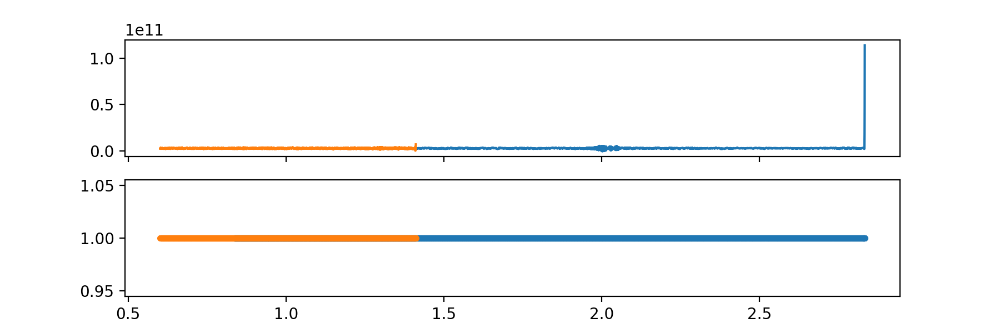

In [93]:
fig, ax = plt.subplots(2,1,sharex=True)

ax[0].plot(extra.lam_grid_c(0), extra.c_list[0].dot(f_k))
ax[0].plot(extra.lam_grid_c(1), extra.c_list[1].dot(f_k))

# ax[1].plot(os_grid, np.ones_like(os_grid),".")
ax[1].plot(extra.lam_grid_c(0), np.ones_like(extra.lam_grid_c(0)),".")
ax[1].plot(extra.lam_grid_c(1), np.ones_like(extra.lam_grid_c(1)),".")

<IPython.core.display.Javascript object>


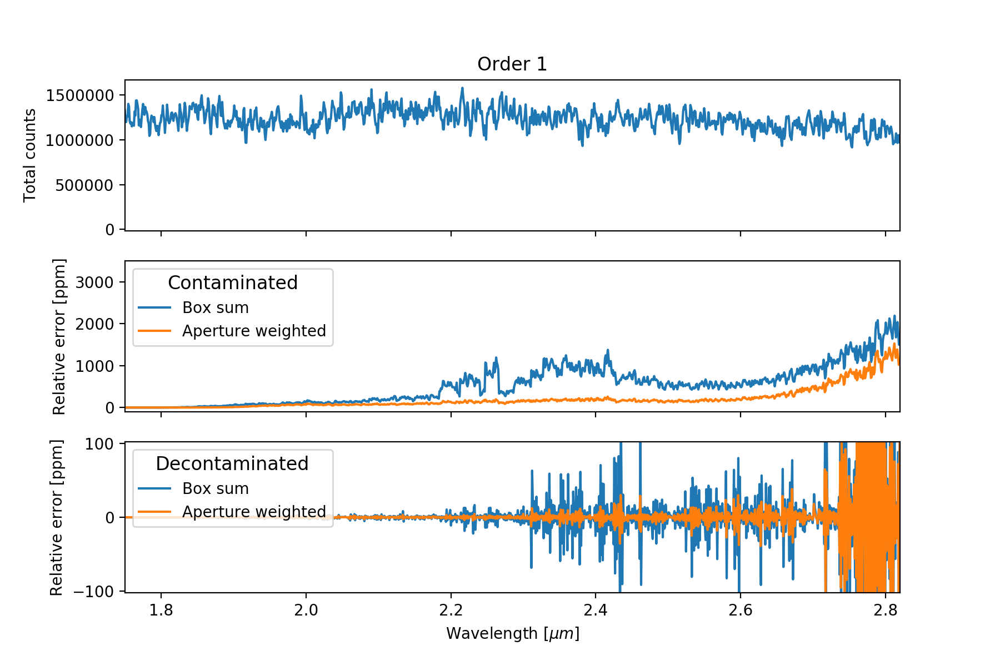

/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]
/Users/antoinedb/Documents/Doctorat/SOSS/jwst-mtl/SOSS/extract/utils.py:90: RuntimeWarning: invalid value encountered in greater
  i_good = (psf > 0).any(axis=0)


<IPython.core.display.Javascript object>


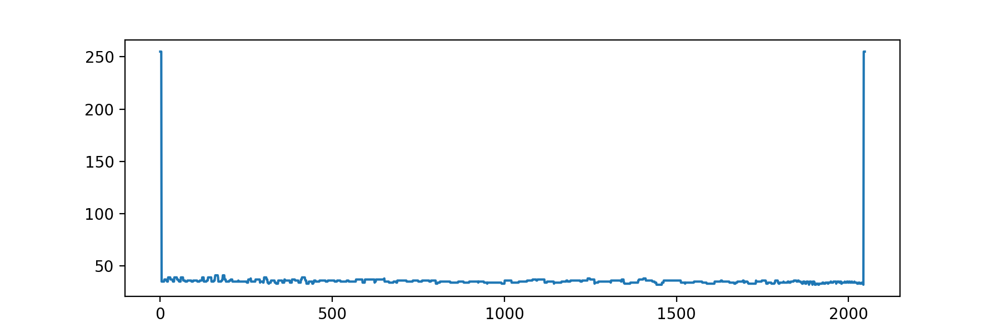

/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: invalid value encountered in less_equal


In [162]:
decontaminated = scidata - extra.rebuild(f_k, orders=[1])

contaminated = scidata.copy()

#############

box_clean = BoxExtract(clean_data, wv_1, profile=P1, thresh=2e-3)
box_cont = BoxExtract(contaminated, wv_1, profile=P1, thresh=2e-3)
box_decon = BoxExtract(decontaminated, wv_1, profile=P1, thresh=2e-3)

fig, ax = plt.subplots(3,1, sharex=True, figsize=(9,6))
ax[0].plot(np.flipud(box_clean.lam_grid), box_clean.extract())
ax[0].set_ylabel("Total counts")

ax[1].plot(np.flipud(box_clean.lam_grid),
           (box_cont.extract()- box_clean.extract())/box_clean.extract()*1e6, 
           label="Box sum")

ax[2].plot(np.flipud(box_clean.lam_grid),
           (box_clean.extract()-box_decon.extract())/box_clean.extract()*1e6, 
           label="Box sum")

###############

box_clean = BoxExtract(clean_data, wv_1, profile=P1, weights=True, thresh=2e-3)
box_cont = BoxExtract(contaminated, wv_1, profile=P1, weights=True, thresh=2e-3)
box_decon = BoxExtract(decontaminated, wv_1, profile=P1, weights=True, thresh=2e-3)

# ax[0].plot(np.flipud(box_clean.lam_grid), box_clean.extract())

ax[1].plot(np.flipud(box_clean.lam_grid),
           (box_cont.extract()- box_clean.extract())/box_clean.extract()*1e6,
           label="Aperture weighted")

ax[2].plot(np.flipud(box_clean.lam_grid),
           (box_clean.extract()-box_decon.extract())/box_clean.extract()*1e6,
           label="Aperture weighted")


##################

ax[1].set_ylabel("Relative error [ppm]")
ax[1].set_ylim(-100,3500)
# ax[1].text(0.02, 0.8, "Contaminated", transform = ax[1].transAxes)
ax[1].legend(title_fontsize=12,loc=2,title="Contaminated")

ax[2].set_ylabel("Relative error [ppm]")
ax[2].set_ylim(-102,102)
# ax[2].text(0.02, 0.8, "Decontaminated", transform = ax[2].transAxes)
ax[2].legend(title_fontsize=12,loc=2,title="Decontaminated")

plt.xlim(1.75, 2.82)
plt.xlabel("Wavelength [$\mu m$]")
ax[0].set_title("Order 1")

plt.figure()

index = np.indices(box_clean.weights.shape)[0]
index = np.ma.array(index, mask=(box_clean.weights <= 0))

plt.plot(index.max(axis=0) - index.min(axis=0))

### Jason's simu!

In [351]:
# Read relevant files
path = "/Users/antoinedb/Documents/Doctorat/SOSS/ExtractionTestFiles/"
wv_1 = np.load(path + "wv_map_1_jason.npy")
wv_2 = np.load(path + "wv_map_2_jason.npy")
data1 = fits.open(path + "trace_order1.fits")[0].data
data2 = fits.open(path + "trace_order2.fits")[0].data

# Convert to float (fits precision is 1e-8)
wv_1 = wv_1.astype(float)
wv_2 = wv_2.astype(float)
# data1 = data1.astype(float)
# data2 = data2.astype(float)

In [314]:
# Normalised spatial profile
P1 = data1 / data1.sum(axis=0)
P1[np.isnan(P1)] = 0.

P2 = data2 / data2.sum(axis=0)
P2[np.isnan(P2)] = 0.

In [332]:
P2[:,1715:] = 0.0

In [315]:
scidata = data1 + data2

In [321]:
wv_range = [0.65, 2.836]
n_oversample = 1

# Define grid for extraction
# To be improved, but for now, choose the grid from order 1
lam_grid = grid_from_map(wv_1, P1, wv_range=wv_range)
lam_grid = oversample_grid(lam_grid, n_os=n_oversample)
lam_grid = np.unique(lam_grid)

In [344]:
# Init extraction object
# Use more restrictive cut on the spatial and the kernel
extra = TrpzOverlap([P1,P2], [wv_1,wv_2], scidata=scidata, lam_grid=lam_grid, thresh=2e-4,
                    c_kwargs={'thresh':0.001})

<IPython.core.display.Javascript object>


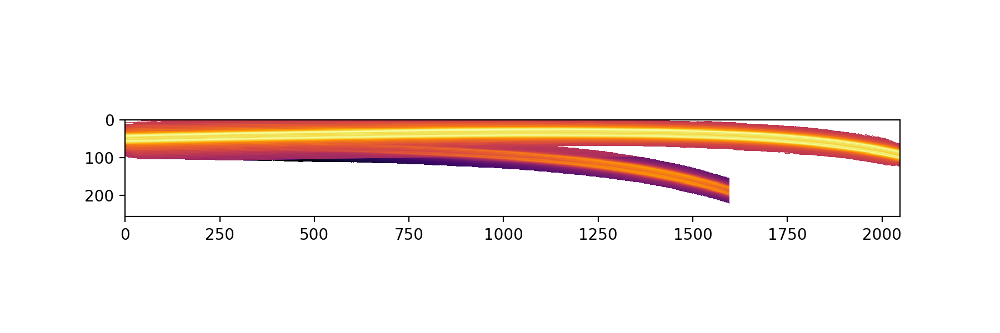

In [345]:
plt.imshow(extra.data, norm=LogNorm())

In [346]:
f_k = extra.extract()

In [347]:
os_grid = extra.get_adapt_grid(f_k=f_k, rtol=0.5)

<IPython.core.display.Javascript object>


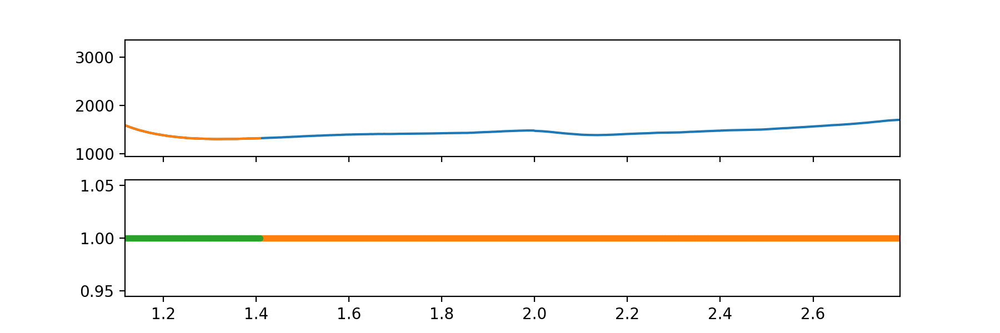

In [348]:
fig, ax = plt.subplots(2,1,sharex=True)

ax[0].plot(extra.lam_grid_c(0), extra.c_list[0].dot(f_k))
ax[0].plot(extra.lam_grid_c(1), extra.c_list[1].dot(f_k))
ax[0].set_ylim(0,None)

ax[1].plot(os_grid, np.ones_like(os_grid),".")
ax[1].plot(extra.lam_grid_c(0), np.ones_like(extra.lam_grid_c(0)),".")
ax[1].plot(extra.lam_grid_c(1), np.ones_like(extra.lam_grid_c(1)),".")

In [18]:
# Init extraction object
# Use more restrictive cut on the spatial and the kernel
extra = TrpzOverlap([P1,P2], [wv_1,wv_2], scidata=scidata, lam_grid=os_grid, thresh=1e-5,
                    c_kwargs={'thresh':0.001})

In [19]:
f_k = extra.extract()
rebuilt = extra.rebuild(f_k)

In [20]:
i_bad = np.abs((rebuilt-scidata)/scidata * 100) > 20
rebuilt[i_bad] = np.nan

/Users/antoinedb/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in greater
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


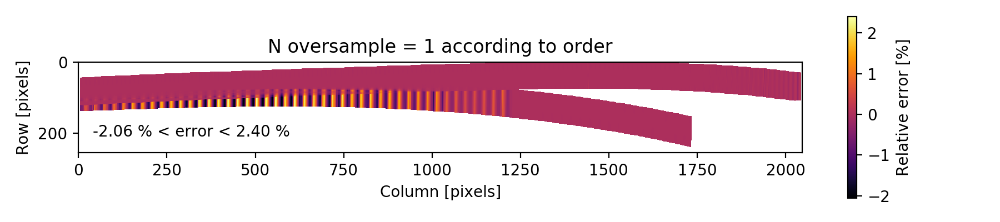

<IPython.core.display.Javascript object>


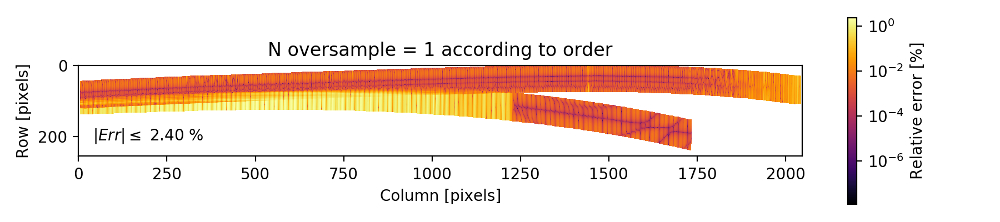

<IPython.core.display.Javascript object>


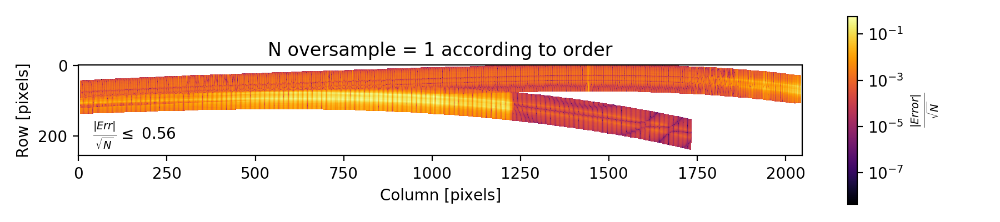

In [102]:
plt.figure(figsize=(9,2))
plt.title("N oversample = {} according to order".format(n_oversample))
plt.imshow((rebuilt-scidata)/scidata * 100)
cmap = plt.colorbar(label="Relative error [%]")
plt.text(40,210, "{:.2f} % < error < {:.2f} %".format(cmap.vmin, cmap.vmax))
plt.ylabel('Row [pixels]')
plt.xlabel('Column [pixels]')
plt.tight_layout()

plt.figure(figsize=(9,2))
plt.title("N oversample = {} according to order".format(n_oversample))
plt.imshow(np.abs(rebuilt-scidata)/scidata * 100, norm=LogNorm())
cmap = plt.colorbar(label="Relative error [%]")
plt.text(40,210, r"$| Err | \leq$" + " {:.2f} %".format(cmap.vmax))
plt.ylabel('Row [pixels]')
plt.xlabel('Column [pixels]')
plt.tight_layout()

plt.figure(figsize=(9,2))
plt.title("N oversample = {} according to order".format(n_oversample))
plt.imshow(np.abs(rebuilt-scidata)/np.sqrt(scidata),norm=LogNorm())
cmap = plt.colorbar(label=r"$\frac{| Error |}{\sqrt{N}}$")
plt.text(40,210, r"$\frac{|Err|}{\sqrt{N}} \leq$" + " {:.2f}".format(cmap.vmax))
plt.ylabel('Row [pixels]')
plt.xlabel('Column [pixels]')
plt.tight_layout()

# To delete

In [280]:
import spgen

In [281]:
reload(spgen)

<module 'spgen' from '/Users/antoinedb/Documents/Doctorat/SOSS/jwst-mtl/SOSS/specgen/spgen.py'>

In [289]:
from sys import path
path.append("/Users/antoinedb/Documents/Doctorat/SOSS/jwst-mtl/SOSS/specgen")
path.append("/Users/antoinedb/Documents/Doctorat/SOSS/jwst-mtl/SOSS/trace")

In [282]:
from spgen import p2w

In [291]:
from tracepol import get_tracepars

In [294]:
tracepars = get_tracepars("/Users/antoinedb/Documents/Doctorat/SOSS/jwst-mtl/SOSS/trace/NIRISS_GR700_trace.csv")

../trace/tracepol.py:88: RankWarning: Polyfit may be poorly conditioned
  pars = trace_polynomial(trace, m=m)


In [297]:
tracepars[1]

{'xpar': array([-8.07516887e+00,  1.55201783e+02, -1.32041294e+03,  6.54559276e+03,
        -2.09345460e+04,  4.51515384e+04, -6.65851554e+04,  6.64735985e+04,
        -4.32391806e+04,  1.77579225e+04, -3.79285439e+03]),
 'ypar': array([-2.45023425e+01,  4.69653681e+02, -3.98277412e+03,  1.96662003e+04,
        -6.25939934e+04,  1.34182472e+05, -1.96330095e+05,  1.93955589e+05,
        -1.24318202e+05,  4.70786008e+04, -7.90706583e+03]),
 'xmin': -278.5238888888889,
 'xmax': 2245.7561111111113,
 'wpar': array([-8.95680921e-34,  8.57732415e-30, -3.22975229e-26,  5.52468337e-23,
        -1.72967291e-20, -1.05456556e-16,  2.28714831e-13, -2.61416770e-10,
         2.11951774e-07,  8.63759197e-04,  8.17123339e-01]),
 'wmin': 0.6,
 'wmax': 3.0}

In [308]:
wv_map = np.tile(p2w(tracepars, np.arange(2048), ntrace=2)/10000., (256,1))

In [309]:
np.save("/Users/antoinedb/Documents/Doctorat/SOSS/ExtractionTestFiles/wv_map_2_jason", wv_map)

# To delete

In [370]:
from scipy.integrate.quadrature import AccuracyWarning, _romberg_diff
from warnings import warn

def get_n_nodes(grid, fct, tol=1.48e-4, rtol=1.48e-4, divmax=10, out_res=False):
    """
    *** THIS FUNCTION IS _STRONGLY_ INSPIRED BY SCIPY ***
    See scipy.integrate.quadrature.romberg
    
    Refine parts of a grid to reach a specified integration precision 
    based on Romberg integration of a callable function or method.
    Returns the number of nodes needed in each intervals of
    the input grid to reach the specified tolerance over the integral
    of `fct` (a function of one variable).
    
    Note: The difference between th scipy version is that it is vectorised
    to deal with multiple intervals separately. It also returns the
    number of nodes needed to reached the required precision instead
    of returning the value of the integral.
    Parameters
    ----------
    grid: 1D array-like
        Grid for integration. Each sections of this grid are treated
        as separate integrals. So if grid has length N; N-1 integrals
        are optimized. 
    function : callable
        Function to be integrated.

    Returns
    -------
    n_grid  : 1D array, length = len(grid) - 1
        Number of nodes needed on each distinct intervals in the grid
        to reach the specified tolerance.
    residual : 1D array, optional
        Estimate of the error in each intervals. Same length as n_grid.
    Other Parameters
    ----------------
    tol, rtol : float, optional
        The desired absolute and relative tolerances. Defaults are 1.48e-4.
    divmax : int, optional
        Maximum order of extrapolation. Default is 10.
    out_res: bool, optional
        Return or not the residuals in each intervals. Default is False.
    See Also
    --------
    scipy.integrate.quadrature.romberg
    References
    ----------
    .. [1] 'Romberg's method' https://en.wikipedia.org/wiki/Romberg%27s_method
    """
    n_intervals = len(grid)-1
    i_bad = np.arange(n_intervals)
    n_grid = np.repeat(-1, n_intervals)
    residual = np.repeat(np.nan, n_intervals)
    
    intervals = np.array([grid[:-1], grid[1:]])
    intrange = np.diff(grid)
    err = np.inf
    
    # First estimate without subdivision
    n = 1
    ordsum = difftrap(fct, intervals, n)
    results = intrange * ordsum
    last_row = [results]

    for i_div in range(1, divmax+1):
        
        # Refine number of points
        n *= 2
        
        # Evaluate trpz integration for intervals
        # that are not converged
        ordsum += difftrap(fct, intervals[:,i_bad], n)
        row = [intrange[i_bad] * ordsum / n]
        
        # Compute Romberg for each computed sub grids
        for k in range(i_div):
            romb_k = _romberg_diff(last_row[k], row[k], k+1)
            row = np.vstack([row, romb_k])
            
        # Save R(n,n) and R(n-1,n-1) from Romberg method
        results = row[i_div]
        lastresults = last_row[i_div-1]
        
        # Estimate error
        err = np.abs(results - lastresults)
        
        # Find intervals that are converged
        conv = (err < tol) | (err < rtol * np.abs(results))
        
        # Save number of nodes for these intervals
        n_grid[i_bad[conv]] = n
        
        # Save residuals
        residual[i_bad] = err
        
        # Stop if convergence
        if conv.all():
            # All converged!
            break
            
        # Find intervals not converged
        i_bad = i_bad[~conv]
        
        # Save last_row for the next iteration
        # but keep only non-converged intervals
        last_row = row[:,~conv]
        # Same for ordsum
        ordsum = ordsum[~conv]
        
    else:
        # Warn that convergence is not reached everywhere
        # and print max residual.
        message = "divmax (%d) exceeded. Latest difference = {}"
        warn(message.format(divmax, err.max()), AccuracyWarning)
        
    # Make sure all values of n_grid where assigned during process
    if (n_grid == -1).any():
        raise ValueError("Values where not assigned at grid "
                         +"position: {}".format(np.where(n_grid == -1)))

    # Return
    if out_res:
        return n_grid, residual
    else:
        return n_grid
    
def difftrap(fct, interval, numtraps):
    """
    ** Quasi entirely taken from scipy.integrate.quadrature **
    Adapted to work with multiple intervals.
    
    Desciption taken from scipy:
    Perform part of the trapezoidal rule to integrate a fct.
    Assume that we had called difftrap with all lower powers-of-2
    starting with 1.  Calling difftrap only returns the summation
    of the new ordinates.  It does _not_ multiply by the width
    of the trapezoids.  This must be performed by the caller.
        'fct' is the fct to evaluate (must accept vector arguments).
        'interval' is a sequence with lower and upper limits
                   of integration.
        'numtraps' is the number of trapezoids to use (must be a
                   power-of-2).
    """
    # Convert input intervals to numpy array
    interval = np.array(interval)
    # If 1-d, add dimension so it's 2-d
    # (the algorithm is made for multiple intervals, so 2-d)
    if interval.ndim == 1:
        interval = interval[:,None]
    
    # Quasi-copy of scipy.integrate.quadrature._difftrap code
    if numtraps <= 0:
        raise ValueError("numtraps must be > 0 in difftrap().")
    elif numtraps == 1:
        return 0.5*(fct(interval[0])+fct(interval[1]))
    else:
        numtosum = numtraps/2
        h = (interval[1]-interval[0]).astype(float)/numtosum
        lox = interval[0] + 0.5 * h
        
        points = lox[None,:] + h * np.arange(numtosum)[:,None]
        s = np.sum(fct(points), axis=0)
        return s


In [306]:
def oversample_grid(lam_grid, n_os=1):
    
    # Convert n_os to array
    n_os = np.array(n_os)
    
    # n_os needs to have the dimension:
    # len(lam_grid) - 1
    if n_os.ndim == 0:
        n_os = np.repeat(n_os, len(lam_grid)-1)

    # Grid intervals
    d_lam = np.diff(lam_grid)
    # Init grid for output
    new_grid = lam_grid.copy()
    # Iterate to generate nodes
    for i_os in range(1, n_os.max()):
        # Compute only nodes that need to be computed
        index = (n_os > i_os)
        # Compute the next node in each grid intervals
        sub_grid = (lam_grid[:-1][index]
                    + i_os * d_lam[index] / n_os[index])
        # Add to ouput grid
        new_grid = np.concatenate([new_grid, sub_grid])
    
    # Return sorted and unique
    return np.unique(new_grid)


In [404]:
from scipy.interpolate import interp1d

def get_adapt_grid(self, f_k=None, n_max=3, **kwargs):
    """
    Return an irregular grid needed to reach a
    given precision when integrating over each pixels.
    
    Parameters (all optional)
    ----------
    f_k: 1D array-like
        Input flux in the integral to be optimized.
        f_k is the projection of the flux on self.lam_grid
    n_max: int (n_max > 0)
        Maximum number of nodes in each intervals of self.lam_grid.
        Needs to be greater then zero.

    kwargs (arguments passed to the function get_n_nodes)
    ------
    tol, rtol : float, optional
        The desired absolute and relative tolerances. Defaults are 1.48e-4.
    divmax : int, optional
        Maximum order of extrapolation. Default is 10.

    Returns
    -------
    os_grid  : 1D array
        Oversampled grid which minimizes the integration error based on
        Romberg's method
    See Also
    --------
    utils.get_n_nodes
    scipy.integrate.quadrature.romberg
    References
    ----------
    .. [1] 'Romberg's method' https://en.wikipedia.org/wiki/Romberg%27s_method
    
    """    
    # Generate f_k if not given
    if f_k is None:
        f_k = self.extract()

    # Init output oversampled grid
    os_grid = []

    # Iterate starting with the last order
    for i_ord in range(self.n_ord - 1, -1, -1):        

        # Grid covered by this order
        grid_ord = self.lam_grid_c(i_ord)    

        # Estimate the flux at this order
        f_k_c = self.c_list[i_ord].dot(f_k)
        # Interpolate with a cubic spline
        fct = interp1d(grid_ord, f_k_c, kind='cubic')

        # Find number of nodes to reach the precision
        n_oversample = get_n_nodes(grid_ord, fct, **kwargs)

        # Make sure n_oversample is not greater than 
        # user's define `n_max`
        n_oversample = np.clip(n_oversample, 0, n_max)

        # Generate oversampled grid
        grid_ord = oversample_grid(grid_ord, n_os=n_oversample)

        # Keep only wavelength that are not already
        # covered by os_grid.
        if os_grid:
            # Under or above os_grid
            index = (grid_ord < np.min(os_grid))
            index |= (grid_ord > np.max(os_grid))
        else:
            index = slice(None)

        # Keep these values
        os_grid.append(grid_ord[index])

    # Convert os_grid to 1D array
    os_grid = np.concatenate(os_grid)
    
    # Return sorted and unique
    return np.unique(os_grid)